## Import libraries

**Note: Since the intention of this notebook is to make it production ready, most of the snippets are modularized into functions, Function definitions are consolidated to 2 cells**

In [73]:
!unzip Dataset.zip

In [2]:
import pandas as pd
import numpy as np
import statsmodels.api as sm
import matplotlib as mpl
import matplotlib.pyplot as plt
%matplotlib inline

import warnings
warnings.filterwarnings("ignore")

import seaborn as sns

### Problem Statement:
Rossmann is a European drug distributor which operates over 3,000 drug stores across seven European countries. Since a lot of drugs come with a short shelf life, that is, they do not have a long expiry date, it becomes imperative for Rossmann to accurately forecast sales at their individual stores.
The objective of this task is to help the historic prestigious stores (store 1,3,8,9,13,25,29,31 and 46.) to forecast the sales.

This Notebook have the following parts:
1. EDA
2. Data Handling
3. Experimentation using models like SARIMA, ARIMA, VAR, VARMAX for these stores and build a generic framework
4. Comparision of the model performance

# Exploratory Data Analysis

### Read Data, sanity check

In [3]:
# Data Reading
train = pd.read_csv("train.csv")
store = pd.read_csv("store.csv")

In [4]:
# Checking sample data for train

train.head()

,Store,DayOfWeek,Date,Sales,Customers,Open,Promo,StateHoliday,SchoolHoliday
0,1,5,2015-07-31,5263,555,1,1,0,1
1,2,5,2015-07-31,6064,625,1,1,0,1
2,3,5,2015-07-31,8314,821,1,1,0,1
3,4,5,2015-07-31,13995,1498,1,1,0,1
4,5,5,2015-07-31,4822,559,1,1,0,1


In [5]:
#Checking data size

train.shape

(1017209, 9)

In [6]:
#Checking data types of columns and null analysis

train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1017209 entries, 0 to 1017208
Data columns (total 9 columns):
 #   Column         Non-Null Count    Dtype 
---  ------         --------------    ----- 
 0   Store          1017209 non-null  int64 
 1   DayOfWeek      1017209 non-null  int64 
 2   Date           1017209 non-null  object
 3   Sales          1017209 non-null  int64 
 4   Customers      1017209 non-null  int64 
 5   Open           1017209 non-null  int64 
 6   Promo          1017209 non-null  int64 
 7   StateHoliday   1017209 non-null  object
 8   SchoolHoliday  1017209 non-null  int64 
dtypes: int64(7), object(2)
memory usage: 69.8+ MB


There are no null values.

In [7]:
#Checking the spread of numerical columns

train.describe()

,Store,DayOfWeek,Sales,Customers,Open,Promo,SchoolHoliday
count,1.017209e+06,1.017209e+06,1.017209e+06,1.017209e+06,1.017209e+06,1.017209e+06,1.017209e+06
mean,5.584297e+02,3.998341e+00,5.773819e+03,6.331459e+02,8.301067e-01,3.815145e-01,1.786467e-01
std,3.219087e+02,1.997391e+00,3.849926e+03,4.644117e+02,3.755392e-01,4.857586e-01,3.830564e-01
min,1.000000e+00,1.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00
25%,2.800000e+02,2.000000e+00,3.727000e+03,4.050000e+02,1.000000e+00,0.000000e+00,0.000000e+00
50%,5.580000e+02,4.000000e+00,5.744000e+03,6.090000e+02,1.000000e+00,0.000000e+00,0.000000e+00
75%,8.380000e+02,6.000000e+00,7.856000e+03,8.370000e+02,1.000000e+00,1.000000e+00,0.000000e+00
max,1.115000e+03,7.000000e+00,4.155100e+04,7.388000e+03,1.000000e+00,1.000000e+00,1.000000e+00


In [8]:
# Checking sample data for store

store.head()

,Store,StoreType,Assortment,CompetitionDistance,CompetitionOpenSinceMonth,CompetitionOpenSinceYear,Promo2,Promo2SinceWeek,Promo2SinceYear,PromoInterval
0,1,c,a,1270.0,9.0,2008.0,0,NaN,NaN,NaN
1,2,a,a,570.0,11.0,2007.0,1,13.0,2010.0,"Jan,Apr,Jul,Oct"
2,3,a,a,14130.0,12.0,2006.0,1,14.0,2011.0,"Jan,Apr,Jul,Oct"
3,4,c,c,620.0,9.0,2009.0,0,NaN,NaN,NaN
4,5,a,a,29910.0,4.0,2015.0,0,NaN,NaN,NaN


In [9]:
#Checking data size

store.shape

(1115, 10)

In [10]:
#Checking data types of columns and null analysis

store.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1115 entries, 0 to 1114
Data columns (total 10 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   Store                      1115 non-null   int64  
 1   StoreType                  1115 non-null   object 
 2   Assortment                 1115 non-null   object 
 3   CompetitionDistance        1112 non-null   float64
 4   CompetitionOpenSinceMonth  761 non-null    float64
 5   CompetitionOpenSinceYear   761 non-null    float64
 6   Promo2                     1115 non-null   int64  
 7   Promo2SinceWeek            571 non-null    float64
 8   Promo2SinceYear            571 non-null    float64
 9   PromoInterval              571 non-null    object 
dtypes: float64(5), int64(2), object(3)
memory usage: 87.2+ KB


Seems like there are some null values, imputation is required.


In [11]:
# Checking sample data for train

train.head()

,Store,DayOfWeek,Date,Sales,Customers,Open,Promo,StateHoliday,SchoolHoliday
0,1,5,2015-07-31,5263,555,1,1,0,1
1,2,5,2015-07-31,6064,625,1,1,0,1
2,3,5,2015-07-31,8314,821,1,1,0,1
3,4,5,2015-07-31,13995,1498,1,1,0,1
4,5,5,2015-07-31,4822,559,1,1,0,1


#### Missing Value Treatment

In [12]:
# Checking null values

store.isnull().sum()

Store                          0
StoreType                      0
Assortment                     0
CompetitionDistance            3
CompetitionOpenSinceMonth    354
CompetitionOpenSinceYear     354
Promo2                         0
Promo2SinceWeek              544
Promo2SinceYear              544
PromoInterval                544
dtype: int64

#### Absence of promo values would mean that there are no promotions running on the store, we can impute that with zero

In [13]:
store['Promo2SinceWeek'].fillna(0, inplace=True)
store['Promo2SinceYear'].fillna(0, inplace=True)
store['PromoInterval'].fillna(0, inplace=True)

#### CompetitionDistance field has insignificant no. of null values, we will impute it with its mean

In [14]:
store['CompetitionDistance'].fillna(store['CompetitionDistance'].mean(), inplace=True)

In [15]:
# Checking counts of null values again

store.isnull().sum()

Store                          0
StoreType                      0
Assortment                     0
CompetitionDistance            0
CompetitionOpenSinceMonth    354
CompetitionOpenSinceYear     354
Promo2                         0
Promo2SinceWeek                0
Promo2SinceYear                0
PromoInterval                  0
dtype: int64

#### Though CompetitionOpenSinceMonth and CompetitionOpenSinceYear has null values, we will handle them later after further analysis.

## Data Analysis

#### utils for data analysis

In [16]:
# Creating function for plots

def draw_count_plot(features, df):
    """draws a count plot for given features in the dataframe
    
        Parameters
        ----------
        features : list of features in the dataframe.
        df: dataframe on which count should be considered
    """
    cols = 3
    rows = len(features)//cols +1
    fig = plt.figure(figsize=(18, rows*4))
    dataframe = df.copy()
    for plot, feature in enumerate(features):
        fig.add_subplot(rows,cols,plot+1)
        fig.tight_layout(h_pad=5, w_pad=5)
        dataframe[feature] = dataframe[feature].fillna('NA')
        ax = sns.countplot(x=feature, data=dataframe,order = dataframe[feature].value_counts().index)
        plt.xticks(rotation = 90)
        plt.title("for {}".format(feature))
        for p in ax.patches:
            height = p.get_height()
            ax.text(p.get_x()+p.get_width()/2.,
                    height + 3,
                    '{:1.2f}'.format(height/len(dataframe) * 100),
                    ha="center")

## Univariate Data Analysis on datasets

### For Store Data

In [17]:
# Store Data categorical fields

store_categorical_fields=['StoreType','Assortment','CompetitionOpenSinceMonth','CompetitionOpenSinceYear','Promo2','Promo2SinceWeek','Promo2SinceYear','PromoInterval']

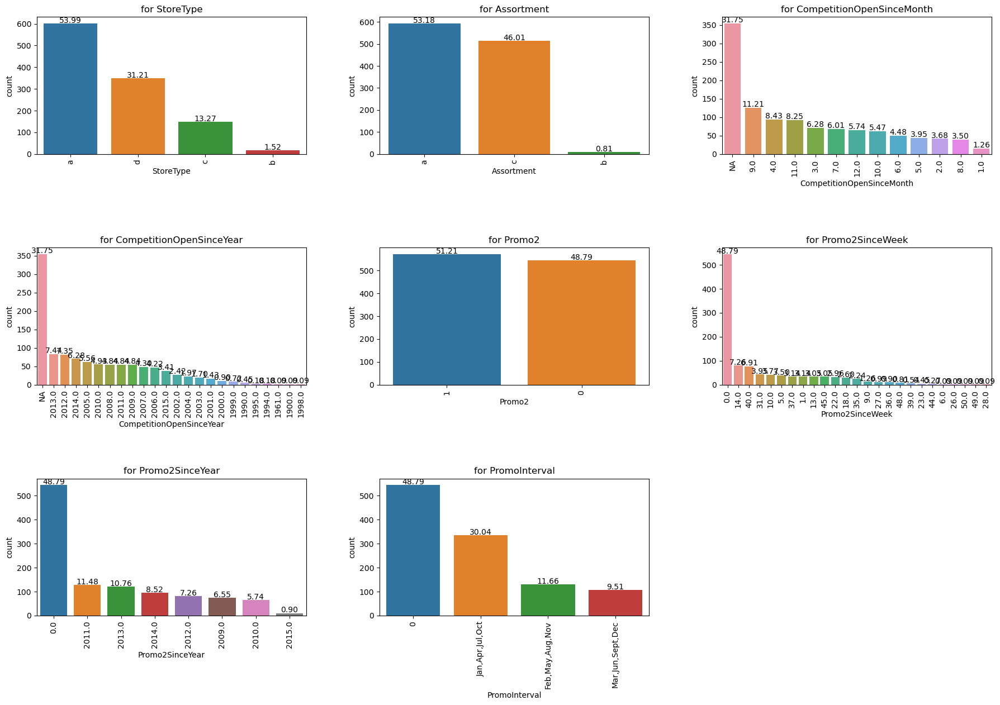

In [18]:
# Count plots for store data

draw_count_plot(store_categorical_fields,store)

### Inferences on store data

- Type A stores make up the majority of stores, accounting for almost 54%.
- Most stores have type A assortments, with low levels of other types of assortments.
- For 31% of stores, there is no competition or data is missing.
- 48.79% of stores do not have promotions (Promo2).
- Promotions are maximum in January, April, July and October.

### For Train Data

In [19]:
# Train Data categoric variables

train_categorical_fields=['DayOfWeek','Open', 'Promo', 'StateHoliday', 'SchoolHoliday']

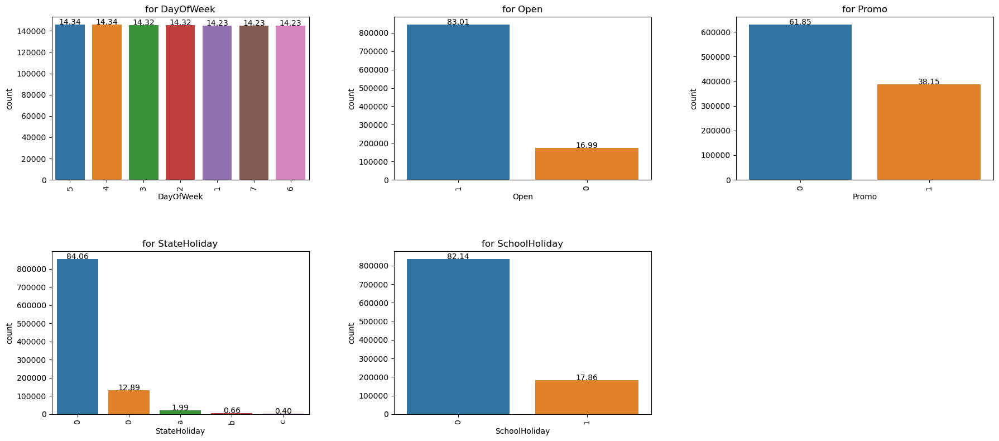

In [20]:
# Count plots for store data

draw_count_plot(train_categorical_fields,train)

### Inferences on train data

- All days of the week have equal contribution which is expected as all 7 days repeat.
- Stores are open for 83% of the times
- promotions are active for around 38% of the times
- school holidays account to more days than state holidays


### Merge Datasets

In [21]:
merged_store_df = train.merge(right=store, on='Store', how='left')

In [22]:
merged_store_df.head()

,Store,DayOfWeek,Date,Sales,Customers,Open,Promo,StateHoliday,SchoolHoliday,StoreType,Assortment,CompetitionDistance,CompetitionOpenSinceMonth,CompetitionOpenSinceYear,Promo2,Promo2SinceWeek,Promo2SinceYear,PromoInterval
0,1,5,2015-07-31,5263,555,1,1,0,1,c,a,1270.0,9.0,2008.0,0,0.0,0.0,0
1,2,5,2015-07-31,6064,625,1,1,0,1,a,a,570.0,11.0,2007.0,1,13.0,2010.0,"Jan,Apr,Jul,Oct"
2,3,5,2015-07-31,8314,821,1,1,0,1,a,a,14130.0,12.0,2006.0,1,14.0,2011.0,"Jan,Apr,Jul,Oct"
3,4,5,2015-07-31,13995,1498,1,1,0,1,c,c,620.0,9.0,2009.0,0,0.0,0.0,0
4,5,5,2015-07-31,4822,559,1,1,0,1,a,a,29910.0,4.0,2015.0,0,0.0,0.0,0


In [23]:
#Checking shape of the merged dataset

merged_store_df.shape

(1017209, 18)

## Bivariate Analysis on Data

### Box Plot Analysis

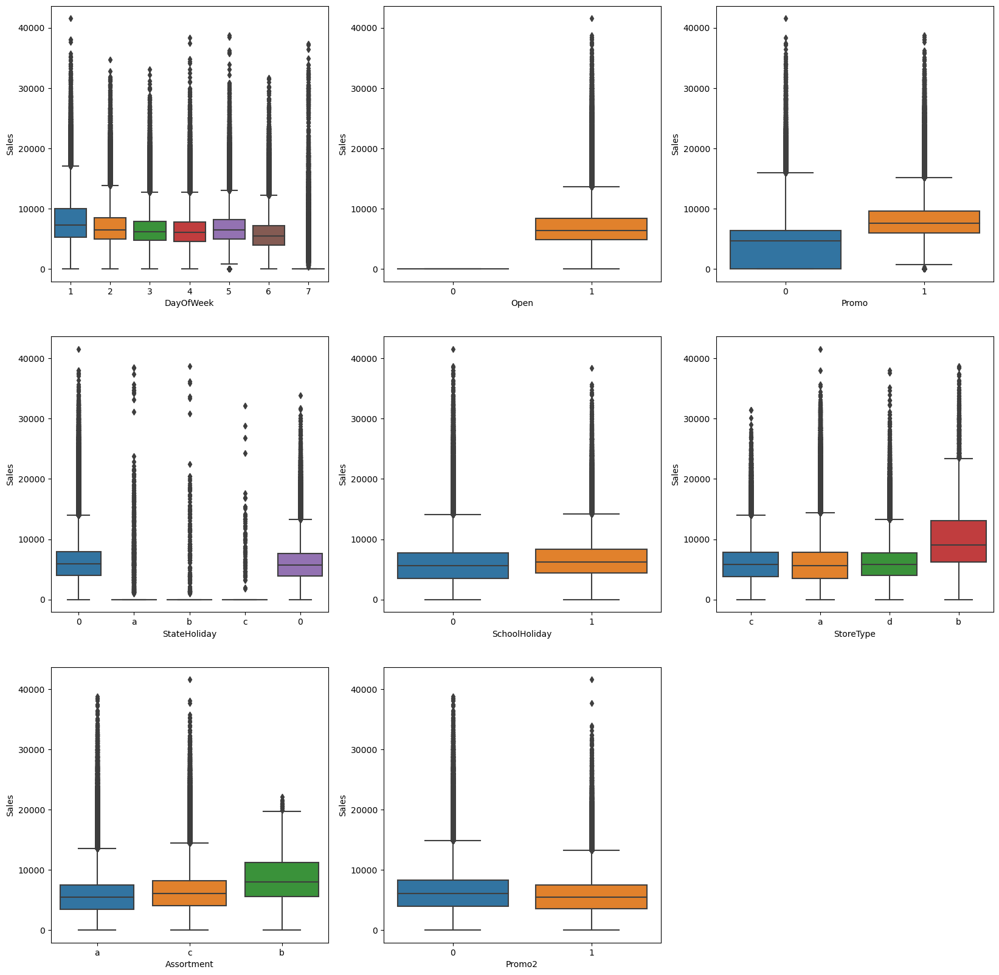

In [24]:
# Boxplots of attributes against Sales

plt.figure(figsize=(20, 20))
plt.subplot(3,3,1)
sns.boxplot(x = 'DayOfWeek', y = 'Sales', data = merged_store_df)
plt.subplot(3,3,2)
sns.boxplot(x = 'Open', y = 'Sales', data = merged_store_df)
plt.subplot(3,3,3)
sns.boxplot(x = 'Promo', y = 'Sales', data = merged_store_df)
plt.subplot(3,3,4)
sns.boxplot(x = 'StateHoliday', y = 'Sales', data = merged_store_df)
plt.subplot(3,3,5)
sns.boxplot(x = 'SchoolHoliday', y = 'Sales', data = merged_store_df)
plt.subplot(3,3,6)
sns.boxplot(x = 'StoreType', y = 'Sales', data = merged_store_df)
plt.subplot(3,3,7)
sns.boxplot(x = 'Assortment', y = 'Sales', data = merged_store_df)
plt.subplot(3,3,8)
sns.boxplot(x = 'Promo2', y = 'Sales', data = merged_store_df)
plt.show()

### Inferences on merged Data

- Sales are higher on 1st, 2nd and 5th weekdays. Sales are very low on 7th weekday.
- Sales are higher when promotion is 1
- On state holidays, a, b and c, sales are low
- School holidays have a very small impact on sales
- Store type B has higher sales than other store types
- Assortment type B has higher sales
- Promo2 does not seem to have much contribution to sales.

### Scatter Plot Analysis

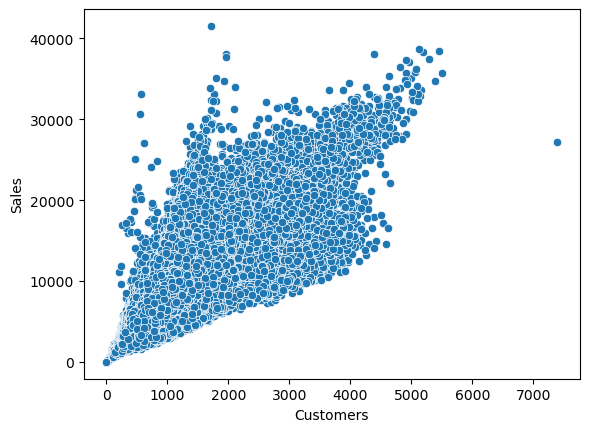

In [25]:
# Boxplots of Customers against Sales

sns.scatterplot(x = 'Customers', y = 'Sales', data = merged_store_df)
plt.show()

There is a positive corelation between customers and sales which is as expected.

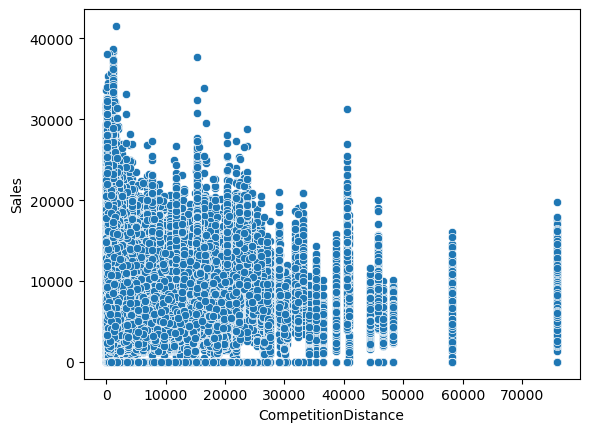

In [26]:
# Boxplots of Customers against Sales

sns.scatterplot(x = 'CompetitionDistance', y = 'Sales', data = merged_store_df)
plt.show()

Competition does not seem to have any correlations against sales

### Multivariate Analysis

#### For categorical variables

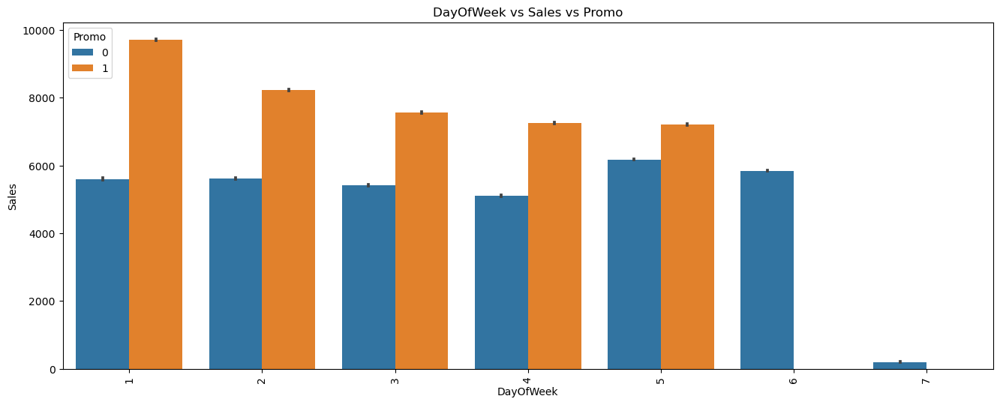

In [27]:
# Checking co-relation between Sales vs Days split by Promo

plt.figure(figsize=(16, 6))
sns.barplot(x='DayOfWeek',y='Sales',hue='Promo',data=merged_store_df)
plt.title("DayOfWeek vs Sales vs Promo")
plt.xticks(rotation = 90)
plt.show()

Promotion has a good co-relation with sales of the stores.

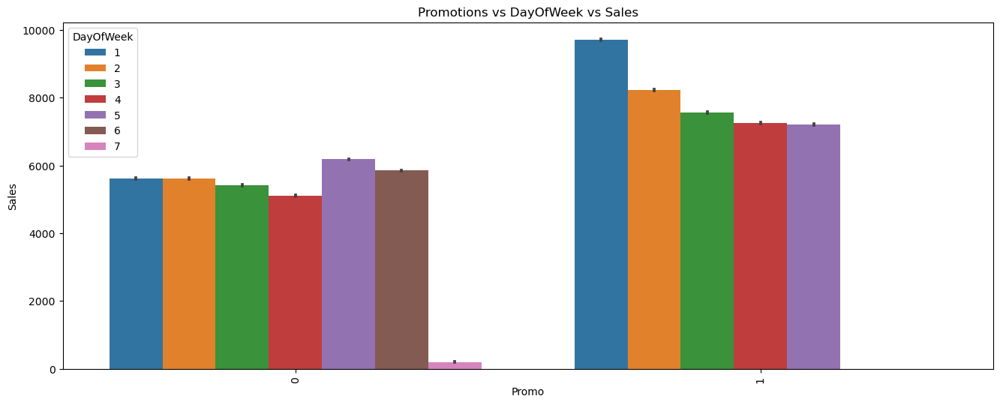

In [28]:
# Checking co-relation between Promo and sales split by Days

plt.figure(figsize=(16, 6))
sns.barplot(x='Promo',y='Sales',hue='DayOfWeek',data=merged_store_df)
plt.title("Promotions vs DayOfWeek vs Sales")
plt.xticks(rotation = 90)
plt.show()

Sales are higher in the initial days of the week if there is promo, and 5,6 if no promo

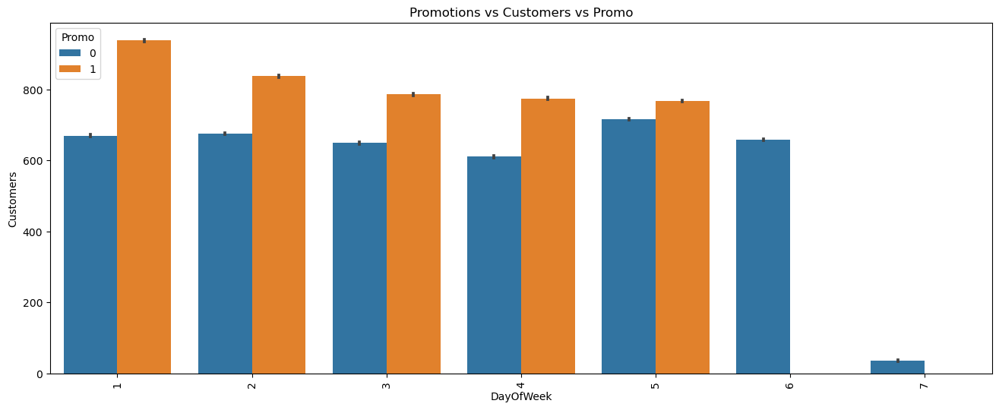

In [29]:
# Checking co-relation between Days vs Customers split by Promo

plt.figure(figsize=(16, 6))
sns.barplot(x='DayOfWeek',y='Customers',hue='Promo',data=merged_store_df)
plt.title("Promotions vs Customers vs Promo")
plt.xticks(rotation = 90)
plt.show()

Customers are higher on weekdays and when promotios are active

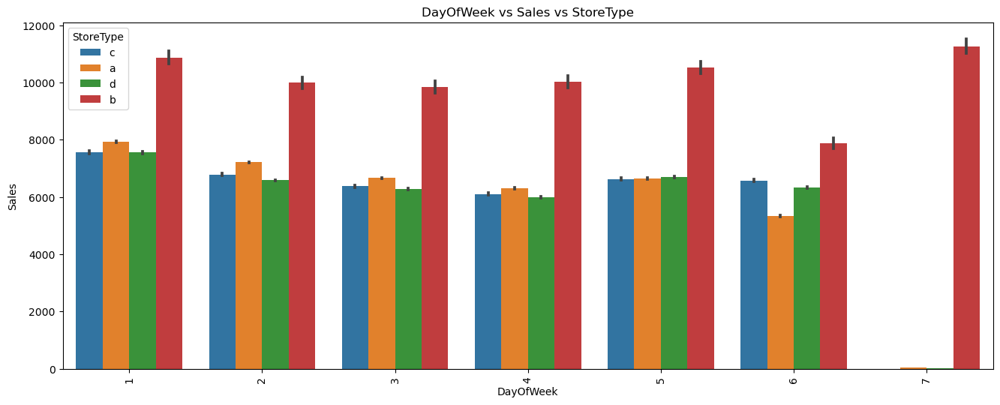

In [30]:
# Checking co-relation between Days vs Sales split by StoreType

plt.figure(figsize=(16, 6))
sns.barplot(x='DayOfWeek',y='Sales',hue='StoreType',data=merged_store_df)
plt.title("DayOfWeek vs Sales vs StoreType")
plt.xticks(rotation = 90)
plt.show()

Sales for store type b is the highest among all days including day 7 where sales for other store type is significantly close to zero.

### Numerical variables analysis

<Figure size 4000x4000 with 0 Axes>

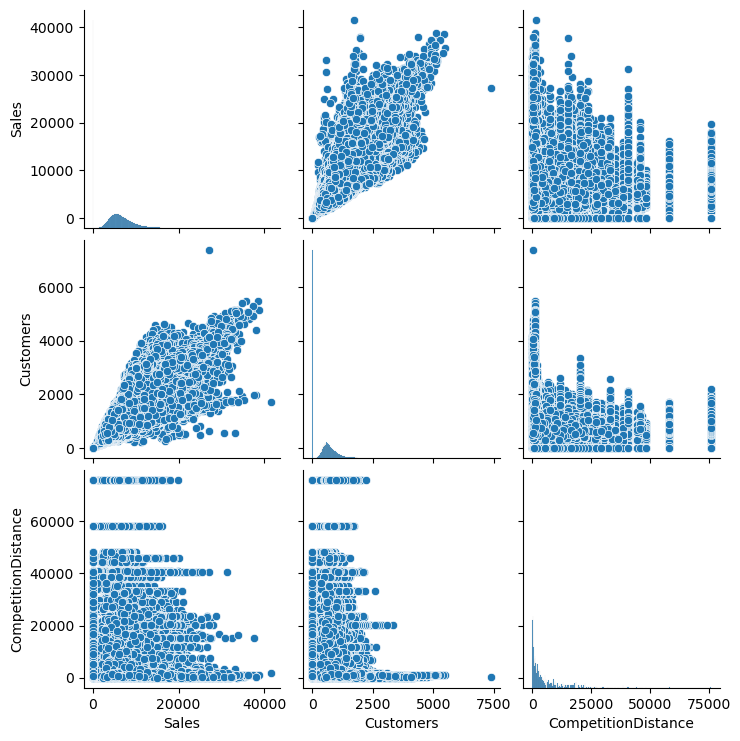

In [31]:
# Pairwise plot

plt.figure(figsize=(40, 40))
sns.pairplot(merged_store_df[['Sales','Customers','CompetitionDistance']])
plt.show()

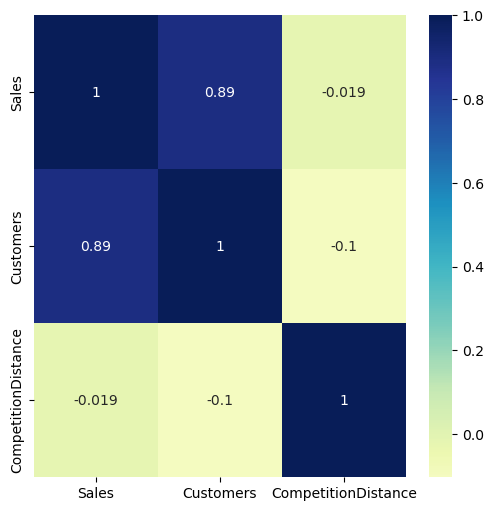

In [32]:
# Checking co-relation for numercial variables

# plot heat map for corr
cor = merged_store_df[['Sales','Customers','CompetitionDistance']].corr()
plt.figure(figsize = (6, 6))
sns.heatmap(cor, annot = True,center=0.4,cmap="YlGnBu")
plt.show()

Sales and customer have a very strong co-relation with a factor of 0.89. For other variables, it is insignificant.

## Utilities.py

In [33]:
#def sanitize_store_data(store):
#    return store

def rename_columns(column):
    """
    Renames certain columns by converting them to int

    Parameters
    ----------
    column : column name
    """
    if column.startswith('DayOfWeek_'):
        return column.replace('.0', '')
    return column

def merge_store_data(dataset, store_modified):
    """
    Merges the dataset with store data

    Parameters
    ----------
    dataset : dataset.
    store_modified: dataframe of stores.
    
    Returns
    ----------
    dataframe: Merged store data
    """
    print(store_modified)

    store_modified['Promo2SinceWeek'] = store_modified['Promo2SinceWeek'].fillna(0)
    store_modified['Promo2SinceYear'] = store_modified['Promo2SinceYear'].fillna(0)
    store_modified['PromoInterval'] = store_modified['PromoInterval'].fillna(0)
    
    # since these stores dont have any competetion, also our area of interest is not in these, we can impute with mean
    store_modified['CompetitionDistance'] = store_modified['CompetitionDistance'].fillna(store_modified['CompetitionDistance'].mean())
    store_modified['CompetitionOpenSinceMonth'] = store_modified['CompetitionOpenSinceMonth'].fillna(0)
    store_modified['CompetitionOpenSinceYear'] = store_modified['CompetitionOpenSinceYear'].fillna(0)

    # Merge the dataframes
    dataset = dataset.reset_index().merge(right=store_modified, on='Store', how='left').set_index('index')
    print(dataset.columns)

    # Creating dummy variable for day of the week
    dummies=pd.get_dummies(dataset['DayOfWeek'],drop_first=True,prefix='DayOfWeek')
    dataset=pd.concat([dataset,dummies],axis=1)
    dataset = dataset.rename(columns = rename_columns)

    # Creating dummy variable for StoreType
    dummies=pd.get_dummies(dataset['StoreType'],drop_first=True,prefix='StoreType')
    dataset=pd.concat([dataset,dummies],axis=1)
    
    # Creating dummy variable for Assortment
    dummies=pd.get_dummies(dataset['Assortment'],drop_first=True,prefix='Assortment')
    dataset=pd.concat([dataset,dummies],axis=1)

    # Dropping DayOfWeek, StoreType and Assortment
    dataset.drop(['DayOfWeek','StoreType','Assortment'],axis=1,inplace=True)

    print(dataset['CompetitionOpenSinceYear'].isna().count())
    
    # convert competetion information to a date
    dataset['CompetitionOpenSince'] = dataset['CompetitionOpenSinceYear'].astype(int).astype(str) + '-' + dataset['CompetitionOpenSinceMonth'].astype(int).astype(str) + '-01'
    
    # Dropping CompetitionOpenSinceMonth, CompetitionOpenSinceYear fields
    dataset.drop(['CompetitionOpenSinceMonth','CompetitionOpenSinceYear'],axis=1,inplace=True)
    dataset.loc[dataset['CompetitionOpenSince']=='0-0-01','CompetitionOpenSince']=np.nan
    dataset['CompetitionOpenSince']=pd.to_datetime(dataset['CompetitionOpenSince'],errors='coerce')
    dataset.drop(['Promo2SinceWeek', 'Promo2SinceYear', 'PromoInterval'], axis=1, inplace=True)
    return dataset

In [34]:
# convert date to datetime
train['Date']=pd.to_datetime(train['Date'],errors='coerce')

In [35]:
train.columns

Index(['Store', 'DayOfWeek', 'Date', 'Sales', 'Customers', 'Open', 'Promo',
       'StateHoliday', 'SchoolHoliday'],
      dtype='object')

since promo2 is dervied from 	Promo2SinceWeek,	Promo2SinceYear,	PromoInterval
we can drop these 3

In [36]:
#Setting date as index

train_df=train.set_index('Date')
train_df.head()

,Store,DayOfWeek,Sales,Customers,Open,Promo,StateHoliday,SchoolHoliday
Date,,,,,,,,
2015-07-31,1,5,5263,555,1,1,0,1
2015-07-31,2,5,6064,625,1,1,0,1
2015-07-31,3,5,8314,821,1,1,0,1
2015-07-31,4,5,13995,1498,1,1,0,1
2015-07-31,5,5,4822,559,1,1,0,1


### Area of interest
Since the area of interest is limited to 1,3,8,9,13,25,29,31 and 46, let us first start with store 46

In [62]:
from statsmodels.tsa.stattools import adfuller
from statsmodels.graphics.tsaplots import plot_acf
from statsmodels.graphics.tsaplots import plot_pacf
from statsmodels.tsa.vector_ar.vecm import coint_johansen
from statsmodels.tsa.vector_ar.vecm import select_coint_rank
from sklearn.metrics import mean_squared_error

#NORM => normalized to get an effective value between 0 and 1.
summary_metrics_df=pd.DataFrame(columns=['Store','Model','NORM_RMSE_SALES','NORM_MAE_SALES','NORM_RMSE_CUSTOMERS','NORM_MAE_CUSTOMERS'])

def summary(sales, forecasted_sales, customers, forecasted_customers, store_id, model):
    """
    prints summary of model performance

    Parameters
    ----------
    sales : sales actual data.
    forecasted_sales: forecasted sales.
    customers: customers actual data
    forecasted_customers: forecasted customers
    store_id: Id of the store
    model: model name.
    
    Returns
    ----------
    dataframe: summary of the observations in a dataframe
    """
    norm_factor_sales = sales.max() - sales.min();
    norm_factor_customers = customers.max() - customers.min()
    norm_rmse_sales = np.sqrt(mean_squared_error(sales, forecasted_sales)).round(2)/norm_factor_sales
    norm_mae_sales = np.round(np.mean(np.abs(sales-forecasted_sales)),2)/norm_factor_sales
    norm_rmse_customers = np.sqrt(mean_squared_error(customers, forecasted_customers)).round(2)/norm_factor_customers
    norm_mae_customers = np.round(np.mean(np.abs(customers-forecasted_customers)),2)/norm_factor_customers
    temp=pd.DataFrame({'Store':[store_id],'Model':[model], 'NORM_RMSE_SALES': [norm_rmse_sales],'NORM_MAE_SALES': [norm_mae_sales] ,
                            'NORM_RMSE_CUSTOMERS': [norm_rmse_customers],'NORM_MAE_CUSTOMERS': [norm_mae_customers]})
    print("Metrics: ", temp)
    return temp

def stationary_test(df):
    """
    conducts stationary test for the dataframe cols.

    Parameters
    ----------
    df : dataframe.
    """
    for c in df.columns:
        print('For ',c)
        print('*'*100)
        r=adfuller(df[c],autolag='AIC')
        print('ADF Statistic=',r[0])
        print('P value=',r[1])
        output = {'test_statistic':round(r[0], 4), 'pvalue':round(r[1], 4), 'n_lags':round(r[2], 4), 'n_obs':r[3]}
        p_value = output['pvalue']
        if p_value <= 0.05:
            print(f" => P-Value = {p_value}. Rejecting Null Hypothesis.")
            print(f" => Series is Stationary.")
        else:
            print(f" => P-Value = {p_value}. Weak evidence to reject the Null Hypothesis.")
            print(f" => Series is Non-Stationary.")

def timeseries_plot(series, column):
    """
    plots timeseries data against a column

    Parameters
    ----------
    series : series data.
    forecasted_sales: forecasted sales.
    column: column name
    """
    fig = plt.figure(figsize=(20, 3))
    series.plot()
    plt.xlabel('Date')
    plt.ylabel(column)
    plt.title('For {}'.format(column))
    plt.show()

def forecasted_timeseries_visualization(series, forecasted_series, column, model):
    """
    prints summary of model performance

    Parameters
    ----------
    series : actual data.
    forecasted_series: forecasted data.
    column: column name.
    model: model name.
    """
    fig = plt.figure(figsize=(20, 3))
    series.plot(label='Actual')
    forecasted_series.plot(label='Forecasted')
    plt.xlabel('Date')
    plt.ylabel(column)
    plt.legend(loc='best')
    plt.title('{} model For {}'.format(model, column))
    plt.show()

def plot_acf_pacf(series, column):
    """
    plots ACF, PACF graphs for the series.

    Parameters
    ----------
    series : time series data.
    column: column name.
    """
    mpl.rcParams['figure.figsize'] = 20, 3
    fig = plt.figure()
    fig.add_subplot(2,1,1)
    plot_acf(series, lags = 75)
    plt.title('ACF for {}'.format(column))
    fig.add_subplot(2,1,2)
    plot_pacf(series, lags = 75)
    plt.title('PACF for {}'.format(column))
    plt.show()


def cointegration_test(df, lag):
    """
    performs co integration test

    Parameters
    ----------
    df : dataframe.
    lag: lag values to consider
    """
    alpha=0.05
    out = coint_johansen(df,-1,lag)
    d = {'0.90':0, '0.95':1, '0.99':2}
    traces = out.lr1
    cvts = out.cvt[:, d[str(1-alpha)]]
    def adjust(val, length= 6): return str(val).ljust(length)

    # Summary
    print('Name   ::  Test Stat > C(95%)    =>   Signif  \n', '--'*20)
    for col, trace, cvt in zip(df.columns, traces, cvts):
        print(adjust(col), ':: ', adjust(round(trace,2), 9), ">", adjust(cvt, 8), ' =>  ' , trace > cvt)

def plot_seasonal_decomposition(series, c, model):
    """
    plots timeseries decomposition of the given series.

    Parameters
    ----------
    series : series data.
    column: column name
    model: model object
    """
    mpl.rcParams['figure.figsize'] = 18, 14
    decomposition = sm.tsa.seasonal_decompose(series, model=model) # additive seasonal index
    fig = decomposition.plot()
    plt.show()
    print('Mean Residual for {}={}'.format(c, decomposition.resid.mean()))

def get_store_data(store_id):
    """
    gets store data for a particular store

    Parameters
    ----------
    store_id : Id of the store.
    
    Returns
    ----------
    dataframe: store data for given store.
    """
    store_data =  train_df[train_df['Store'] == store_id]
    return store_data

def get_imputed_sales_data(store_spec_data):
    """
    gets store data by imputing misisng values

    Parameters
    ----------
    store_spec_data : store data of a particular store
    
    Returns
    ----------
    dataframe: store data for given store by imputing missing values.
    """
    idx = pd.date_range(store_spec_data.index.min(),store_spec_data.index.max())

    store_spec_data = store_spec_data.reindex(idx)

    store_spec_data['Store'] = store_spec_data['Store'].fillna(store_spec_data['Store'].mode()[0])
    store_spec_data['Sales'] = store_spec_data['Sales'].fillna(store_spec_data['Sales'].mean())
    store_spec_data['Customers'] = store_spec_data['Customers'].fillna(store_spec_data['Customers'].mean())
    store_spec_data['Open'] = store_spec_data['Open'].fillna(1)
    store_spec_data['Promo'] = store_spec_data['Promo'].fillna(store_spec_data['Promo'].mode()[0])
    store_spec_data['StateHoliday'] = store_spec_data['StateHoliday'].fillna(0)
    store_spec_data['SchoolHoliday'] = store_spec_data['SchoolHoliday'].fillna(0)
    store_spec_data = merge_store_data(store_spec_data, store)
    return store_spec_data

def analyze_ts_data(store_data):
    """
    Analyzes time series data by performing all essential steps.

    Parameters
    ----------
    store_data : dataframe with data of a store.
    """
    print("time series plot: ")
    timeseries_plot(store_data['Sales'],'Sales')
    print("seasonal decomposition")
    plot_seasonal_decomposition(store_data['Sales'],'Sales','additive')

    print("stationary test:")
    stationary_test(store_data[['Sales','Customers']])

    #Plotting ACF and PACF for sales
    print("ACF and PACF for sales")
    plot_acf_pacf(store_data['Sales'],'Sales')

    #Plotting ACF and PACF for Customers
    print("ACF and PACF for Customers")
    plot_acf_pacf(store_data['Customers'],'Customers')


def create_test_train_split(store_data):
    """
    creates stratified test and train split from the source data.

    Parameters
    ----------
    store_data : data of a store.
    
    Returns
    ----------
    tuple: train, test data.
    """
    #Creating train and test splits
    TRAIN_DATA_LENGTH=900
    store_data_train=store_data.iloc[:TRAIN_DATA_LENGTH,:]
    store_data_test=store_data.iloc[TRAIN_DATA_LENGTH:,:]
    return (store_data_train, store_data_test)

def conduct_pre_tests_varmax(store_data_train):
    """
    conducts tests like jonthans test/ cointegration test (precheck to var models).

    Parameters
    ----------
    store_data_train : data of a store.
    """
    cointegration_test(store_data_train[['Sales','Customers']],10)
    rank_result=select_coint_rank(store_data_train[['Sales','Customers']],-1,10)

    print("\nRank: " + str(rank_result.rank)+"\n")
    if(rank_result.rank == 2):
        print("both the series are stationary, VARMAX can be used directly.")
    elif (rank_result.rank == 1):
        print("both the series are co integrated, VARMAX can be used directly")
    else:
        print("both the series are not cointegrated, necessary transformations should be done to make them stationary")

def forecast_data(store_data_train, store_data_test, model, exog_vars, model_name):
    """
    forecasts data for the test set.

    Parameters
    ----------
    store_data_train : train data of a store.
    store_data_test : test data of store
    model : model object
    exog_vars : array of exogenous variables
    model_name : name of the model
    """
    # Getting lag order
    if(model_name == 'VAR'):
      lag_order = model.k_ar
      print(lag_order)
      forecast_input = store_data_train[['Sales','Customers']].values[-lag_order:]
      print("forecast input: ")
      print(forecast_input)
    elif(model_name == 'VARMAX'):
      forecast_input = store_data_train[['Sales','Customers']].values[-lag_order:]
      print("forecast input: ")
      print(forecast_input)

    exog_test = store_data_test[exog_vars].astype(float)
    fc = model.forecast(y=forecast_input, steps=42,exog_future=exog_test)
    var_forecast = pd.DataFrame(fc, index=store_data_test.index, columns=['Sales','Customers'])
    print("var forecast")
    print(var_forecast)

    #Adding forecasted values
    store_data_test['VarForecastedSales']=var_forecast.Sales
    store_data_test['VarForecastedCustomers']=var_forecast.Customers
    forecasted_timeseries_visualization(store_data_test['Sales'],store_data_test['VarForecastedSales'],'Sales',model_name)

def post_forecast_sanitize(forecast_data):
    """
    sanitizes the forecasted data.

    Parameters
    ----------
    forecast_data : forecasted data.
    
    Returns:
    ----------
    sanitized forecast data.
    """
    forecast_data['Sales'] = forecast_data['Sales'].apply(lambda x: 0 if x < 0 else x)
    forecast_data['Customers'] = forecast_data['Customers'].apply(lambda x: 0 if x < 0 else x)
    return forecast_data

# Store 46

In [38]:
store_46_data = get_store_data(46)

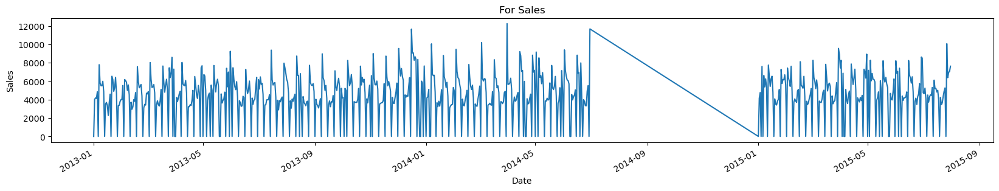

In [39]:
timeseries_plot(store_46_data['Sales'],'Sales')

In [40]:
#looks like some data is missing

store_46_data[store_46_data.index == '2014-09-10']

,Store,DayOfWeek,Sales,Customers,Open,Promo,StateHoliday,SchoolHoliday
Date,,,,,,,,


      Store StoreType Assortment  CompetitionDistance  \
0         1         c          a               1270.0   
1         2         a          a                570.0   
2         3         a          a              14130.0   
3         4         c          c                620.0   
4         5         a          a              29910.0   
...     ...       ...        ...                  ...   
1110   1111         a          a               1900.0   
1111   1112         c          c               1880.0   
1112   1113         a          c               9260.0   
1113   1114         a          c                870.0   
1114   1115         d          c               5350.0   

      CompetitionOpenSinceMonth  CompetitionOpenSinceYear  Promo2  \
0                           9.0                    2008.0       0   
1                          11.0                    2007.0       1   
2                          12.0                    2006.0       1   
3                           9.0        

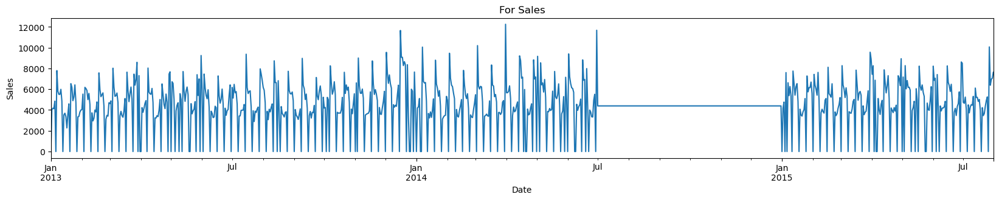

seasonal decomposition


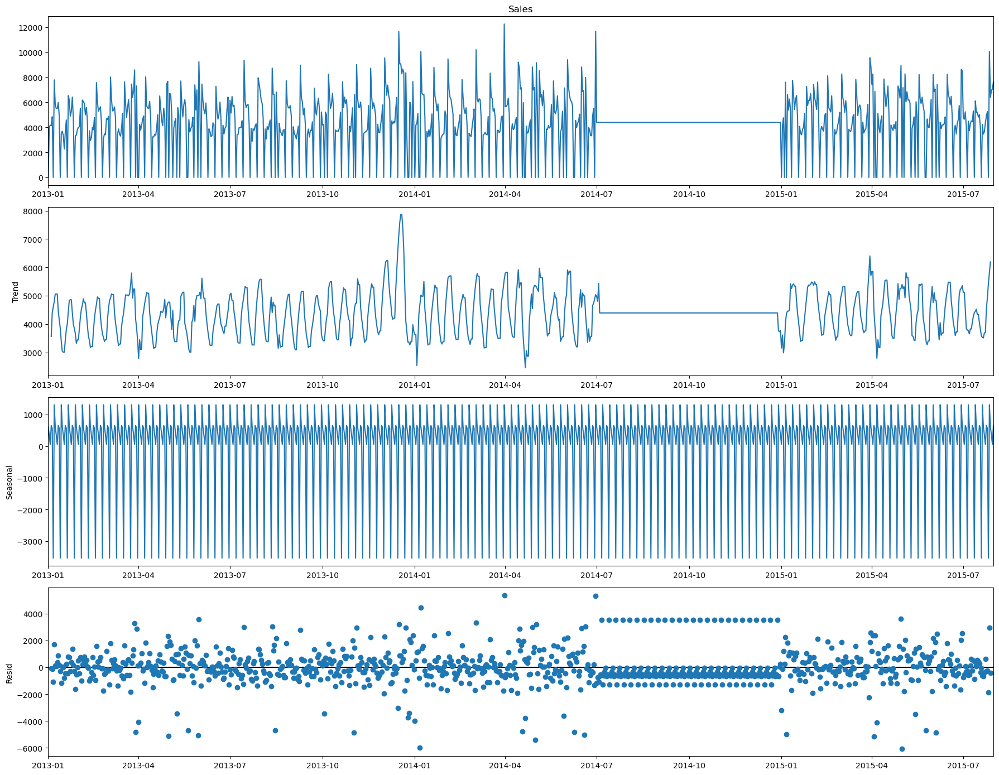

Mean Residual for Sales=0.15751794556212279
stationary test:
For  Sales
****************************************************************************************************
ADF Statistic= -6.195528506367497
P value= 5.978352230772064e-08
 => P-Value = 0.0. Rejecting Null Hypothesis.
 => Series is Stationary.
For  Customers
****************************************************************************************************
ADF Statistic= -6.355751551059884
P value= 2.5453826023986588e-08
 => P-Value = 0.0. Rejecting Null Hypothesis.
 => Series is Stationary.
ACF and PACF for sales


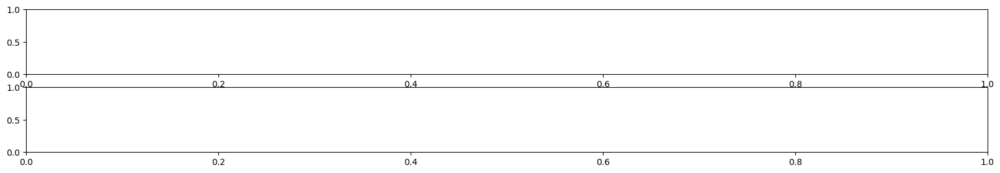

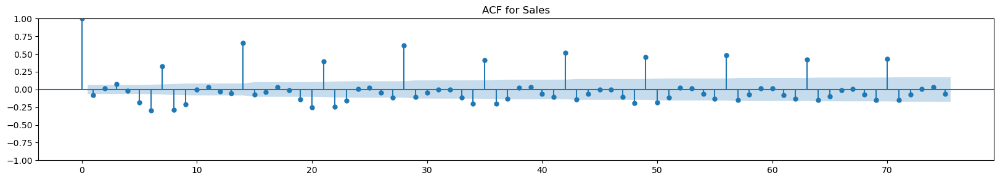

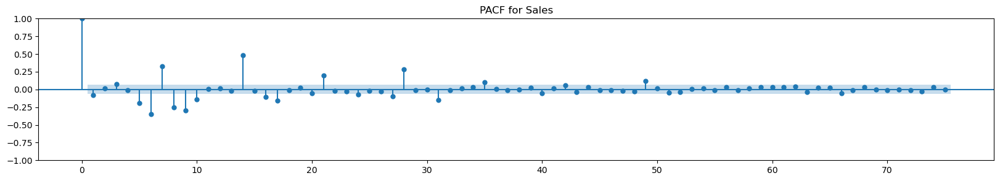

ACF and PACF for Customers


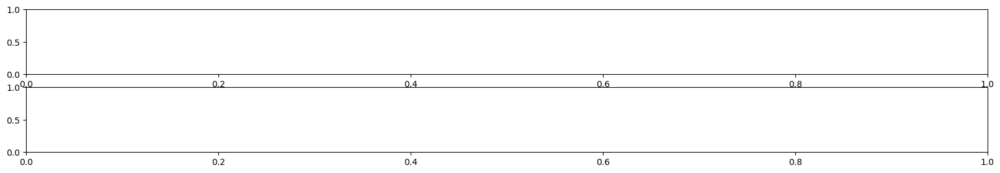

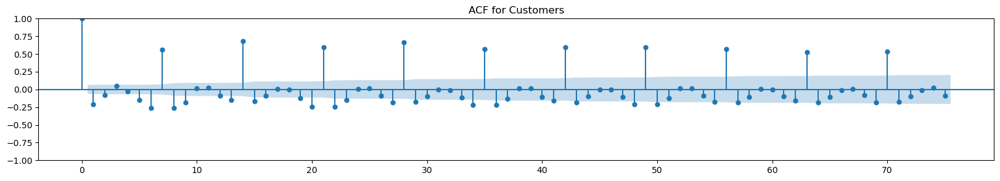

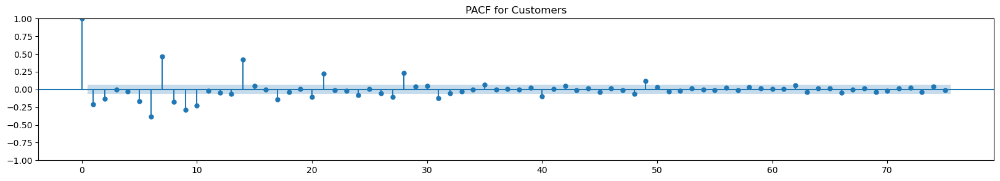

In [41]:
store_46_imputed_data = get_imputed_sales_data(store_46_data)
analyze_ts_data(store_46_imputed_data)

In [42]:
(store_46_imputed_data_train, store_46_imputed_data_test) = create_test_train_split(store_46_imputed_data)

store_46_imputed_data_train.head()

,Store,Sales,Customers,Open,Promo,StateHoliday,SchoolHoliday,CompetitionDistance,Promo2,DayOfWeek_2,DayOfWeek_3,DayOfWeek_4,DayOfWeek_5,DayOfWeek_6,DayOfWeek_7,CompetitionOpenSince
index,,,,,,,,,,,,,,,,
2013-01-01,46.0,0.0,0.0,0.0,0.0,a,1.0,1200.0,1,1,0,0,0,0,0,2005-09-01
2013-01-02,46.0,4016.0,582.0,1.0,0.0,0,1.0,1200.0,1,0,1,0,0,0,0,2005-09-01
2013-01-03,46.0,4177.0,553.0,1.0,0.0,0,1.0,1200.0,1,0,0,1,0,0,0,2005-09-01
2013-01-04,46.0,4125.0,569.0,1.0,0.0,0,1.0,1200.0,1,0,0,0,1,0,0,2005-09-01
2013-01-05,46.0,4848.0,651.0,1.0,0.0,0,0.0,1200.0,1,0,0,0,0,1,0,2005-09-01


In [43]:
store_46_imputed_data_test.head()

,Store,Sales,Customers,Open,Promo,StateHoliday,SchoolHoliday,CompetitionDistance,Promo2,DayOfWeek_2,DayOfWeek_3,DayOfWeek_4,DayOfWeek_5,DayOfWeek_6,DayOfWeek_7,CompetitionOpenSince
index,,,,,,,,,,,,,,,,
2015-06-20,46.0,4812.0,665.0,1.0,0.0,0,0.0,1200.0,1,0,0,0,0,1,0,2005-09-01
2015-06-21,46.0,0.0,0.0,0.0,0.0,0,0.0,1200.0,1,0,0,0,0,0,1,2005-09-01
2015-06-22,46.0,3792.0,528.0,1.0,0.0,0,0.0,1200.0,1,0,0,0,0,0,0,2005-09-01
2015-06-23,46.0,4160.0,536.0,1.0,0.0,0,0.0,1200.0,1,1,0,0,0,0,0,2005-09-01
2015-06-24,46.0,3469.0,511.0,1.0,0.0,0,0.0,1200.0,1,0,1,0,0,0,0,2005-09-01


In [44]:
conduct_pre_tests_varmax(store_46_imputed_data_train)

Name   ::  Test Stat > C(95%)    =>   Signif  
 ----------------------------------------
Sales  ::  74.24     > 12.3212   =>   True
Customers ::  0.3       > 4.1296    =>   False

Rank: 1

both the series are co integrated, VARMAX can be used directly


Rank is 1 which means sales and customers are co integrated so we can use VARMAX model directly

# VAR, VARMAX, ARIMA, SARIMA Models

**Note** :
All the experimentation work is not added in this notebook, only optimal values of p, q are being taken and used commonly as a framework for all the stores based on experimentation.
Here, P=7 and q=1 prformed well for all the stores. these values are being chosen looking at PACF and ACF graphs respectively. and p=7 implies every weekday (monday, tuesday....) would follow same pattern which is meaningful and moving average of 1 unit.

In [45]:
def perform_auto_EDA(store_number):
    """
    performs Auto EDA for the given store.

    Parameters
    ----------
    store_number : store id.
    
    Returns:
    ----------
    tuple : test, train data.
    """
    store_data = get_store_data(store_number)
    timeseries_plot(store_data['Sales'],'Sales')

    store_imputed_data = get_imputed_sales_data(store_data)
    analyze_ts_data(store_imputed_data)
    (store_imputed_data_train, store_imputed_data_test) = create_test_train_split(store_imputed_data)
    print("store_{}_imputed_data_train columns: ".format(store_number))
    print(store_imputed_data_train.columns)
    conduct_pre_tests_varmax(store_imputed_data_train)
    return (store_imputed_data_train, store_imputed_data_test)


In [46]:
def build_VAR_model(store_number, store_imputed_data_train, store_imputed_data_test):
    """
    builds VAR model.

    Parameters
    ----------
    store_number : store id.
    store_imputed_data_train : train data
    store_imputed_data_test : test data
    
    Returns:
    ----------
    dataframe : model summary dataframe.
    """
    exog_vars = ['Promo','SchoolHoliday','DayOfWeek_2','DayOfWeek_3','DayOfWeek_4','DayOfWeek_5','DayOfWeek_6','DayOfWeek_7']
    exog = store_imputed_data_train[exog_vars].astype(float)
    endog = store_imputed_data_train[['Sales', 'Customers']].astype(float)

    # VAR model building
    var_model = sm.tsa.VAR(endog,exog)
    res=var_model.select_order(maxlags=15)
    print(res.summary())

    var_model_final = var_model.fit()
    var_model_final.summary()

    # forecast
    print("forecast: ")
    forecast_data(store_imputed_data_train, store_imputed_data_test, var_model_final, exog_vars,"VAR")
    model_summary_df=summary(store_imputed_data_test['Sales'], store_imputed_data_test['VarForecastedSales'],
    store_imputed_data_test['Customers'], store_imputed_data_test['VarForecastedCustomers'],store_number,'VAR')
    return model_summary_df

In [47]:
def build_varmax_model(store_number, store_imputed_data_train, store_imputed_data_test):
    """
    builds VARMAX model.

    Parameters
    ----------
    store_number : store id.
    store_imputed_data_train : train data
    store_imputed_data_test : test data
    
    Returns:
    ----------
    dataframe : model summary dataframe.
    """
    exog_vars = ['Promo','SchoolHoliday','DayOfWeek_2','DayOfWeek_3','DayOfWeek_4','DayOfWeek_5','DayOfWeek_6','DayOfWeek_7']
    exog = store_imputed_data_train[exog_vars].astype(float)
    endog = store_imputed_data_train[['Sales', 'Customers']].astype(float)

    # VARMAX
    varmax_model = sm.tsa.VARMAX(endog, order=(7,1),  exog=exog)

    varmax_model_final = varmax_model.fit()

    print(varmax_model_final.summary())

    print("forecast: ")
    exog_test = store_imputed_data_test[['Promo','SchoolHoliday','DayOfWeek_2','DayOfWeek_3','DayOfWeek_4','DayOfWeek_5','DayOfWeek_6','DayOfWeek_7']].astype(float)
    endog_test= store_imputed_data_test[['Sales','Customers']]
    varmax_fc = varmax_model_final.predict(start=store_imputed_data_test.index.min(),end=store_imputed_data_test.index.max(),exog=exog_test)
    varmax_forecast = pd.DataFrame(varmax_fc, index=store_imputed_data_test.index, columns=['Sales','Customers'])
    varmax_forecast = post_forecast_sanitize(varmax_forecast)

    store_imputed_data_test['VarmaxForecastedSales'] = varmax_forecast.Sales
    store_imputed_data_test['VarmaxForecastedCustomers'] = varmax_forecast.Customers

    forecasted_timeseries_visualization(store_imputed_data_test['Sales'],store_imputed_data_test['VarmaxForecastedSales'],'Sales','VARMAX')

    model_summary_df=summary(store_imputed_data_test['Sales'], store_imputed_data_test['VarmaxForecastedSales'],
    store_imputed_data_test['Customers'], store_imputed_data_test['VarmaxForecastedCustomers'],store_number,'VARMAX')

    ax = varmax_model_final.impulse_responses(10, orthogonalized=True).plot(figsize=(13,3))
    ax.set(xlabel='t', title='Responses to a shock to `dln_inv`');
    return model_summary_df

In [61]:
  def build_ARIMA_model(store_number):
    """
    builds ARIMA model.

    Parameters
    ----------
    store_number : store id.
    
    Returns:
    ----------
    dataframe : model summary dataframe.
    """
    store_data = get_store_data(store_id)
    store_data_sales = store_data[['Sales']]
    timeseries_plot(store_data['Sales'],'Sales')

    # store_imputed_data = get_imputed_sales_data(store_data_sales)
    idx = pd.date_range(store_data_sales.index.min(),store_data_sales.index.max())

    store_spec_data = store_data_sales.reindex(idx)

    # store_spec_data['Store'] = store_spec_data['Store'].fillna(store_spec_data['Store'].mode()[0])
    store_spec_data['Sales'] = store_spec_data['Sales'].fillna(store_spec_data['Sales'].mean())
    store_imputed_data = store_spec_data

    (store_imputed_data_train, store_imputed_data_test) = create_test_train_split(store_imputed_data)
    print("store_{}_imputed_data_train columns: ".format(store_id))

    arima_mod_a = sm.tsa.ARIMA(store_imputed_data_train, order = (7,0,7)).fit()
    print(arima_mod_a.summary())
    print(store_imputed_data_test.index.min())

    forecast = arima_mod_a.predict(store_imputed_data_test.index.min(), store_imputed_data_test.index.max())

    plt.figure(figsize=(12,4))
    # plt.plot(store_imputed_data_train['Sales'], label='Train')
    plt.plot(store_imputed_data_test['Sales'], label='Test')
    plt.plot(forecast[store_imputed_data_test.index.min():], label='ARIMA forecast')
    plt.legend(loc='best')
    plt.title('Autoregressive integrated moving average (ARIMA) method')
    plt.show()

    sales = store_imputed_data_test['Sales']
    forecasted_sales = forecast[store_imputed_data_test.index.min():]
    norm_factor_sales = sales.max() - sales.min();
    # norm_factor_customers = customers.max() - customers.min()
    norm_rmse_sales = np.sqrt(mean_squared_error(sales, forecasted_sales)).round(2)/norm_factor_sales
    norm_mae_sales = np.round(np.mean(np.abs(sales-forecasted_sales)),2)/norm_factor_sales
    # norm_rmse_customers = np.sqrt(mean_squared_error(customers, forecasted_customers)).round(2)/norm_factor_customers
    # norm_mae_customers = np.round(np.mean(np.abs(customers-forecasted_customers)),2)/norm_factor_customers
    model_summary_df=pd.DataFrame({'Store':store_id,'Model':'ARIMA', 'NORM_RMSE_SALES': [norm_rmse_sales],'NORM_MAE_SALES': [norm_mae_sales] ,
                            # 'NORM_RMSE_CUSTOMERS': [norm_rmse_customers],'NORM_MAE_CUSTOMERS': [norm_mae_customers]})
    })
    print("Metrics: ", model_summary_df)
    return model_summary_df

In [60]:
  def build_SARIMA_model(store_id):
    """
    builds SARIMA model.

    Parameters
    ----------
    store_number : store id.
    
    Returns:
    ----------
    dataframe : model summary dataframe.
    """
    store_data = get_store_data(store_id)
    store_data_sales = store_data[['Sales']]
    timeseries_plot(store_data['Sales'],'Sales')

    # store_imputed_data = get_imputed_sales_data(store_data_sales)
    idx = pd.date_range(store_data_sales.index.min(),store_data_sales.index.max())

    store_spec_data = store_data_sales.reindex(idx)

    # store_spec_data['Store'] = store_spec_data['Store'].fillna(store_spec_data['Store'].mode()[0])
    store_spec_data['Sales'] = store_spec_data['Sales'].fillna(store_spec_data['Sales'].mean())
    store_imputed_data = store_spec_data

    (store_imputed_data_train, store_imputed_data_test) = create_test_train_split(store_imputed_data)
    print("store_{}_imputed_data_train columns: ".format(store_id))

    # arima_mod_a = sm.tsa.ARIMA(store_imputed_data_train, order = (7,0,7)).fit()
    SARIMA_MODEL = sm.tsa.statespace.SARIMAX(store_imputed_data_train,
                                         order=(1, 1, 1),
                                         seasonal_order=(1, 1, 1, 12),
                                         enforce_stationarity=False,
                                         enforce_invertibility=False).fit()

    print(SARIMA_MODEL.summary())
    print(store_imputed_data_test.index.min())

    forecast = SARIMA_MODEL.predict(store_imputed_data_test.index.min(), store_imputed_data_test.index.max())

    plt.figure(figsize=(12,4))
    # plt.plot(store_imputed_data_train['Sales'], label='Train')
    plt.plot(store_imputed_data_test['Sales'], label='Test')
    plt.plot(forecast[store_imputed_data_test.index.min():], label='SARIMA forecast')
    plt.legend(loc='best')
    plt.title('Seasonal Autoregressive integrated moving average (SARIMA) method')
    plt.show()

    sales = store_imputed_data_test['Sales']
    forecasted_sales = forecast[store_imputed_data_test.index.min():]
    norm_factor_sales = sales.max() - sales.min();
    # norm_factor_customers = customers.max() - customers.min()
    norm_rmse_sales = np.sqrt(mean_squared_error(sales, forecasted_sales)).round(2)/norm_factor_sales
    norm_mae_sales = np.round(np.mean(np.abs(sales-forecasted_sales)),2)/norm_factor_sales
    # norm_rmse_customers = np.sqrt(mean_squared_error(customers, forecasted_customers)).round(2)/norm_factor_customers
    # norm_mae_customers = np.round(np.mean(np.abs(customers-forecasted_customers)),2)/norm_factor_customers
    model_summary_df=pd.DataFrame({'Store':store_id,'Model':'SARIMAX', 'NORM_RMSE_SALES': [norm_rmse_sales],'NORM_MAE_SALES': [norm_mae_sales] ,
                            # 'NORM_RMSE_CUSTOMERS': [norm_rmse_customers],'NORM_MAE_CUSTOMERS': [norm_mae_customers]})
    })
    print("Metrics: ", model_summary_df)
    return model_summary_df

## Store wise model building

### Store 1:

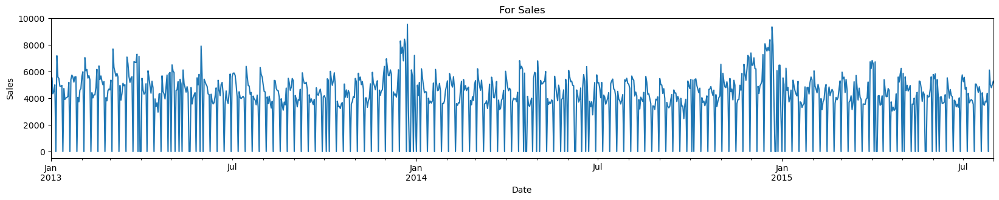

      Store StoreType Assortment  CompetitionDistance  \
0         1         c          a               1270.0   
1         2         a          a                570.0   
2         3         a          a              14130.0   
3         4         c          c                620.0   
4         5         a          a              29910.0   
...     ...       ...        ...                  ...   
1110   1111         a          a               1900.0   
1111   1112         c          c               1880.0   
1112   1113         a          c               9260.0   
1113   1114         a          c                870.0   
1114   1115         d          c               5350.0   

      CompetitionOpenSinceMonth  CompetitionOpenSinceYear  Promo2  \
0                           9.0                    2008.0       0   
1                          11.0                    2007.0       1   
2                          12.0                    2006.0       1   
3                           9.0        

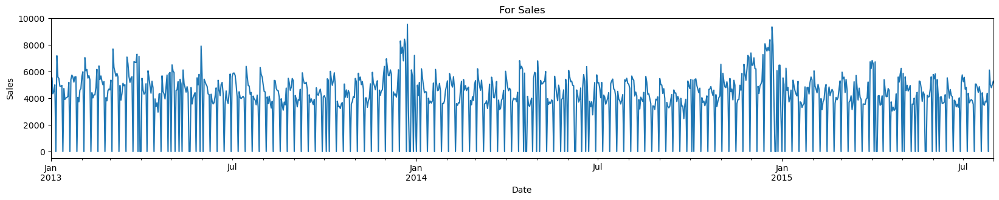

seasonal decomposition


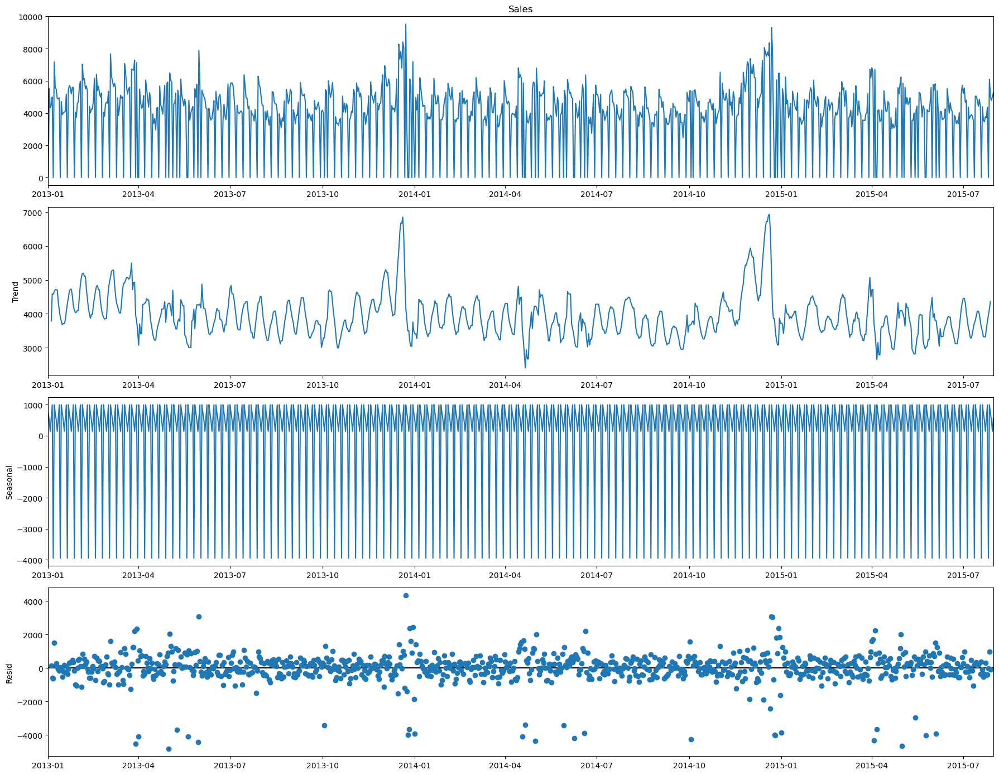

Mean Residual for Sales=0.2284083648049474
stationary test:
For  Sales
****************************************************************************************************
ADF Statistic= -4.368104368168495
P value= 0.00033788346141424956
 => P-Value = 0.0003. Rejecting Null Hypothesis.
 => Series is Stationary.
For  Customers
****************************************************************************************************
ADF Statistic= -3.69684211173453
P value= 0.004157792561711187
 => P-Value = 0.0042. Rejecting Null Hypothesis.
 => Series is Stationary.
ACF and PACF for sales


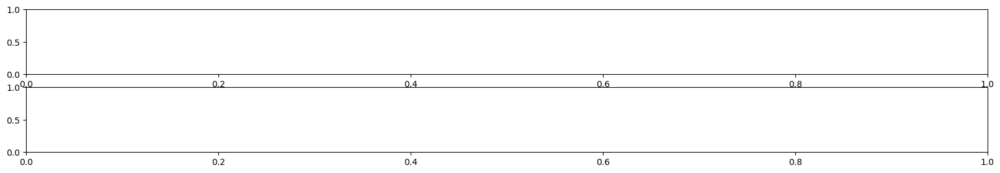

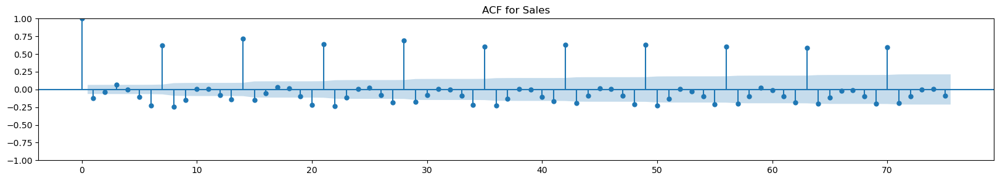

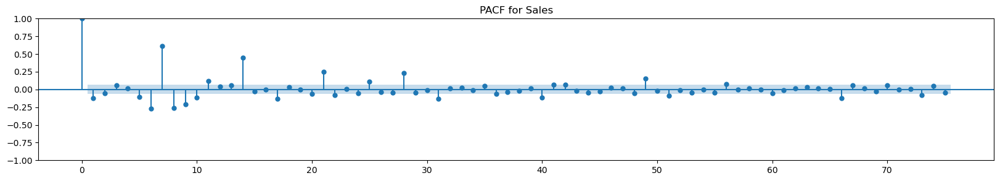

ACF and PACF for Customers


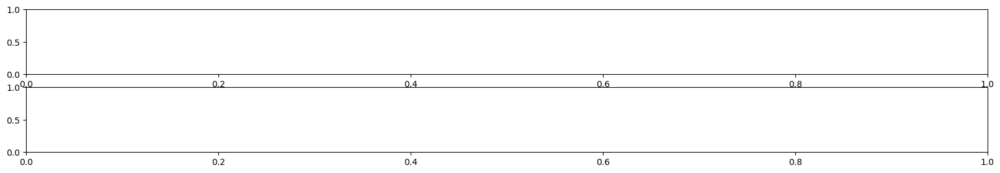

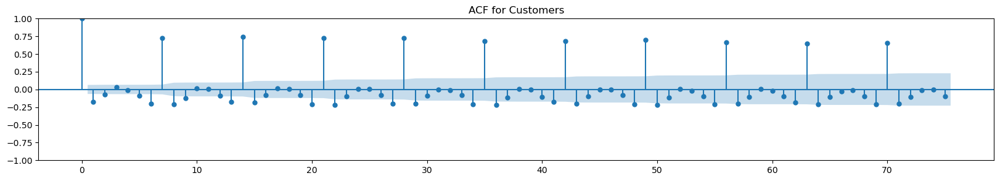

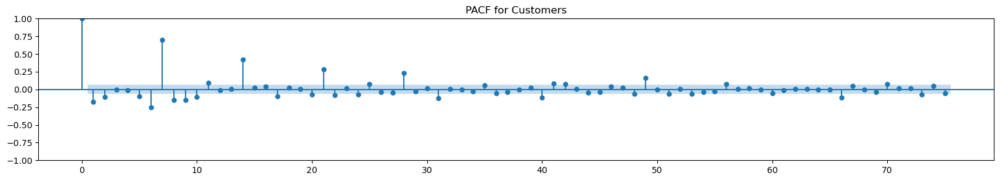

store_1_imputed_data_train columns: 
Index(['Store', 'Sales', 'Customers', 'Open', 'Promo', 'StateHoliday',
       'SchoolHoliday', 'CompetitionDistance', 'Promo2', 'DayOfWeek_2',
       'DayOfWeek_3', 'DayOfWeek_4', 'DayOfWeek_5', 'DayOfWeek_6',
       'DayOfWeek_7', 'CompetitionOpenSince'],
      dtype='object')
Name   ::  Test Stat > C(95%)    =>   Signif  
 ----------------------------------------
Sales  ::  76.58     > 12.3212   =>   True
Customers ::  0.78      > 4.1296    =>   False

Rank: 1

both the series are co integrated, VARMAX can be used directly


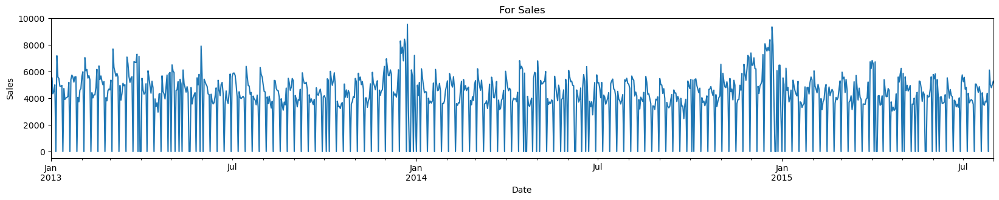

store_1_imputed_data_train columns: 
                               SARIMAX Results                                
Dep. Variable:                  Sales   No. Observations:                  900
Model:                 ARIMA(7, 0, 7)   Log Likelihood               -7683.166
Date:                Sun, 02 Jul 2023   AIC                          15398.331
Time:                        21:27:31   BIC                          15475.169
Sample:                    01-01-2013   HQIC                         15427.684
                         - 06-19-2015                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const       3954.1511    230.224     17.175      0.000    3502.921    4405.381
ar.L1         -0.0603      0.023     -2.677      0.007      -0.104      -0.016
ar.L2         -

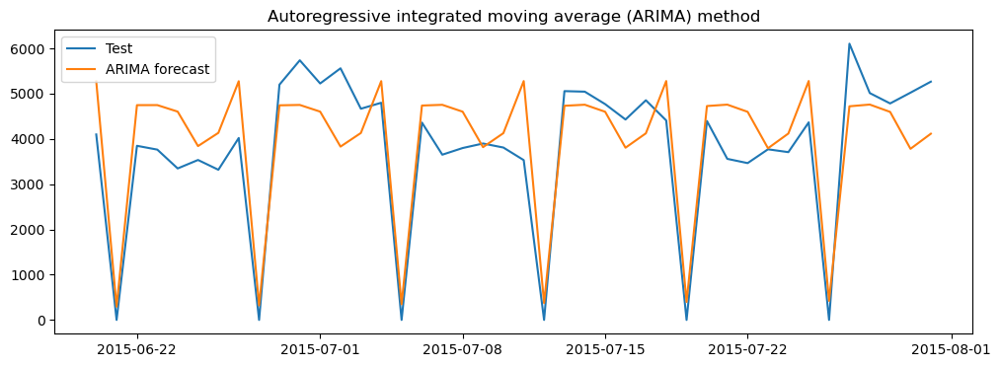

Metrics:     Store  Model  NORM_RMSE_SALES  NORM_MAE_SALES
0      1  ARIMA         0.135395        0.114304


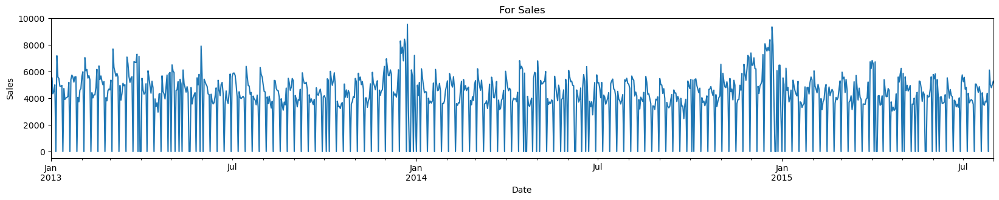

store_1_imputed_data_train columns: 
                                     SARIMAX Results                                      
Dep. Variable:                              Sales   No. Observations:                  900
Model:             SARIMAX(1, 1, 1)x(1, 1, 1, 12)   Log Likelihood               -8102.389
Date:                            Sun, 02 Jul 2023   AIC                          16214.778
Time:                                    21:27:39   BIC                          16238.638
Sample:                                01-01-2013   HQIC                         16223.906
                                     - 06-19-2015                                         
Covariance Type:                              opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.1736      0.102     -1.710      0.087      -0.373       0.02

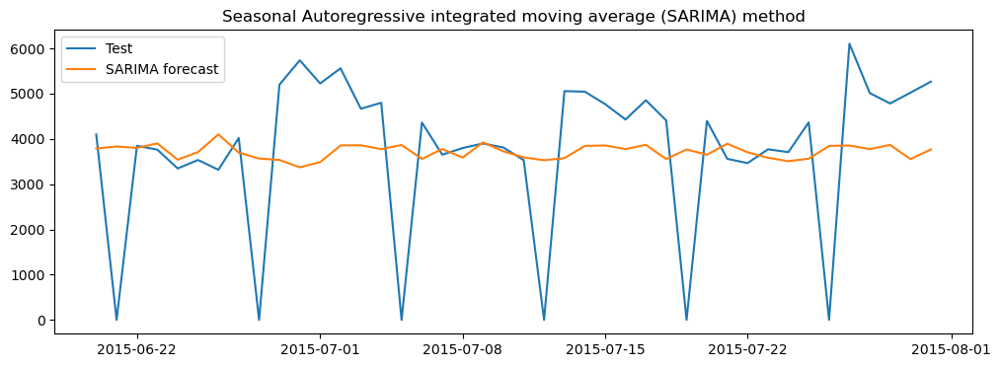

Metrics:     Store    Model  NORM_RMSE_SALES  NORM_MAE_SALES
0      1  SARIMAX         0.278353        0.198723
 VAR Order Selection (* highlights the minimums)  
       AIC         BIC         FPE         HQIC   
--------------------------------------------------
0        20.69       20.79   9.693e+08       20.73
1        20.63      20.75*   9.089e+08       20.67
2        20.62       20.76   9.020e+08       20.67
3        20.61       20.77   8.927e+08       20.67
4        20.61       20.80   8.948e+08       20.68
5        20.61       20.81   8.895e+08       20.68
6        20.59       20.82   8.786e+08       20.68
7        20.58       20.83   8.675e+08       20.68
8        20.58       20.85   8.652e+08       20.68
9        20.58       20.87   8.624e+08       20.69
10       20.55       20.86   8.386e+08      20.67*
11      20.55*       20.88  8.383e+08*       20.67
12       20.55       20.91   8.416e+08       20.69
13       20.55       20.93   8.394e+08       20.69
14       20.55       

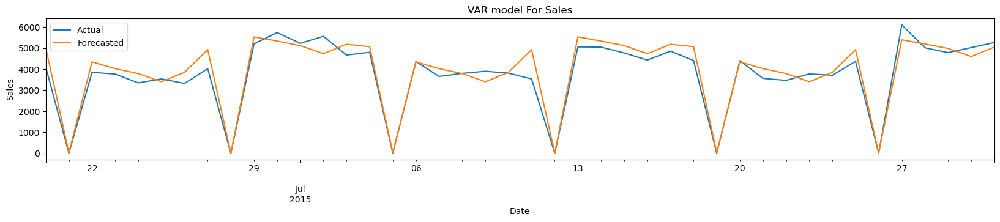

Metrics:     Store Model  NORM_RMSE_SALES  NORM_MAE_SALES  NORM_RMSE_CUSTOMERS  \
0      1   VAR         0.074815        0.057053             0.091389   

   NORM_MAE_CUSTOMERS  
0            0.068284  
                             Statespace Model Results                             
Dep. Variable:     ['Sales', 'Customers']   No. Observations:                  900
Model:                        VARMAX(7,1)   Log Likelihood              -11879.728
                              + intercept   AIC                          23865.457
Date:                    Sun, 02 Jul 2023   BIC                          24119.984
Time:                            21:29:12   HQIC                         23962.688
Sample:                        01-01-2013                                         
                             - 06-19-2015                                         
Covariance Type:                      opg                                         
Ljung-Box (L1) (Q):             0.00, 0.01   Jarqu

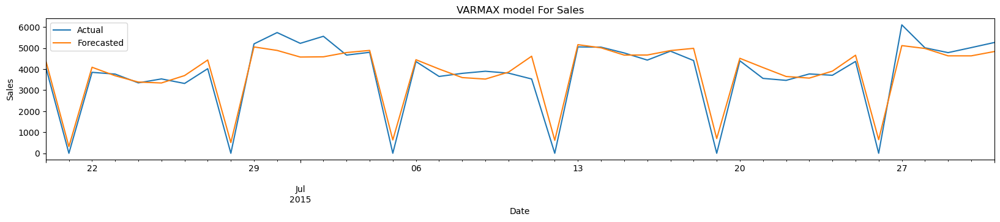

Metrics:     Store   Model  NORM_RMSE_SALES  NORM_MAE_SALES  NORM_RMSE_CUSTOMERS  \
0      1  VARMAX         0.073317         0.05706             0.074134   

   NORM_MAE_CUSTOMERS  
0            0.057745  


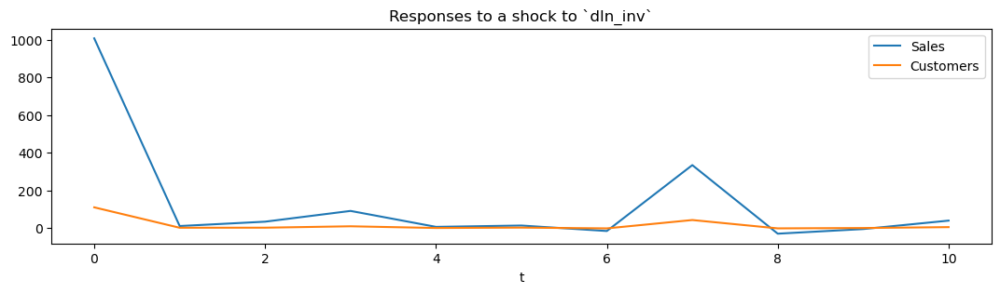

In [63]:
store_id = 1
(store_data_train, store_data_test) = perform_auto_EDA(store_id)

# ARIMA Model
model_metrics_summary = build_ARIMA_model(store_id)
summary_metrics_df = pd.concat([summary_metrics_df, model_metrics_summary])

# SARIMA Model
model_metrics_summary = build_SARIMA_model(store_id)
summary_metrics_df = pd.concat([summary_metrics_df, model_metrics_summary])

# VAR Model
model_metrics_summary = build_VAR_model(store_id, store_data_train, store_data_test)
summary_metrics_df = pd.concat([summary_metrics_df, model_metrics_summary])

# VARMAX Model
model_metrics_summary = build_varmax_model(store_id, store_data_train, store_data_test)
summary_metrics_df = pd.concat([summary_metrics_df, model_metrics_summary])

With a normalized RMSE of 0.073317, which means the forcasted data is 93% close to the actual values. VARMAX performed well

### Store 3

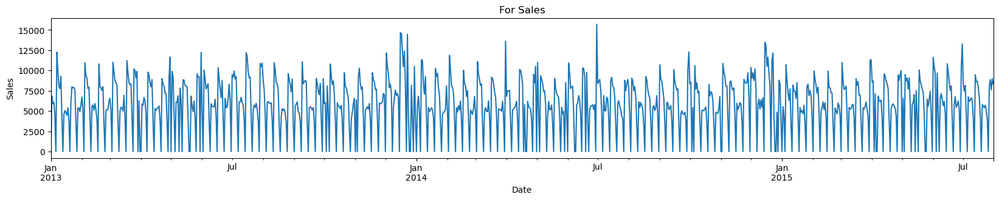

      Store StoreType Assortment  CompetitionDistance  \
0         1         c          a               1270.0   
1         2         a          a                570.0   
2         3         a          a              14130.0   
3         4         c          c                620.0   
4         5         a          a              29910.0   
...     ...       ...        ...                  ...   
1110   1111         a          a               1900.0   
1111   1112         c          c               1880.0   
1112   1113         a          c               9260.0   
1113   1114         a          c                870.0   
1114   1115         d          c               5350.0   

      CompetitionOpenSinceMonth  CompetitionOpenSinceYear  Promo2  \
0                           9.0                    2008.0       0   
1                          11.0                    2007.0       1   
2                          12.0                    2006.0       1   
3                           9.0        

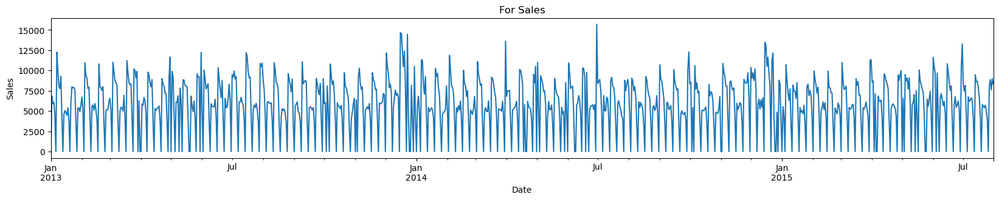

seasonal decomposition


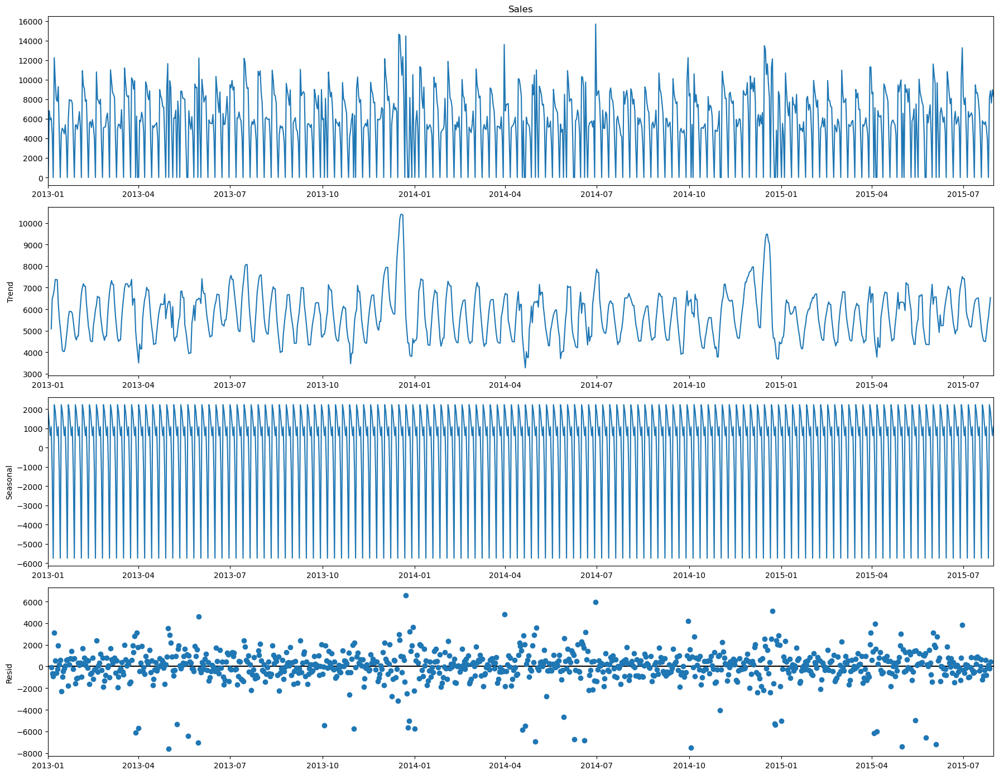

Mean Residual for Sales=0.3866248777597937
stationary test:
For  Sales
****************************************************************************************************
ADF Statistic= -5.911548396935852
P value= 2.6316169036390814e-07
 => P-Value = 0.0. Rejecting Null Hypothesis.
 => Series is Stationary.
For  Customers
****************************************************************************************************
ADF Statistic= -5.522482536287638
P value= 1.8641472850713873e-06
 => P-Value = 0.0. Rejecting Null Hypothesis.
 => Series is Stationary.
ACF and PACF for sales


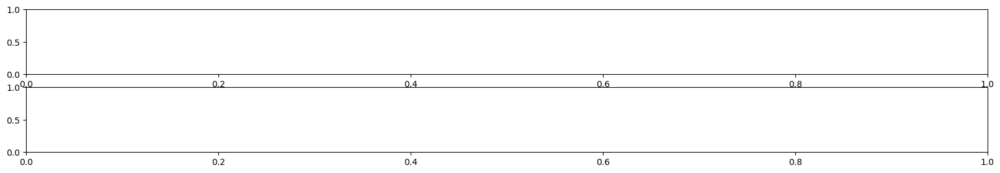

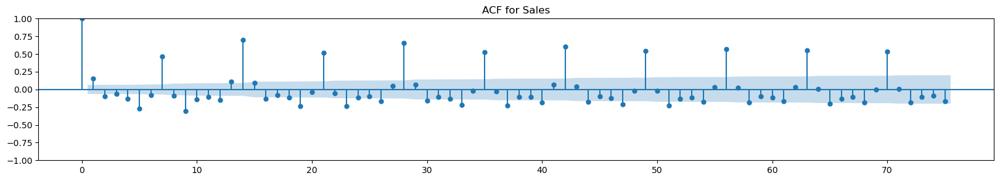

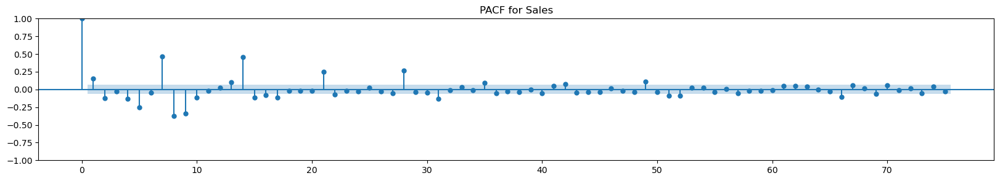

ACF and PACF for Customers


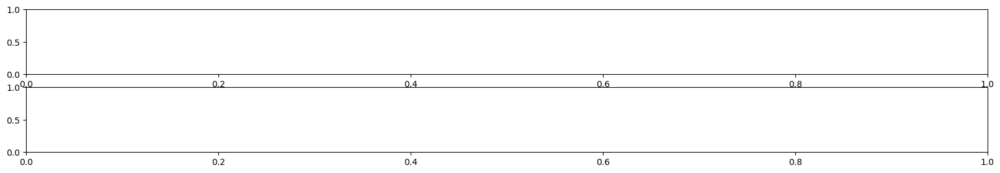

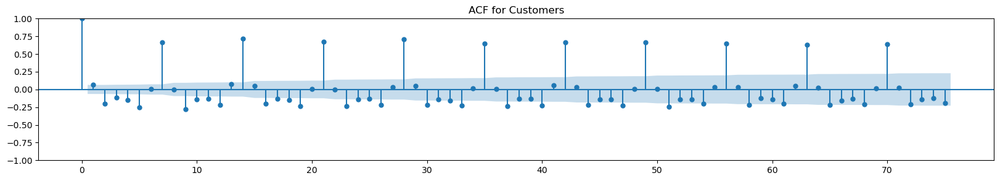

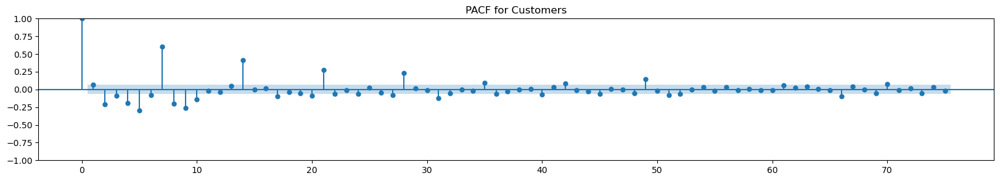

store_3_imputed_data_train columns: 
Index(['Store', 'Sales', 'Customers', 'Open', 'Promo', 'StateHoliday',
       'SchoolHoliday', 'CompetitionDistance', 'Promo2', 'DayOfWeek_2',
       'DayOfWeek_3', 'DayOfWeek_4', 'DayOfWeek_5', 'DayOfWeek_6',
       'DayOfWeek_7', 'CompetitionOpenSince'],
      dtype='object')
Name   ::  Test Stat > C(95%)    =>   Signif  
 ----------------------------------------
Sales  ::  103.88    > 12.3212   =>   True
Customers ::  0.45      > 4.1296    =>   False

Rank: 1

both the series are co integrated, VARMAX can be used directly


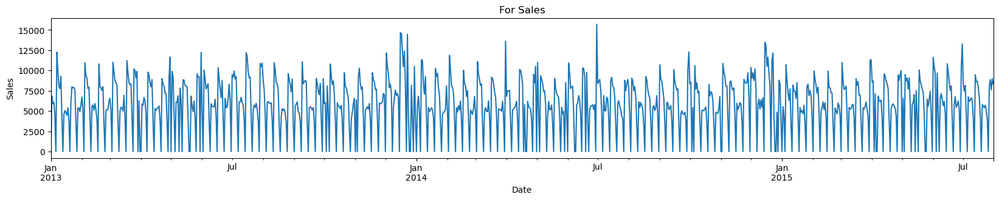

store_3_imputed_data_train columns: 
                               SARIMAX Results                                
Dep. Variable:                  Sales   No. Observations:                  900
Model:                 ARIMA(7, 0, 7)   Log Likelihood               -8217.358
Date:                Sun, 02 Jul 2023   AIC                          16466.717
Time:                        21:29:45   BIC                          16543.555
Sample:                    01-01-2013   HQIC                         16496.069
                         - 06-19-2015                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const       5735.7166    164.410     34.887      0.000    5413.478    6057.955
ar.L1         -0.0431      0.095     -0.452      0.651      -0.230       0.144
ar.L2         -

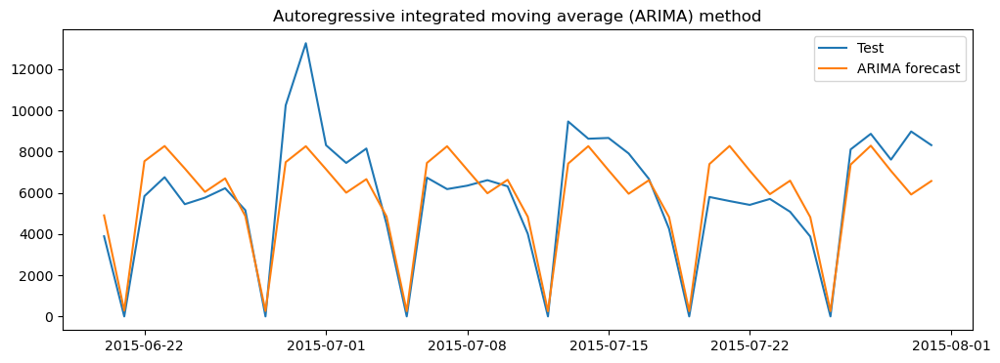

Metrics:     Store  Model  NORM_RMSE_SALES  NORM_MAE_SALES
0      3  ARIMA         0.113494        0.086116


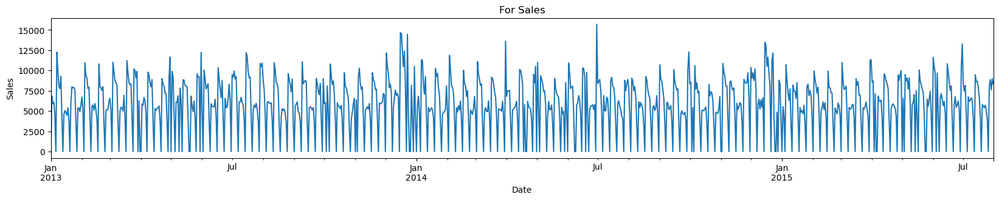

store_3_imputed_data_train columns: 
                                     SARIMAX Results                                      
Dep. Variable:                              Sales   No. Observations:                  900
Model:             SARIMAX(1, 1, 1)x(1, 1, 1, 12)   Log Likelihood               -8558.590
Date:                            Sun, 02 Jul 2023   AIC                          17127.180
Time:                                    21:29:56   BIC                          17151.040
Sample:                                01-01-2013   HQIC                         17136.308
                                     - 06-19-2015                                         
Covariance Type:                              opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.1656      0.115      1.446      0.148      -0.059       0.39

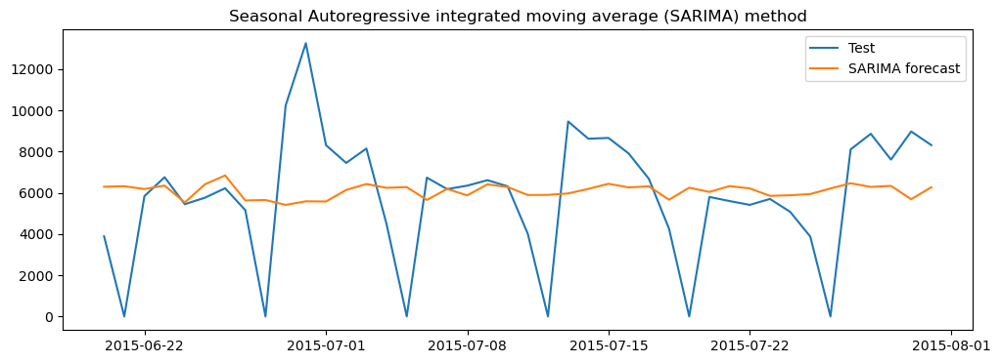

Metrics:     Store    Model  NORM_RMSE_SALES  NORM_MAE_SALES
0      3  SARIMAX         0.230728         0.16604
 VAR Order Selection (* highlights the minimums)  
       AIC         BIC         FPE         HQIC   
--------------------------------------------------
0        22.45       22.54   5.607e+09       22.48
1        22.43       22.55   5.523e+09       22.48
2        22.42       22.56   5.466e+09       22.48
3        22.37      22.53*   5.204e+09       22.43
4        22.37       22.56   5.214e+09       22.44
5        22.38       22.58   5.225e+09       22.46
6        22.37       22.60   5.213e+09       22.46
7        22.35       22.60   5.090e+09       22.45
8        22.32       22.59   4.943e+09       22.42
9        22.32       22.61   4.915e+09       22.43
10       22.30       22.61   4.825e+09      22.42*
11       22.30       22.63   4.831e+09       22.43
12       22.31       22.66   4.869e+09       22.44
13       22.30       22.68   4.847e+09       22.45
14      22.29*       

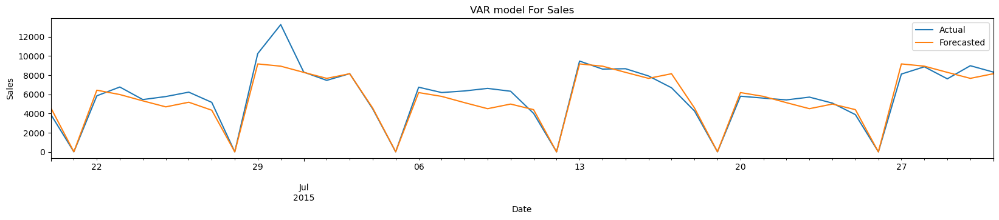

Metrics:     Store Model  NORM_RMSE_SALES  NORM_MAE_SALES  NORM_RMSE_CUSTOMERS  \
0      3   VAR          0.07424        0.046509              0.06805   

   NORM_MAE_CUSTOMERS  
0            0.055168  
                             Statespace Model Results                             
Dep. Variable:     ['Sales', 'Customers']   No. Observations:                  900
Model:                        VARMAX(7,1)   Log Likelihood              -12588.725
                              + intercept   AIC                          25283.451
Date:                    Sun, 02 Jul 2023   BIC                          25537.978
Time:                            21:31:25   HQIC                         25380.682
Sample:                        01-01-2013                                         
                             - 06-19-2015                                         
Covariance Type:                      opg                                         
Ljung-Box (L1) (Q):             0.03, 0.25   Jarqu

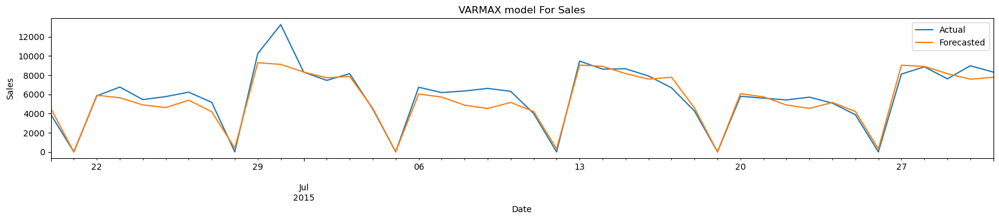

Metrics:     Store   Model  NORM_RMSE_SALES  NORM_MAE_SALES  NORM_RMSE_CUSTOMERS  \
0      3  VARMAX            0.073        0.048665             0.066325   

   NORM_MAE_CUSTOMERS  
0            0.055112  


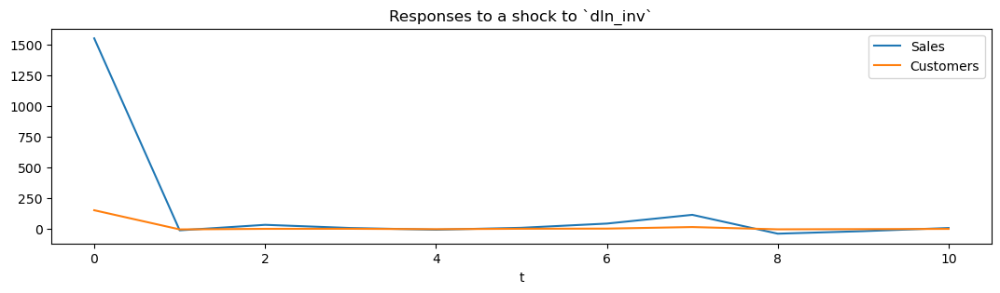

In [64]:
store_id = 3
(store_data_train, store_data_test) = perform_auto_EDA(store_id)

# ARIMA Model
model_metrics_summary = build_ARIMA_model(store_id)
summary_metrics_df = pd.concat([summary_metrics_df, model_metrics_summary])

# SARIMA Model
model_metrics_summary = build_SARIMA_model(store_id)
summary_metrics_df = pd.concat([summary_metrics_df, model_metrics_summary])

# VAR Model
model_metrics_summary = build_VAR_model(store_id, store_data_train, store_data_test)
summary_metrics_df = pd.concat([summary_metrics_df, model_metrics_summary])

# VARMAX Model
model_metrics_summary = build_varmax_model(store_id, store_data_train, store_data_test)
summary_metrics_df = pd.concat([summary_metrics_df, model_metrics_summary])

With a normalized RMSE of 0.073, which means the forcasted data is 93% close to the actual values. VARMAX performed well 

### Store 8

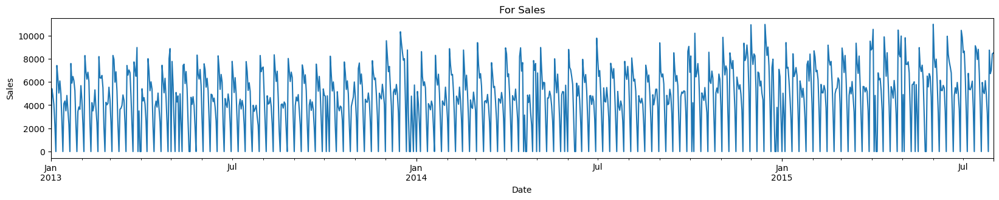

      Store StoreType Assortment  CompetitionDistance  \
0         1         c          a               1270.0   
1         2         a          a                570.0   
2         3         a          a              14130.0   
3         4         c          c                620.0   
4         5         a          a              29910.0   
...     ...       ...        ...                  ...   
1110   1111         a          a               1900.0   
1111   1112         c          c               1880.0   
1112   1113         a          c               9260.0   
1113   1114         a          c                870.0   
1114   1115         d          c               5350.0   

      CompetitionOpenSinceMonth  CompetitionOpenSinceYear  Promo2  \
0                           9.0                    2008.0       0   
1                          11.0                    2007.0       1   
2                          12.0                    2006.0       1   
3                           9.0        

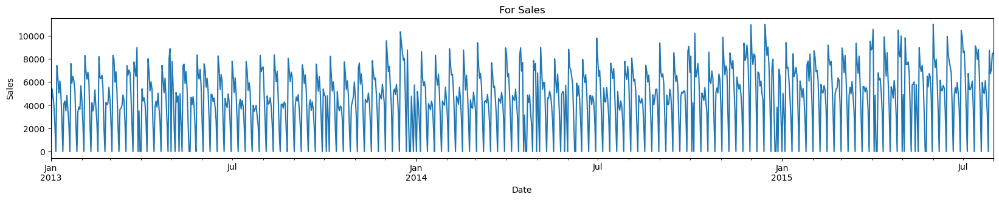

seasonal decomposition


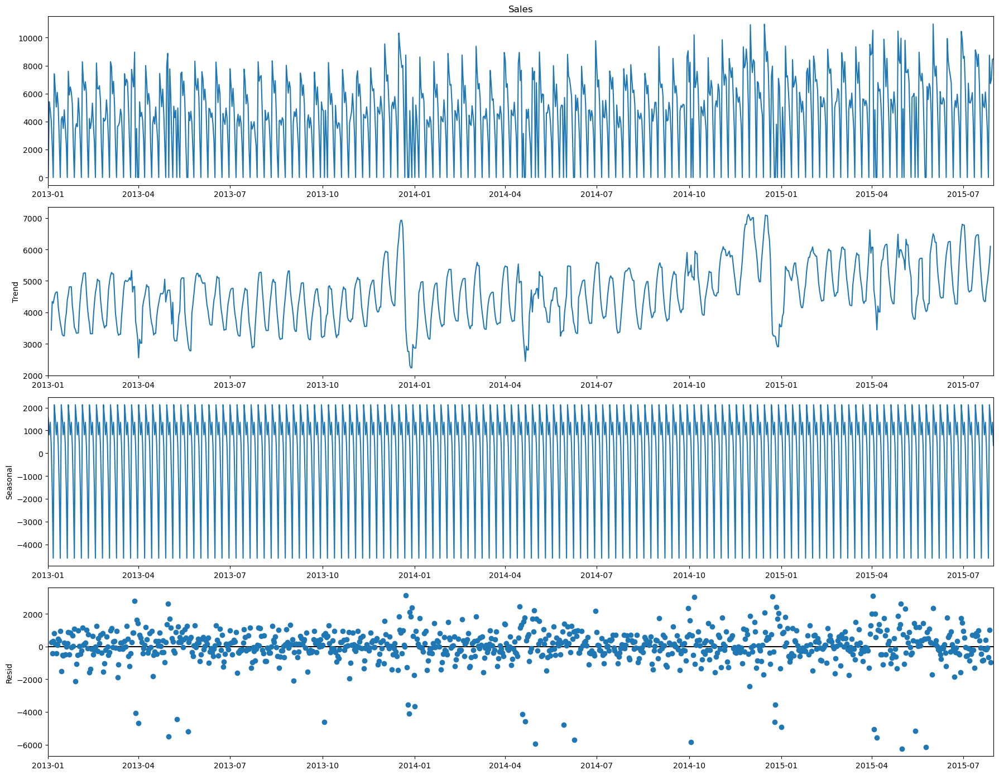

Mean Residual for Sales=-0.3252549589016696
stationary test:
For  Sales
****************************************************************************************************
ADF Statistic= -3.5660367081916773
P value= 0.0064445323131710735
 => P-Value = 0.0064. Rejecting Null Hypothesis.
 => Series is Stationary.
For  Customers
****************************************************************************************************
ADF Statistic= -3.9903253354820385
P value= 0.0014620265446040738
 => P-Value = 0.0015. Rejecting Null Hypothesis.
 => Series is Stationary.
ACF and PACF for sales


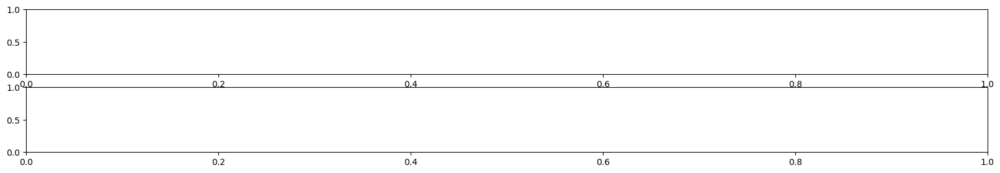

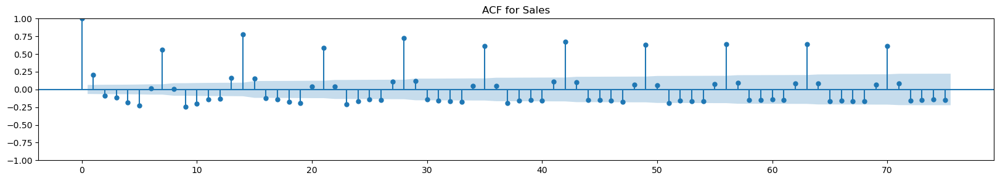

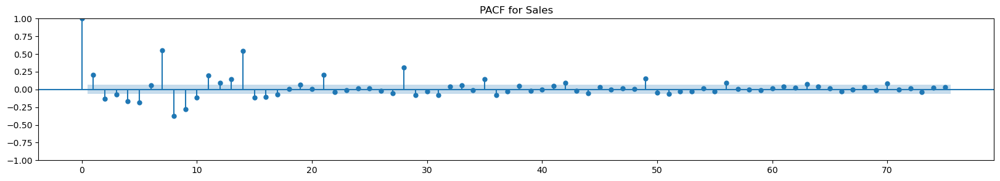

ACF and PACF for Customers


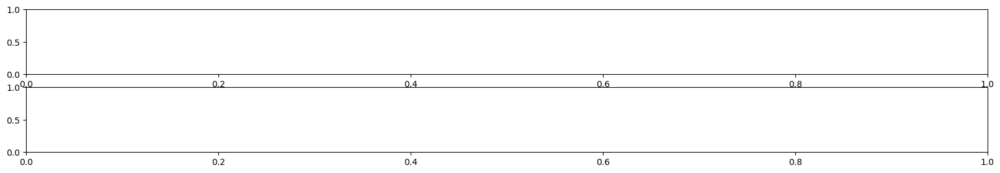

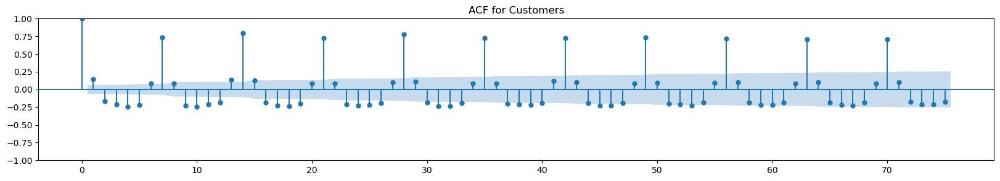

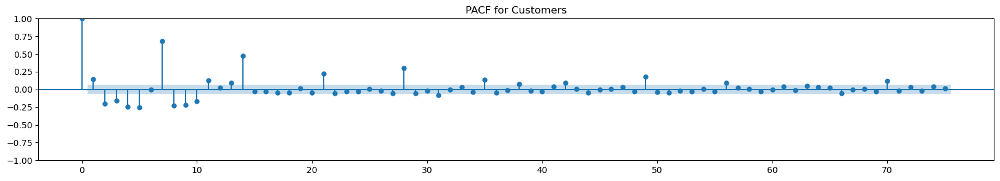

store_8_imputed_data_train columns: 
Index(['Store', 'Sales', 'Customers', 'Open', 'Promo', 'StateHoliday',
       'SchoolHoliday', 'CompetitionDistance', 'Promo2', 'DayOfWeek_2',
       'DayOfWeek_3', 'DayOfWeek_4', 'DayOfWeek_5', 'DayOfWeek_6',
       'DayOfWeek_7', 'CompetitionOpenSince'],
      dtype='object')
Name   ::  Test Stat > C(95%)    =>   Signif  
 ----------------------------------------
Sales  ::  60.58     > 12.3212   =>   True
Customers ::  0.35      > 4.1296    =>   False

Rank: 1

both the series are co integrated, VARMAX can be used directly


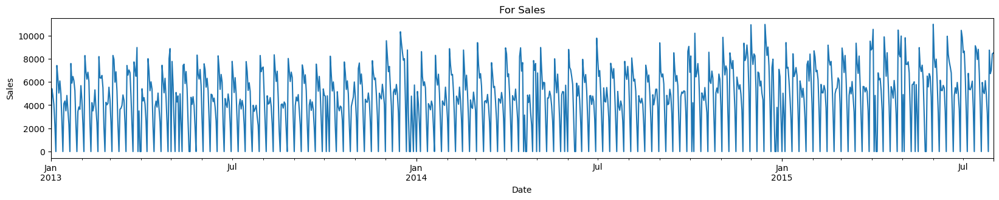

store_8_imputed_data_train columns: 
                               SARIMAX Results                                
Dep. Variable:                  Sales   No. Observations:                  900
Model:                 ARIMA(7, 0, 7)   Log Likelihood               -7938.981
Date:                Sun, 02 Jul 2023   AIC                          15909.962
Time:                        21:31:58   BIC                          15986.801
Sample:                    01-01-2013   HQIC                         15939.315
                         - 06-19-2015                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const       4571.1889    377.919     12.096      0.000    3830.482    5311.896
ar.L1         -0.0360      0.028     -1.296      0.195      -0.090       0.018
ar.L2         -

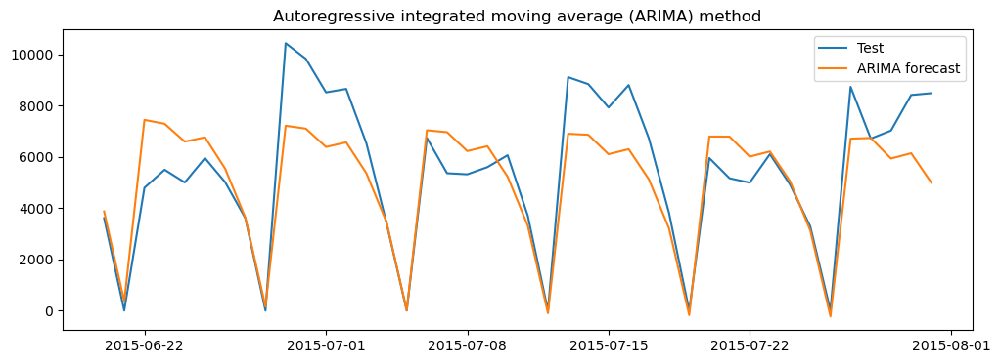

Metrics:     Store  Model  NORM_RMSE_SALES  NORM_MAE_SALES
0      8  ARIMA         0.144482        0.110452


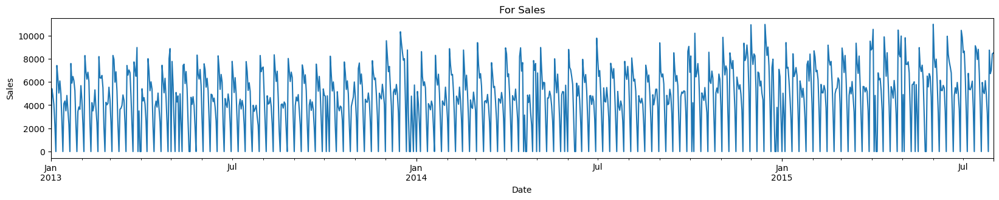

store_8_imputed_data_train columns: 
                                     SARIMAX Results                                      
Dep. Variable:                              Sales   No. Observations:                  900
Model:             SARIMAX(1, 1, 1)x(1, 1, 1, 12)   Log Likelihood               -8121.927
Date:                            Sun, 02 Jul 2023   AIC                          16253.854
Time:                                    21:32:10   BIC                          16277.713
Sample:                                01-01-2013   HQIC                         16262.982
                                     - 06-19-2015                                         
Covariance Type:                              opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.2040      0.032      6.444      0.000       0.142       0.26

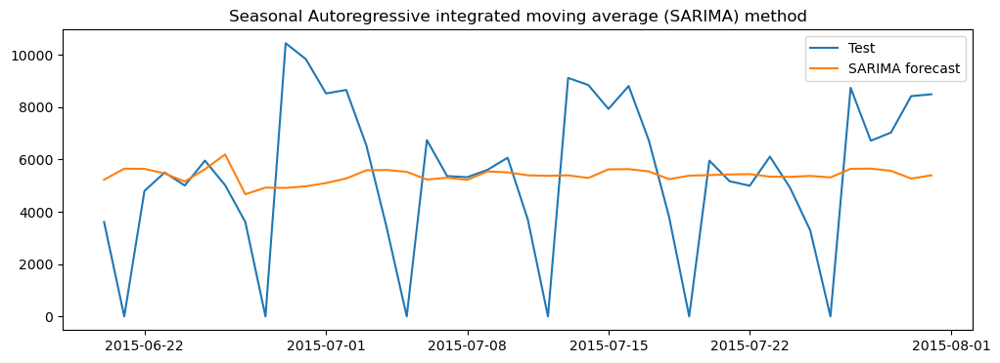

Metrics:     Store    Model  NORM_RMSE_SALES  NORM_MAE_SALES
0      8  SARIMAX         0.276679        0.213082
 VAR Order Selection (* highlights the minimums)  
       AIC         BIC         FPE         HQIC   
--------------------------------------------------
0        21.65       21.75   2.538e+09       21.69
1        21.63       21.75   2.469e+09       21.67
2        21.63       21.77   2.480e+09       21.69
3        21.61       21.78   2.435e+09       21.68
4        21.60       21.78   2.401e+09       21.67
5        21.58       21.79   2.360e+09       21.66
6        21.56       21.79   2.313e+09       21.65
7        21.55       21.80   2.289e+09       21.65
8        21.48       21.75   2.127e+09       21.58
9        21.43       21.72   2.029e+09       21.54
10       21.41       21.73   1.992e+09       21.53
11       21.39       21.73   1.951e+09       21.52
12       21.40       21.75   1.960e+09       21.53
13       21.37       21.75   1.919e+09       21.52
14       21.32      2

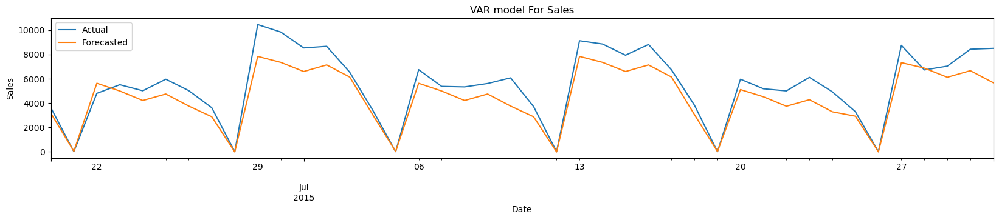

Metrics:     Store Model  NORM_RMSE_SALES  NORM_MAE_SALES  NORM_RMSE_CUSTOMERS  \
0      8   VAR          0.12068        0.097506             0.098158   

   NORM_MAE_CUSTOMERS  
0            0.079727  
                             Statespace Model Results                             
Dep. Variable:     ['Sales', 'Customers']   No. Observations:                  900
Model:                        VARMAX(7,1)   Log Likelihood              -12323.367
                              + intercept   AIC                          24752.733
Date:                    Sun, 02 Jul 2023   BIC                          25007.260
Time:                            21:33:39   HQIC                         24849.964
Sample:                        01-01-2013                                         
                             - 06-19-2015                                         
Covariance Type:                      opg                                         
Ljung-Box (L1) (Q):             0.28, 0.00   Jarqu

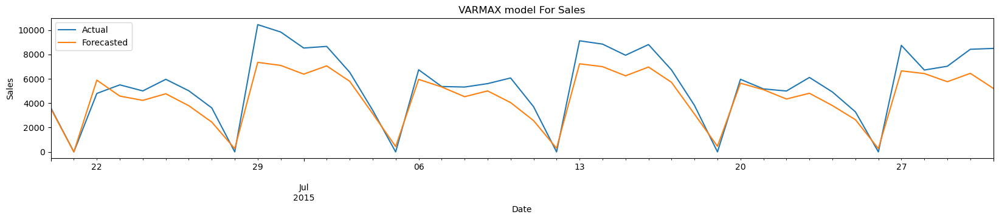

Metrics:     Store   Model  NORM_RMSE_SALES  NORM_MAE_SALES  NORM_RMSE_CUSTOMERS  \
0      8  VARMAX         0.131157         0.10519             0.103877   

   NORM_MAE_CUSTOMERS  
0            0.087672  


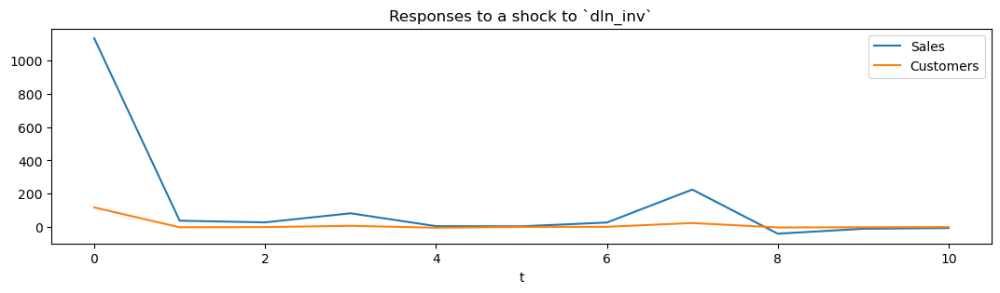

In [65]:
store_id = 8
(store_data_train, store_data_test) = perform_auto_EDA(store_id)

# ARIMA Model
model_metrics_summary = build_ARIMA_model(store_id)
summary_metrics_df = pd.concat([summary_metrics_df, model_metrics_summary])

# SARIMA Model
model_metrics_summary = build_SARIMA_model(store_id)
summary_metrics_df = pd.concat([summary_metrics_df, model_metrics_summary])

# VAR Model
model_metrics_summary = build_VAR_model(store_id, store_data_train, store_data_test)
summary_metrics_df = pd.concat([summary_metrics_df, model_metrics_summary])

# VARMAX Model
model_metrics_summary = build_varmax_model(store_id, store_data_train, store_data_test)
summary_metrics_df = pd.concat([summary_metrics_df, model_metrics_summary])

With a normalized RMSE of 0.13, which means the forcasted data is 87% close to the actual values. VAR performed well

### Store 9

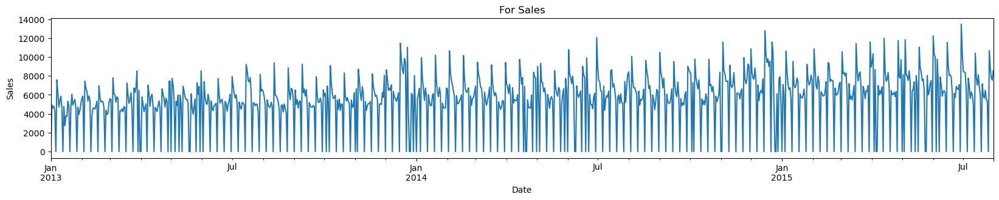

      Store StoreType Assortment  CompetitionDistance  \
0         1         c          a               1270.0   
1         2         a          a                570.0   
2         3         a          a              14130.0   
3         4         c          c                620.0   
4         5         a          a              29910.0   
...     ...       ...        ...                  ...   
1110   1111         a          a               1900.0   
1111   1112         c          c               1880.0   
1112   1113         a          c               9260.0   
1113   1114         a          c                870.0   
1114   1115         d          c               5350.0   

      CompetitionOpenSinceMonth  CompetitionOpenSinceYear  Promo2  \
0                           9.0                    2008.0       0   
1                          11.0                    2007.0       1   
2                          12.0                    2006.0       1   
3                           9.0        

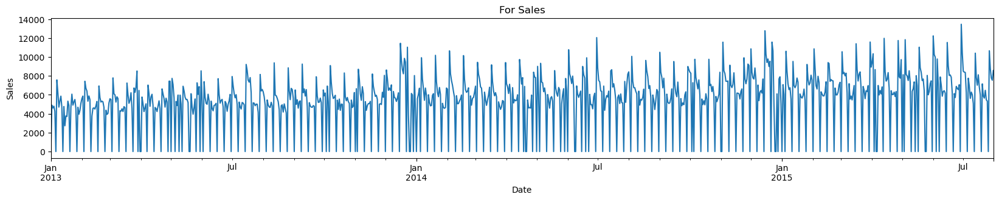

seasonal decomposition


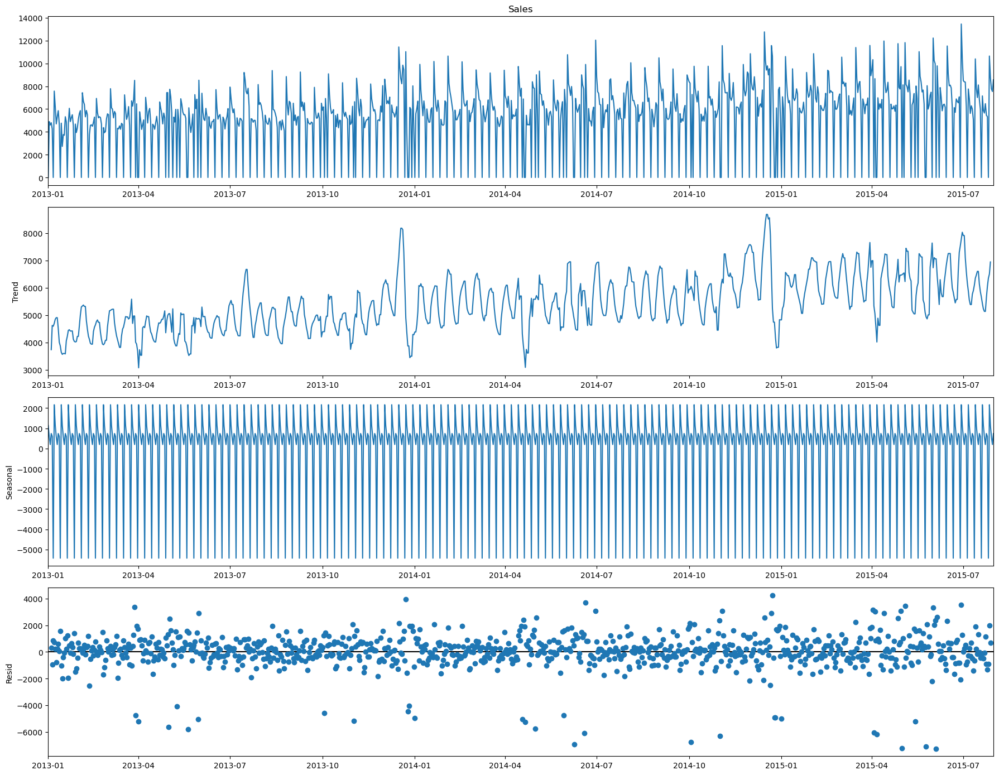

Mean Residual for Sales=0.8145699307668683
stationary test:
For  Sales
****************************************************************************************************
ADF Statistic= -3.1663336605128194
P value= 0.02201801196662036
 => P-Value = 0.022. Rejecting Null Hypothesis.
 => Series is Stationary.
For  Customers
****************************************************************************************************
ADF Statistic= -3.2927505089142954
P value= 0.015205653277919645
 => P-Value = 0.0152. Rejecting Null Hypothesis.
 => Series is Stationary.
ACF and PACF for sales


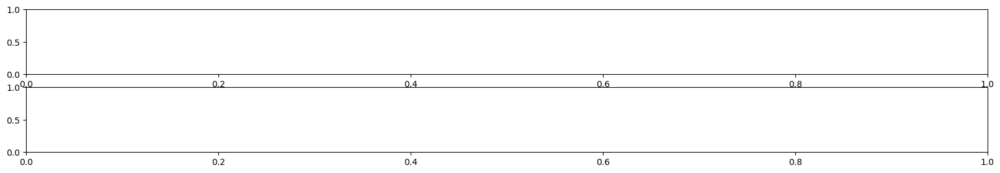

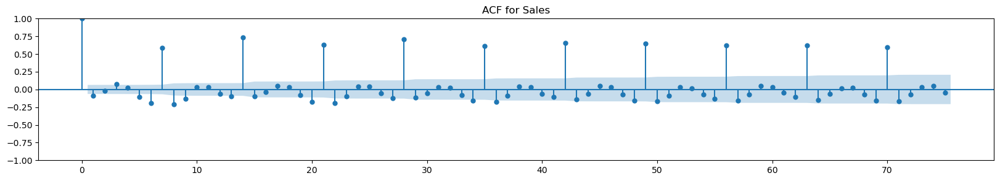

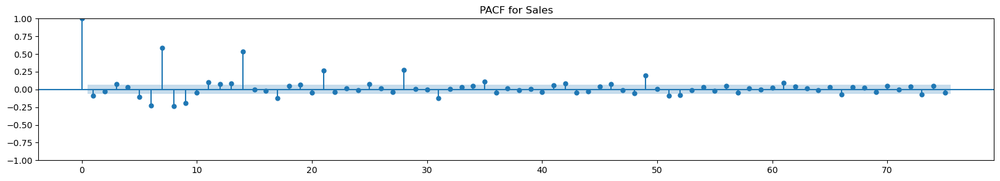

ACF and PACF for Customers


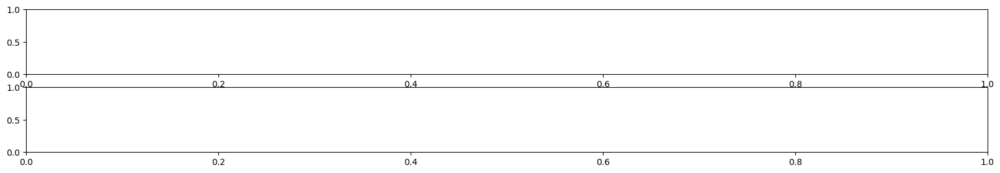

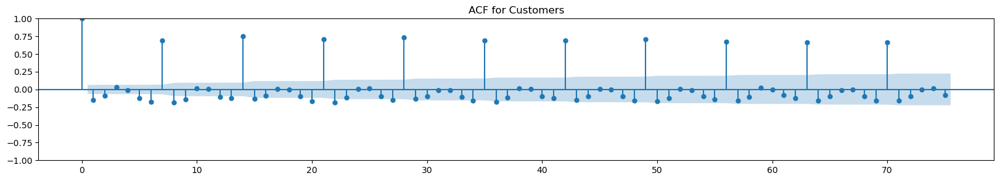

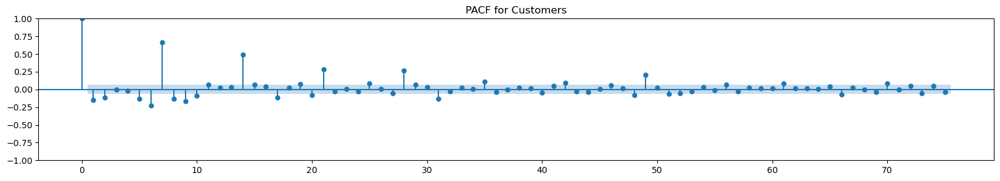

store_9_imputed_data_train columns: 
Index(['Store', 'Sales', 'Customers', 'Open', 'Promo', 'StateHoliday',
       'SchoolHoliday', 'CompetitionDistance', 'Promo2', 'DayOfWeek_2',
       'DayOfWeek_3', 'DayOfWeek_4', 'DayOfWeek_5', 'DayOfWeek_6',
       'DayOfWeek_7', 'CompetitionOpenSince'],
      dtype='object')
Name   ::  Test Stat > C(95%)    =>   Signif  
 ----------------------------------------
Sales  ::  53.96     > 12.3212   =>   True
Customers ::  0.22      > 4.1296    =>   False

Rank: 1

both the series are co integrated, VARMAX can be used directly


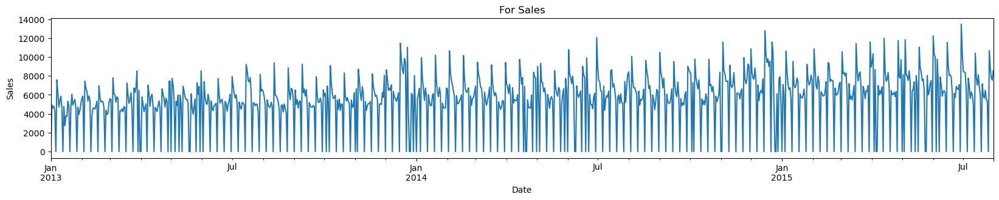

store_9_imputed_data_train columns: 
                               SARIMAX Results                                
Dep. Variable:                  Sales   No. Observations:                  900
Model:                 ARIMA(7, 0, 7)   Log Likelihood               -8008.813
Date:                Sun, 02 Jul 2023   AIC                          16049.627
Time:                        21:34:10   BIC                          16126.465
Sample:                    01-01-2013   HQIC                         16078.979
                         - 06-19-2015                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const       5387.0978    311.457     17.296      0.000    4776.653    5997.543
ar.L1         -0.0321      0.020     -1.605      0.109      -0.071       0.007
ar.L2         -

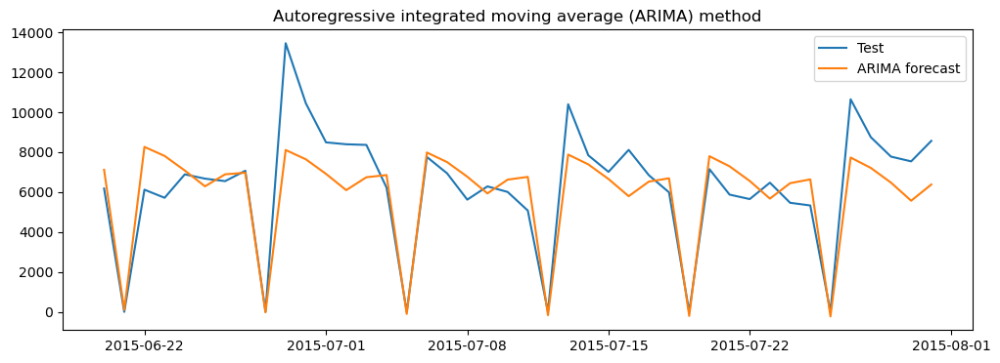

Metrics:     Store  Model  NORM_RMSE_SALES  NORM_MAE_SALES
0      9  ARIMA         0.116415        0.085857


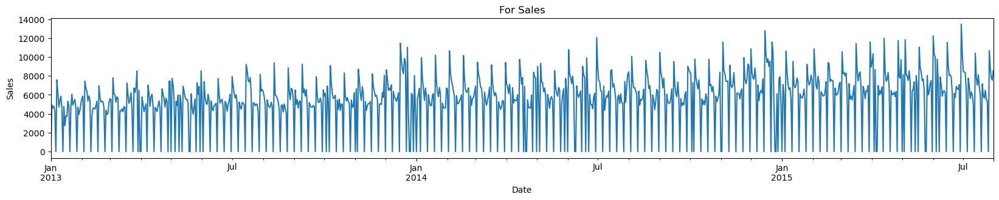

store_9_imputed_data_train columns: 
                                     SARIMAX Results                                      
Dep. Variable:                              Sales   No. Observations:                  900
Model:             SARIMAX(1, 1, 1)x(1, 1, 1, 12)   Log Likelihood               -8397.787
Date:                            Sun, 02 Jul 2023   AIC                          16805.574
Time:                                    21:34:20   BIC                          16829.434
Sample:                                01-01-2013   HQIC                         16814.702
                                     - 06-19-2015                                         
Covariance Type:                              opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.1603      0.100     -1.609      0.108      -0.356       0.03

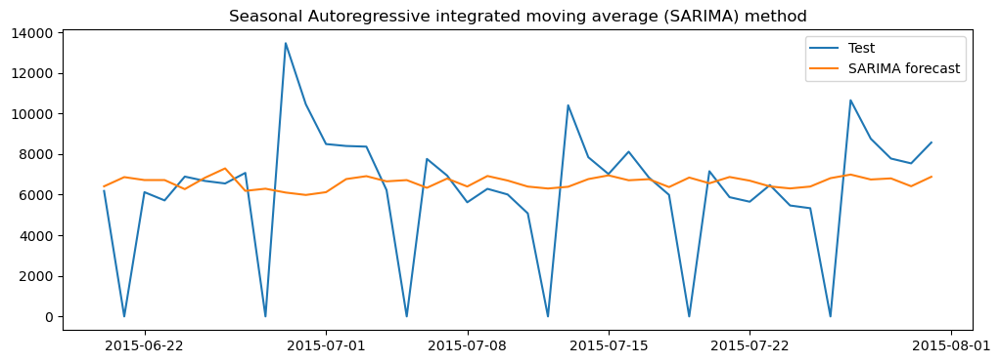

Metrics:     Store    Model  NORM_RMSE_SALES  NORM_MAE_SALES
0      9  SARIMAX         0.230407        0.155396
 VAR Order Selection (* highlights the minimums)  
       AIC         BIC         FPE         HQIC   
--------------------------------------------------
0        21.53       21.63   2.248e+09       21.57
1        21.47      21.59*   2.111e+09       21.52
2        21.47       21.61   2.114e+09       21.53
3        21.46       21.62   2.083e+09       21.52
4        21.46       21.65   2.093e+09       21.53
5        21.47       21.67   2.102e+09       21.54
6        21.46       21.68   2.084e+09       21.54
7        21.45       21.70   2.076e+09       21.55
8        21.42       21.69   2.012e+09       21.53
9        21.39       21.69   1.956e+09       21.51
10       21.34       21.65   1.846e+09       21.46
11       21.32       21.66   1.823e+09       21.45
12       21.32       21.67   1.812e+09       21.45
13       21.31       21.69   1.801e+09       21.46
14      21.26*       

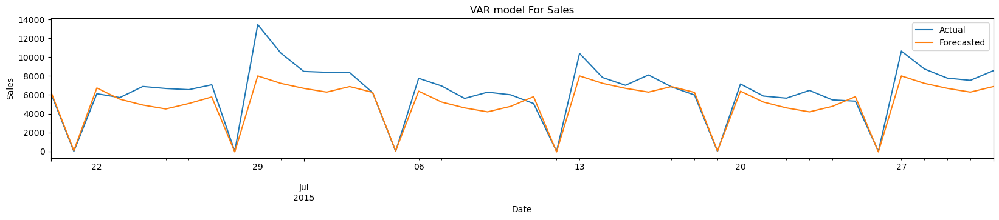

Metrics:     Store Model  NORM_RMSE_SALES  NORM_MAE_SALES  NORM_RMSE_CUSTOMERS  \
0      9   VAR         0.118899        0.088468             0.104694   

   NORM_MAE_CUSTOMERS  
0            0.083016  
                             Statespace Model Results                             
Dep. Variable:     ['Sales', 'Customers']   No. Observations:                  900
Model:                        VARMAX(7,1)   Log Likelihood              -12231.936
                              + intercept   AIC                          24569.872
Date:                    Sun, 02 Jul 2023   BIC                          24824.399
Time:                            21:36:02   HQIC                         24667.103
Sample:                        01-01-2013                                         
                             - 06-19-2015                                         
Covariance Type:                      opg                                         
Ljung-Box (L1) (Q):             0.04, 0.28   Jarqu

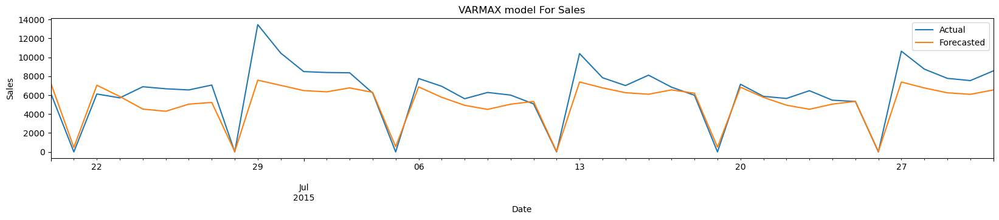

Metrics:     Store   Model  NORM_RMSE_SALES  NORM_MAE_SALES  NORM_RMSE_CUSTOMERS  \
0      9  VARMAX         0.128752        0.095106             0.114921   

   NORM_MAE_CUSTOMERS  
0            0.092098  


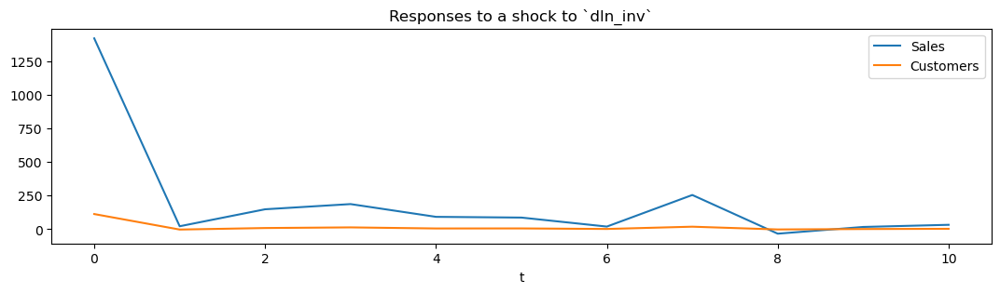

In [66]:
store_id = 9
(store_data_train, store_data_test) = perform_auto_EDA(store_id)

# ARIMA Model
model_metrics_summary = build_ARIMA_model(store_id)
summary_metrics_df = pd.concat([summary_metrics_df, model_metrics_summary])

# SARIMA Model
model_metrics_summary = build_SARIMA_model(store_id)
summary_metrics_df = pd.concat([summary_metrics_df, model_metrics_summary])

# VAR Model
model_metrics_summary = build_VAR_model(store_id, store_data_train, store_data_test)
summary_metrics_df = pd.concat([summary_metrics_df, model_metrics_summary])

# VARMAX Model
model_metrics_summary = build_varmax_model(store_id, store_data_train, store_data_test)
summary_metrics_df = pd.concat([summary_metrics_df, model_metrics_summary])

With a normalized RMSE of 0.11, which means the forcasted data is 89% close to the actual values. VAR performed well

### Store 13

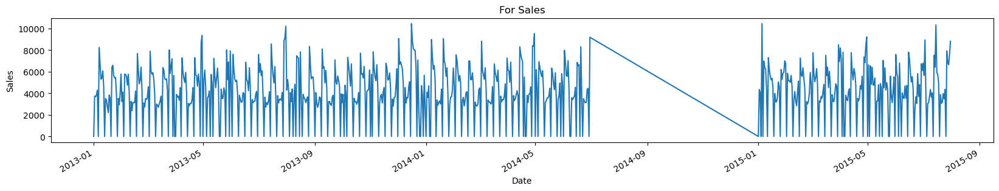

      Store StoreType Assortment  CompetitionDistance  \
0         1         c          a               1270.0   
1         2         a          a                570.0   
2         3         a          a              14130.0   
3         4         c          c                620.0   
4         5         a          a              29910.0   
...     ...       ...        ...                  ...   
1110   1111         a          a               1900.0   
1111   1112         c          c               1880.0   
1112   1113         a          c               9260.0   
1113   1114         a          c                870.0   
1114   1115         d          c               5350.0   

      CompetitionOpenSinceMonth  CompetitionOpenSinceYear  Promo2  \
0                           9.0                    2008.0       0   
1                          11.0                    2007.0       1   
2                          12.0                    2006.0       1   
3                           9.0        

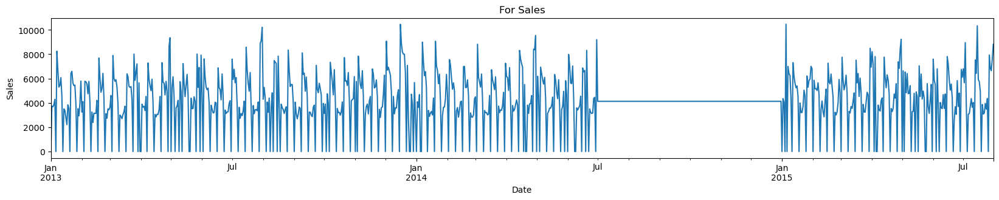

seasonal decomposition


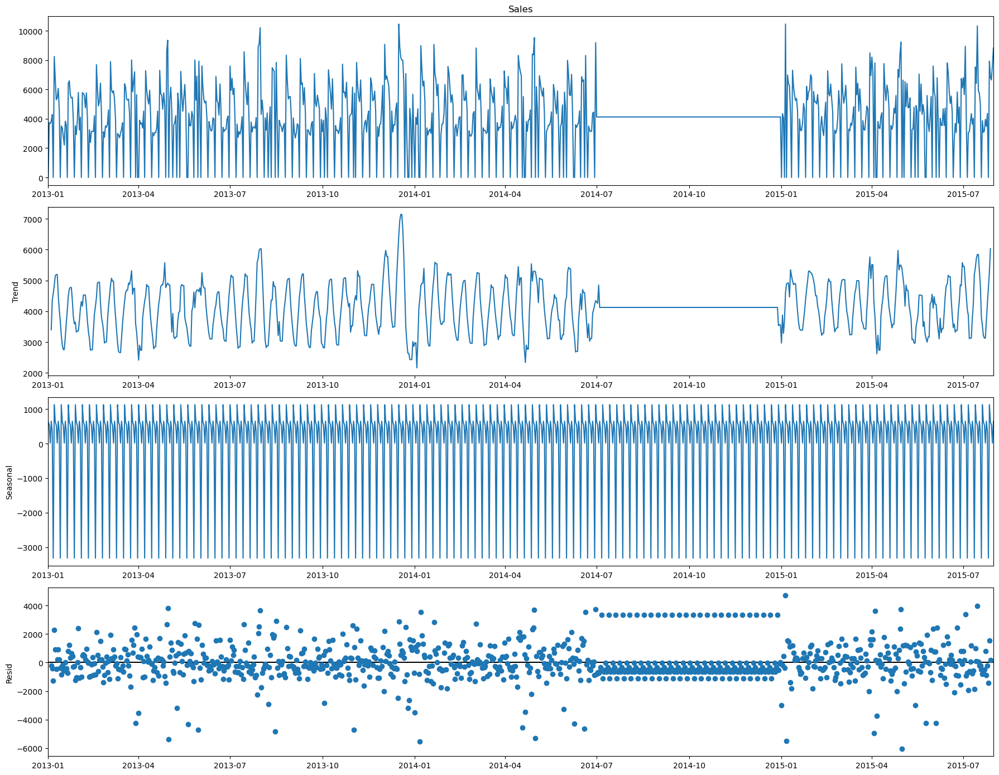

Mean Residual for Sales=-0.3394150324851922
stationary test:
For  Sales
****************************************************************************************************
ADF Statistic= -6.703181491108563
P value= 3.843134892024559e-09
 => P-Value = 0.0. Rejecting Null Hypothesis.
 => Series is Stationary.
For  Customers
****************************************************************************************************
ADF Statistic= -6.312317476847047
P value= 3.2121531916694446e-08
 => P-Value = 0.0. Rejecting Null Hypothesis.
 => Series is Stationary.
ACF and PACF for sales


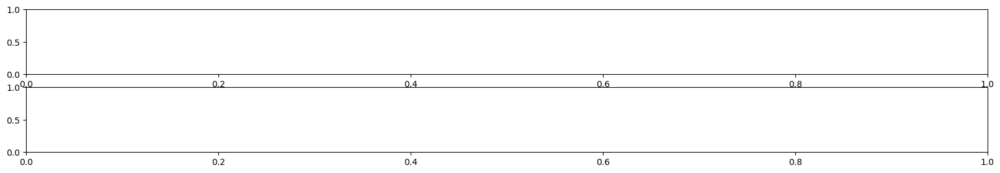

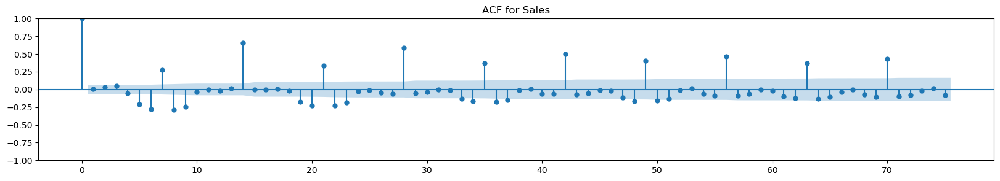

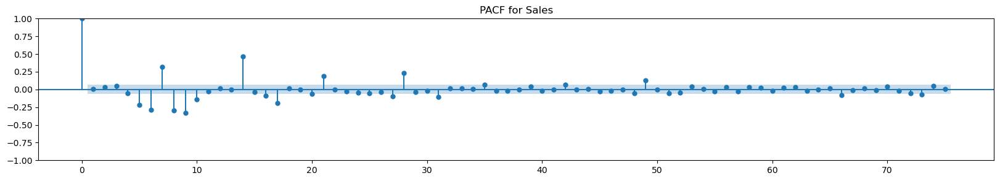

ACF and PACF for Customers


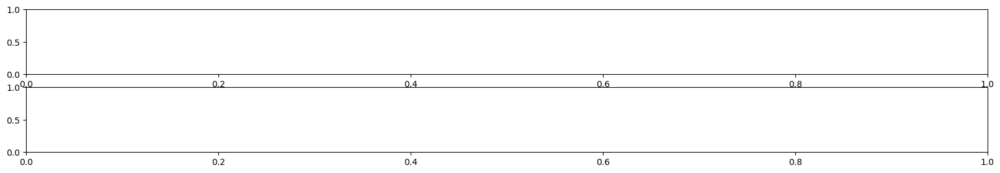

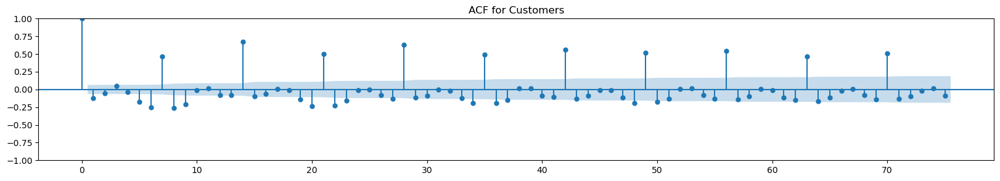

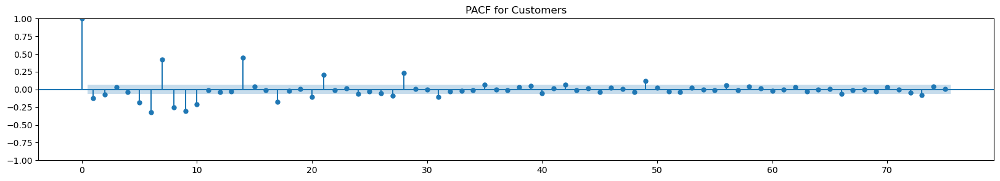

store_13_imputed_data_train columns: 
Index(['Store', 'Sales', 'Customers', 'Open', 'Promo', 'StateHoliday',
       'SchoolHoliday', 'CompetitionDistance', 'Promo2', 'DayOfWeek_2',
       'DayOfWeek_3', 'DayOfWeek_4', 'DayOfWeek_5', 'DayOfWeek_6',
       'DayOfWeek_7', 'CompetitionOpenSince'],
      dtype='object')
Name   ::  Test Stat > C(95%)    =>   Signif  
 ----------------------------------------
Sales  ::  65.83     > 12.3212   =>   True
Customers ::  0.67      > 4.1296    =>   False

Rank: 1

both the series are co integrated, VARMAX can be used directly


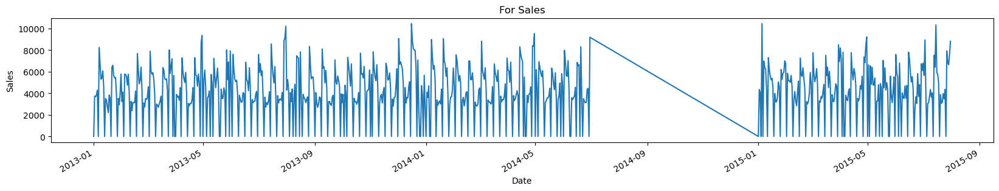

store_13_imputed_data_train columns: 
                               SARIMAX Results                                
Dep. Variable:                  Sales   No. Observations:                  900
Model:                 ARIMA(7, 0, 7)   Log Likelihood               -7921.995
Date:                Sun, 02 Jul 2023   AIC                          15875.991
Time:                        21:36:32   BIC                          15952.829
Sample:                    01-01-2013   HQIC                         15905.344
                         - 06-19-2015                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const       4107.4791     42.863     95.829      0.000    4023.470    4191.488
ar.L1          0.3898      0.739      0.527      0.598      -1.059       1.839
ar.L2         

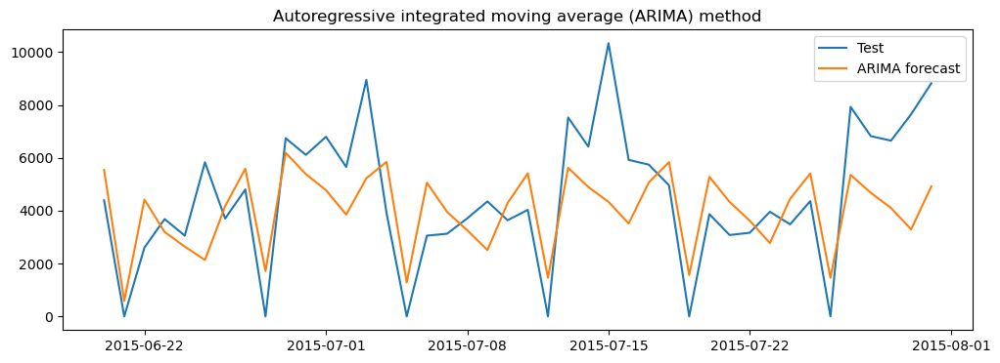

Metrics:     Store  Model  NORM_RMSE_SALES  NORM_MAE_SALES
0     13  ARIMA         0.197866        0.161339


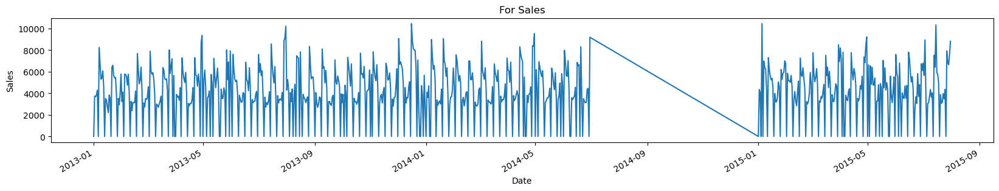

store_13_imputed_data_train columns: 
                                     SARIMAX Results                                      
Dep. Variable:                              Sales   No. Observations:                  900
Model:             SARIMAX(1, 1, 1)x(1, 1, 1, 12)   Log Likelihood               -8131.306
Date:                            Sun, 02 Jul 2023   AIC                          16272.611
Time:                                    21:36:38   BIC                          16296.471
Sample:                                01-01-2013   HQIC                         16281.739
                                     - 06-19-2015                                         
Covariance Type:                              opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.0075      0.080      0.094      0.925      -0.149       0.1

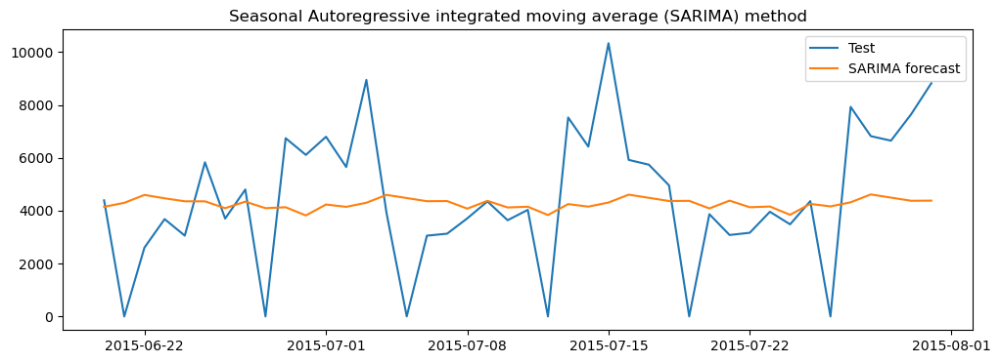

Metrics:     Store    Model  NORM_RMSE_SALES  NORM_MAE_SALES
0     13  SARIMAX         0.246956         0.19189
 VAR Order Selection (* highlights the minimums)  
       AIC         BIC         FPE         HQIC   
--------------------------------------------------
0        20.34       20.44   6.816e+08       20.38
1        20.28       20.40   6.424e+08       20.33
2        20.27       20.41   6.333e+08       20.32
3        20.21      20.38*   6.011e+08       20.28
4        20.20       20.38   5.902e+08       20.27
5        20.19       20.40   5.885e+08       20.27
6        20.18       20.41   5.831e+08       20.27
7        20.15       20.40   5.661e+08       20.25
8        20.15       20.42   5.628e+08       20.25
9        20.14       20.44   5.609e+08       20.26
10       20.12       20.44   5.478e+08       20.24
11       20.11       20.45   5.423e+08      20.24*
12       20.11       20.47   5.439e+08       20.25
13       20.12       20.50   5.457e+08       20.26
14       20.10       

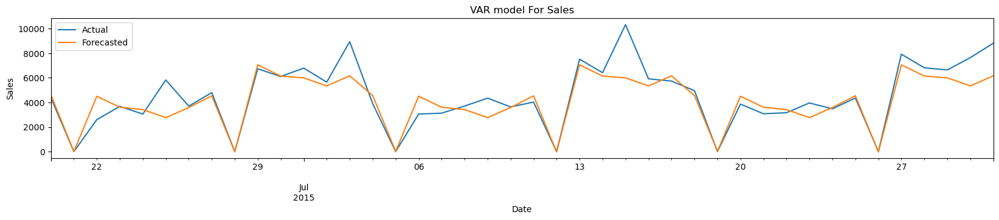

Metrics:     Store Model  NORM_RMSE_SALES  NORM_MAE_SALES  NORM_RMSE_CUSTOMERS  \
0     13   VAR         0.118866        0.073509             0.081479   

   NORM_MAE_CUSTOMERS  
0            0.059965  
                             Statespace Model Results                             
Dep. Variable:     ['Sales', 'Customers']   No. Observations:                  900
Model:                        VARMAX(7,1)   Log Likelihood              -11680.216
                              + intercept   AIC                          23466.433
Date:                    Sun, 02 Jul 2023   BIC                          23720.960
Time:                            21:37:29   HQIC                         23563.664
Sample:                        01-01-2013                                         
                             - 06-19-2015                                         
Covariance Type:                      opg                                         
Ljung-Box (L1) (Q):             0.05, 0.08   Jarqu

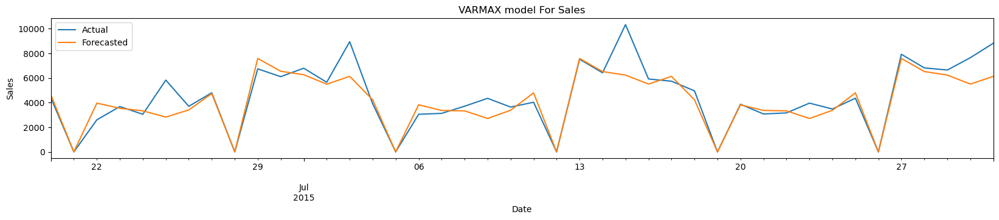

Metrics:     Store   Model  NORM_RMSE_SALES  NORM_MAE_SALES  NORM_RMSE_CUSTOMERS  \
0     13  VARMAX         0.111899        0.065602             0.081514   

   NORM_MAE_CUSTOMERS  
0            0.059349  


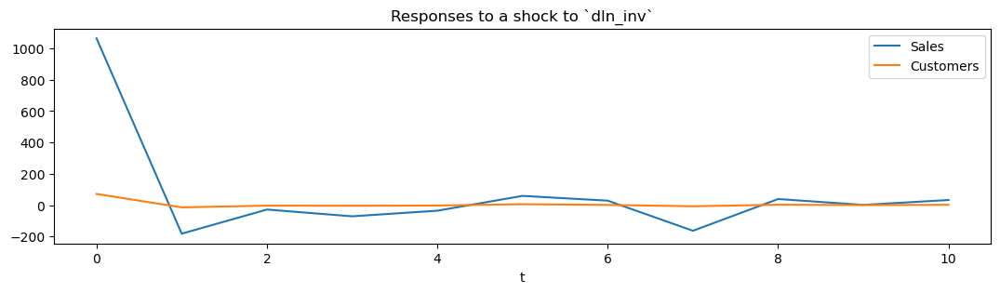

In [67]:
store_id = 13
(store_data_train, store_data_test) = perform_auto_EDA(store_id)

# ARIMA Model
model_metrics_summary = build_ARIMA_model(store_id)
summary_metrics_df = pd.concat([summary_metrics_df, model_metrics_summary])

# SARIMA Model
model_metrics_summary = build_SARIMA_model(store_id)
summary_metrics_df = pd.concat([summary_metrics_df, model_metrics_summary])

# VAR Model
model_metrics_summary = build_VAR_model(store_id, store_data_train, store_data_test)
summary_metrics_df = pd.concat([summary_metrics_df, model_metrics_summary])

# VARMAX Model
model_metrics_summary = build_varmax_model(store_id, store_data_train, store_data_test)
summary_metrics_df = pd.concat([summary_metrics_df, model_metrics_summary])

With a normalized RMSE of 0.11, which means the forcasted data is 89% close to the actual values. VAR, VARMAX performed well

### Store 25

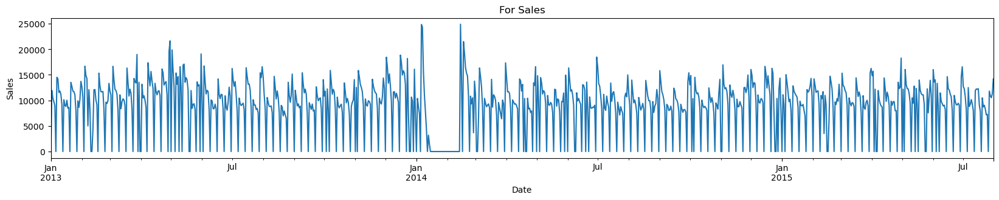

      Store StoreType Assortment  CompetitionDistance  \
0         1         c          a               1270.0   
1         2         a          a                570.0   
2         3         a          a              14130.0   
3         4         c          c                620.0   
4         5         a          a              29910.0   
...     ...       ...        ...                  ...   
1110   1111         a          a               1900.0   
1111   1112         c          c               1880.0   
1112   1113         a          c               9260.0   
1113   1114         a          c                870.0   
1114   1115         d          c               5350.0   

      CompetitionOpenSinceMonth  CompetitionOpenSinceYear  Promo2  \
0                           9.0                    2008.0       0   
1                          11.0                    2007.0       1   
2                          12.0                    2006.0       1   
3                           9.0        

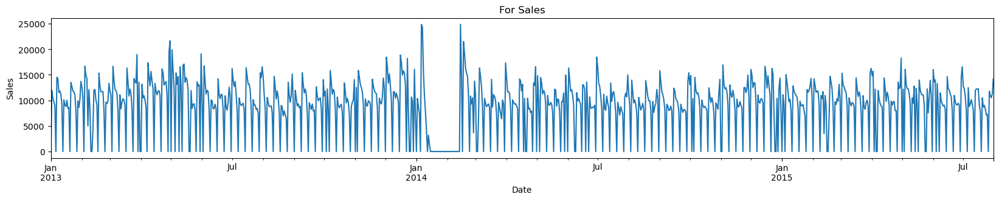

seasonal decomposition


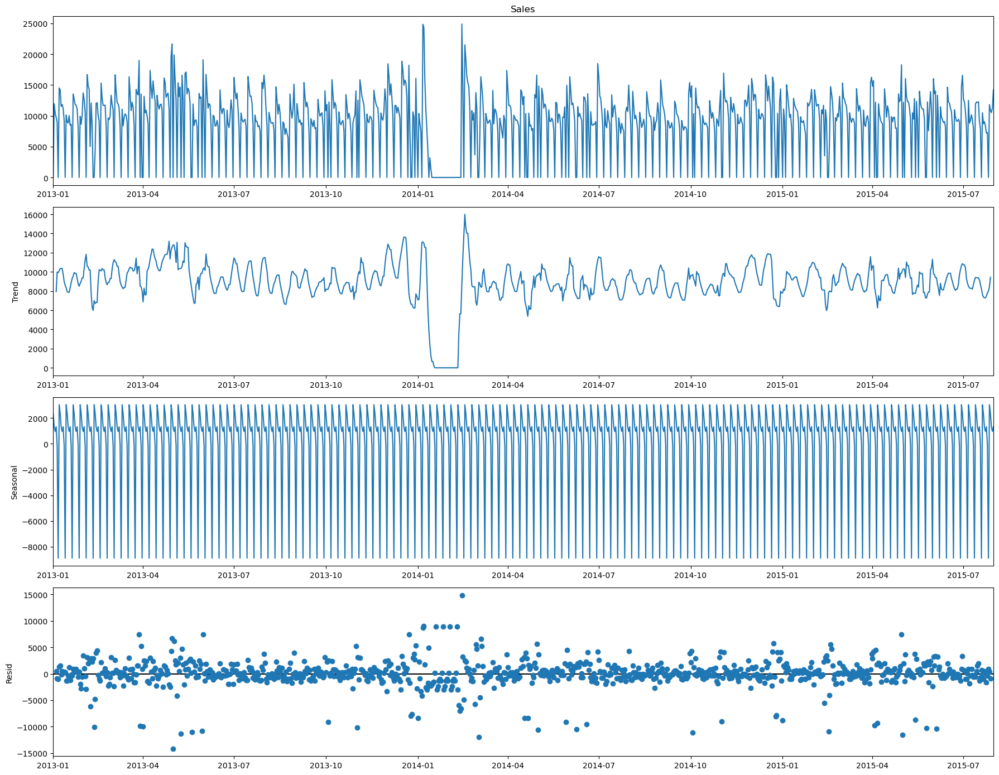

Mean Residual for Sales=-0.6251170875707496
stationary test:
For  Sales
****************************************************************************************************
ADF Statistic= -4.767952436007935
P value= 6.260620857384643e-05
 => P-Value = 0.0001. Rejecting Null Hypothesis.
 => Series is Stationary.
For  Customers
****************************************************************************************************
ADF Statistic= -4.040782159514527
P value= 0.001211392075251341
 => P-Value = 0.0012. Rejecting Null Hypothesis.
 => Series is Stationary.
ACF and PACF for sales


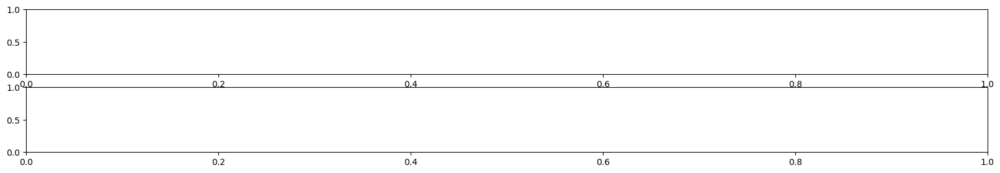

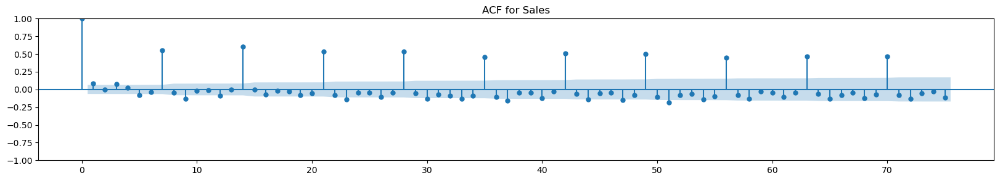

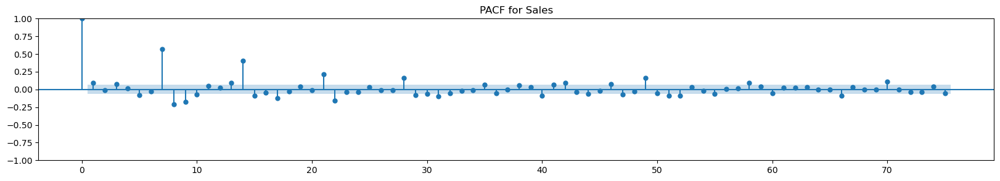

ACF and PACF for Customers


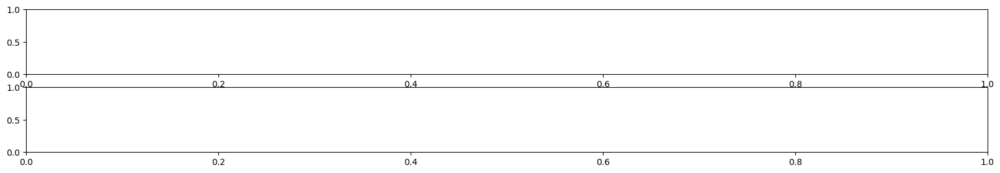

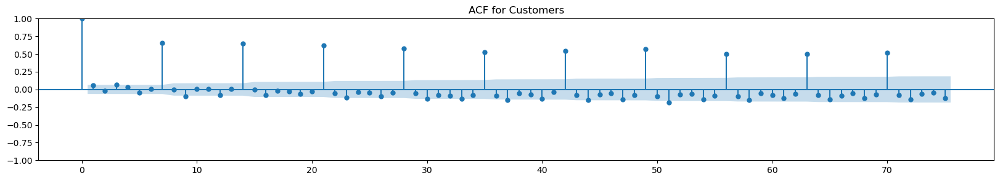

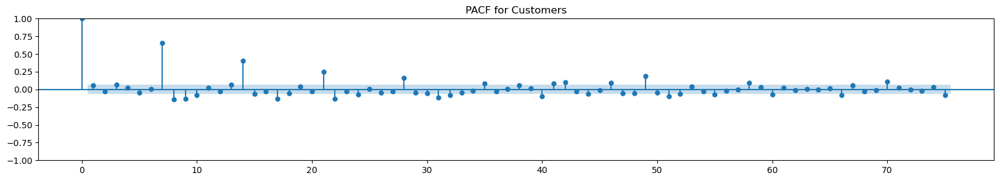

store_25_imputed_data_train columns: 
Index(['Store', 'Sales', 'Customers', 'Open', 'Promo', 'StateHoliday',
       'SchoolHoliday', 'CompetitionDistance', 'Promo2', 'DayOfWeek_2',
       'DayOfWeek_3', 'DayOfWeek_4', 'DayOfWeek_5', 'DayOfWeek_6',
       'DayOfWeek_7', 'CompetitionOpenSince'],
      dtype='object')
Name   ::  Test Stat > C(95%)    =>   Signif  
 ----------------------------------------
Sales  ::  78.6      > 12.3212   =>   True
Customers ::  1.19      > 4.1296    =>   False

Rank: 1

both the series are co integrated, VARMAX can be used directly


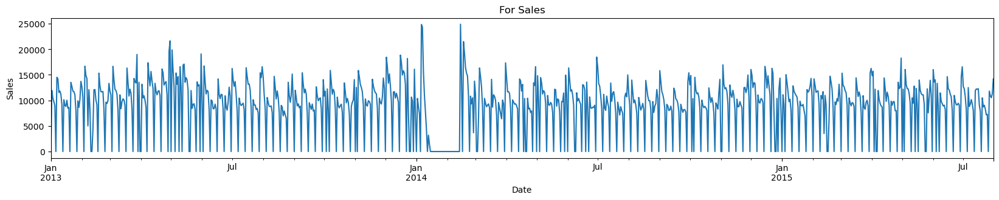

store_25_imputed_data_train columns: 
                               SARIMAX Results                                
Dep. Variable:                  Sales   No. Observations:                  900
Model:                 ARIMA(7, 0, 7)   Log Likelihood               -8622.551
Date:                Sun, 02 Jul 2023   AIC                          17277.102
Time:                        21:37:46   BIC                          17353.940
Sample:                    01-01-2013   HQIC                         17306.455
                         - 06-19-2015                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const       8891.7378    928.129      9.580      0.000    7072.638    1.07e+04
ar.L1         -0.0669      0.023     -2.867      0.004      -0.113      -0.021
ar.L2         

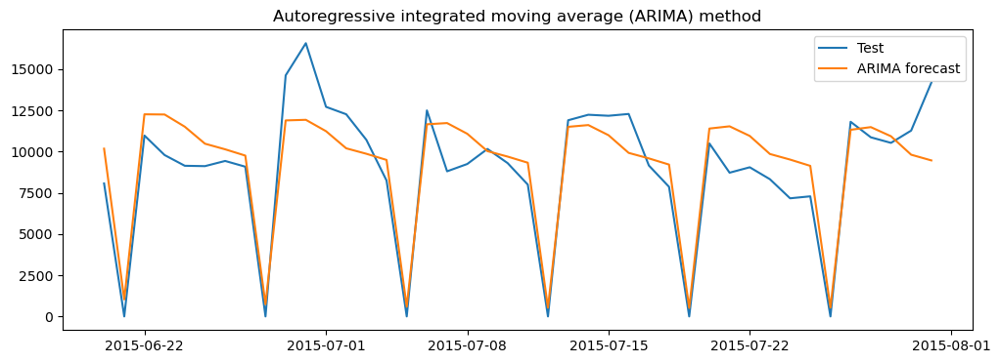

Metrics:     Store  Model  NORM_RMSE_SALES  NORM_MAE_SALES
0     25  ARIMA         0.107793        0.087301


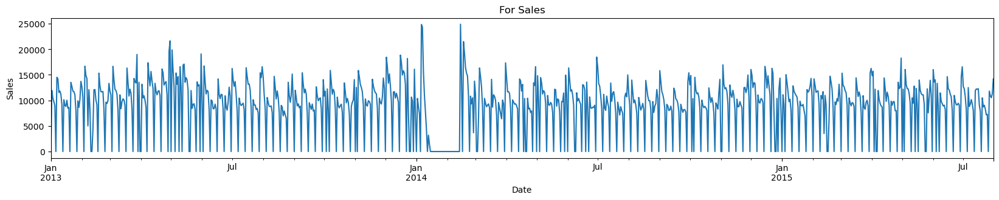

store_25_imputed_data_train columns: 
                                     SARIMAX Results                                      
Dep. Variable:                              Sales   No. Observations:                  900
Model:             SARIMAX(1, 1, 1)x(1, 1, 1, 12)   Log Likelihood               -8911.335
Date:                            Sun, 02 Jul 2023   AIC                          17832.671
Time:                                    21:37:51   BIC                          17856.530
Sample:                                01-01-2013   HQIC                         17841.798
                                     - 06-19-2015                                         
Covariance Type:                              opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.0038      0.103      0.037      0.971      -0.198       0.2

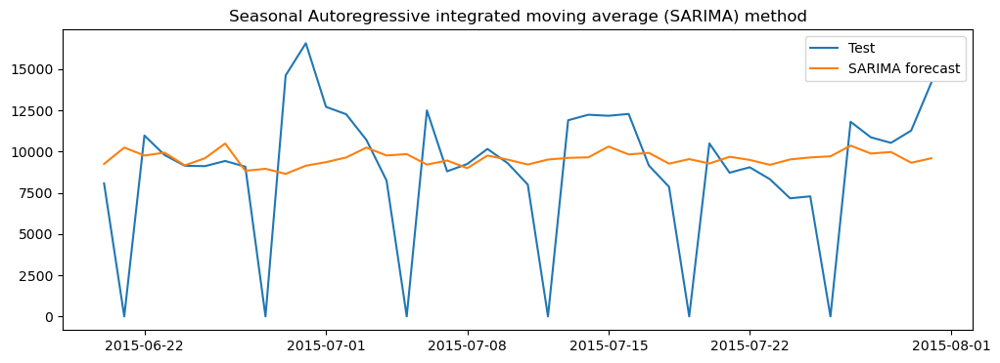

Metrics:     Store    Model  NORM_RMSE_SALES  NORM_MAE_SALES
0     25  SARIMAX         0.255579        0.170474
 VAR Order Selection (* highlights the minimums)  
       AIC         BIC         FPE         HQIC   
--------------------------------------------------
0        25.52       25.61   1.206e+11       25.55
1        25.18       25.29   8.578e+10       25.22
2        25.14       25.28   8.304e+10       25.20
3        25.10      25.26*   7.957e+10       25.16
4        25.09       25.27   7.865e+10       25.16
5        25.07       25.27   7.706e+10       25.15
6        25.06       25.29   7.658e+10       25.15
7        25.05       25.30   7.557e+10      25.14*
8        25.04       25.31   7.518e+10       25.15
9        25.04       25.33   7.478e+10       25.15
10       25.04       25.35   7.498e+10       25.16
11       25.04       25.37   7.485e+10       25.17
12       25.05       25.40   7.536e+10       25.18
13       25.05       25.43   7.552e+10       25.19
14      25.04*       

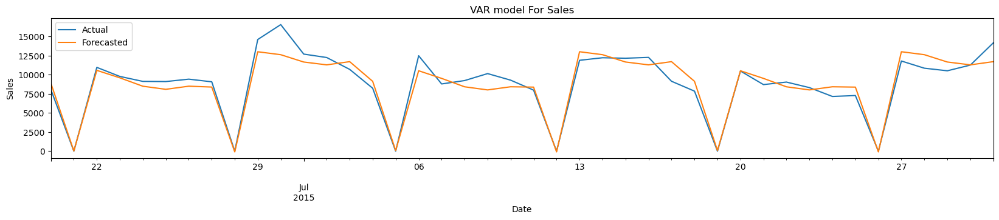

Metrics:     Store Model  NORM_RMSE_SALES  NORM_MAE_SALES  NORM_RMSE_CUSTOMERS  \
0     25   VAR         0.073858        0.056192             0.070218   

   NORM_MAE_CUSTOMERS  
0            0.053633  
                             Statespace Model Results                             
Dep. Variable:     ['Sales', 'Customers']   No. Observations:                  900
Model:                        VARMAX(7,1)   Log Likelihood              -13942.140
                              + intercept   AIC                          27990.280
Date:                    Sun, 02 Jul 2023   BIC                          28244.807
Time:                            21:38:34   HQIC                         28087.511
Sample:                        01-01-2013                                         
                             - 06-19-2015                                         
Covariance Type:                      opg                                         
Ljung-Box (L1) (Q):             0.05, 0.15   Jarqu

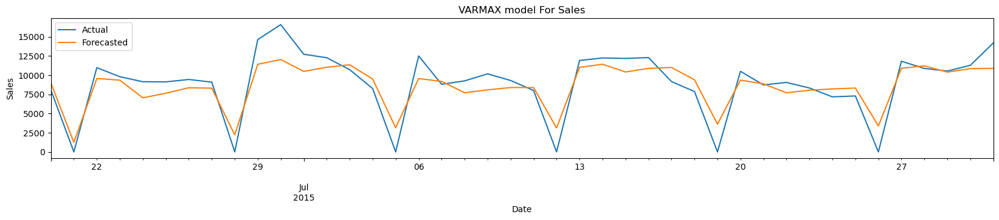

Metrics:     Store   Model  NORM_RMSE_SALES  NORM_MAE_SALES  NORM_RMSE_CUSTOMERS  \
0     25  VARMAX         0.113142        0.092927             0.114777   

   NORM_MAE_CUSTOMERS  
0            0.088543  


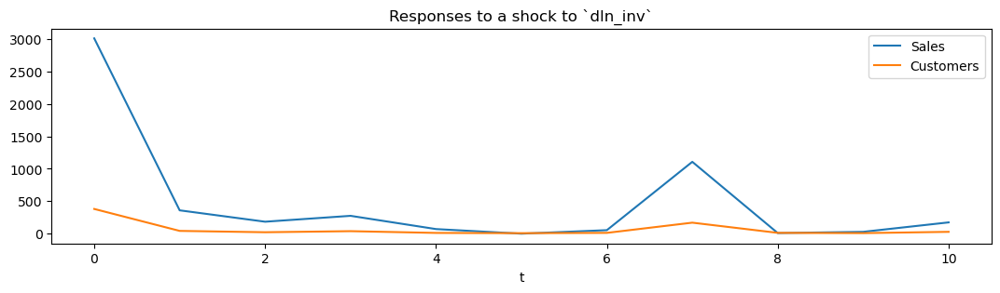

In [68]:
store_id = 25
(store_data_train, store_data_test) = perform_auto_EDA(store_id)

# ARIMA Model
model_metrics_summary = build_ARIMA_model(store_id)
summary_metrics_df = pd.concat([summary_metrics_df, model_metrics_summary])

# SARIMA Model
model_metrics_summary = build_SARIMA_model(store_id)
summary_metrics_df = pd.concat([summary_metrics_df, model_metrics_summary])

# VAR Model
model_metrics_summary = build_VAR_model(store_id, store_data_train, store_data_test)
summary_metrics_df = pd.concat([summary_metrics_df, model_metrics_summary])

# VARMAX Model
model_metrics_summary = build_varmax_model(store_id, store_data_train, store_data_test)
summary_metrics_df = pd.concat([summary_metrics_df, model_metrics_summary])

With a normalized RMSE of 0.07, which means the forcasted data is 93% close to the actual values. VAR performed well

### Store 29

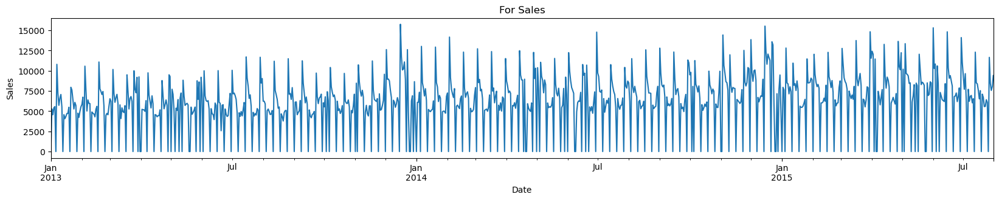

      Store StoreType Assortment  CompetitionDistance  \
0         1         c          a               1270.0   
1         2         a          a                570.0   
2         3         a          a              14130.0   
3         4         c          c                620.0   
4         5         a          a              29910.0   
...     ...       ...        ...                  ...   
1110   1111         a          a               1900.0   
1111   1112         c          c               1880.0   
1112   1113         a          c               9260.0   
1113   1114         a          c                870.0   
1114   1115         d          c               5350.0   

      CompetitionOpenSinceMonth  CompetitionOpenSinceYear  Promo2  \
0                           9.0                    2008.0       0   
1                          11.0                    2007.0       1   
2                          12.0                    2006.0       1   
3                           9.0        

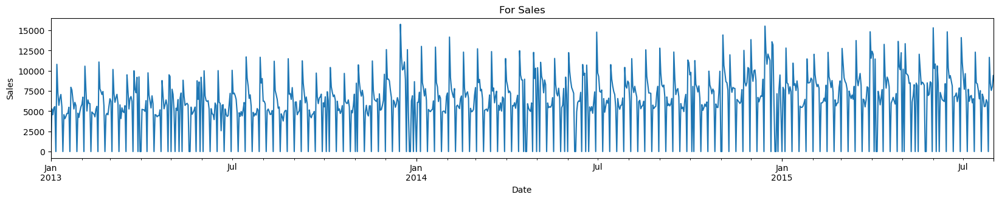

seasonal decomposition


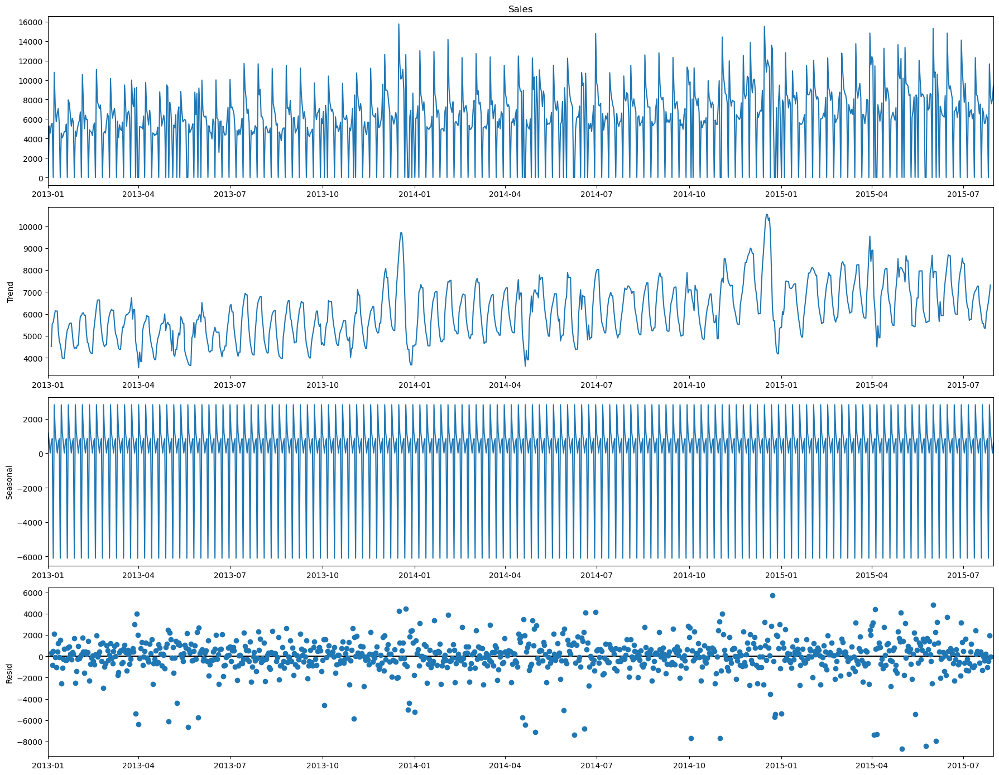

Mean Residual for Sales=1.2439841608289732
stationary test:
For  Sales
****************************************************************************************************
ADF Statistic= -3.424492207073429
P value= 0.010151736806426562
 => P-Value = 0.0102. Rejecting Null Hypothesis.
 => Series is Stationary.
For  Customers
****************************************************************************************************
ADF Statistic= -3.266279915721124
P value= 0.016454712815192573
 => P-Value = 0.0165. Rejecting Null Hypothesis.
 => Series is Stationary.
ACF and PACF for sales


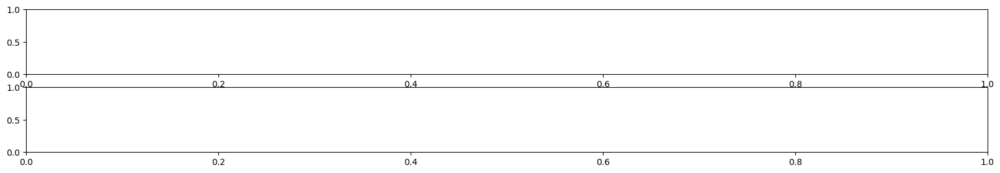

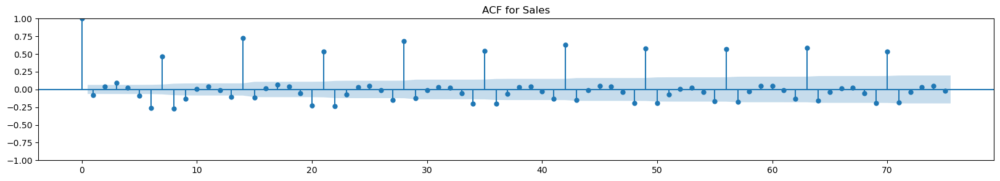

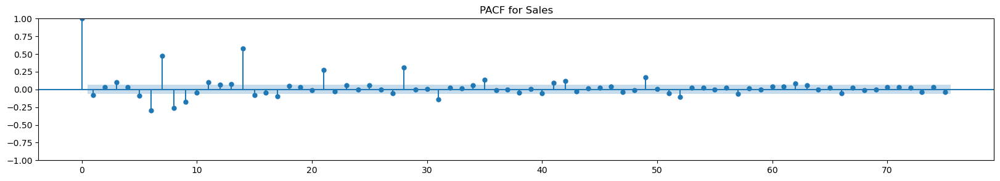

ACF and PACF for Customers


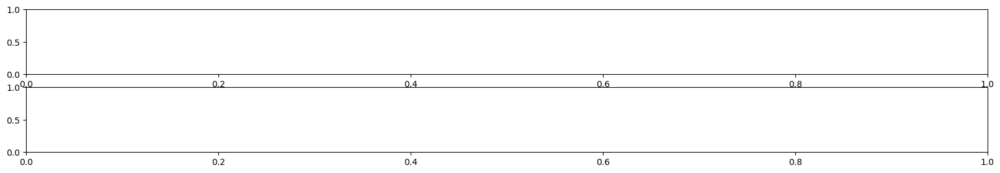

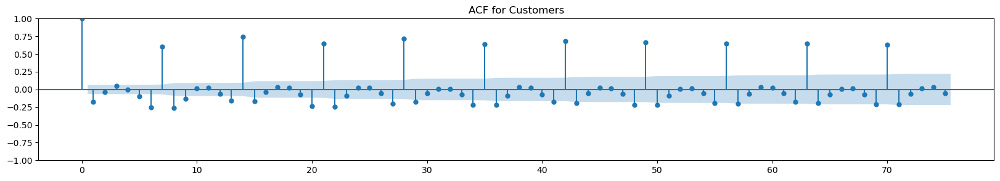

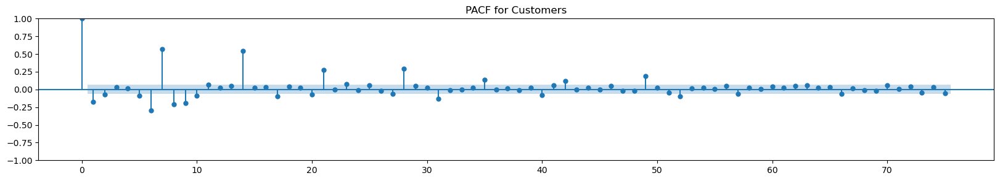

store_29_imputed_data_train columns: 
Index(['Store', 'Sales', 'Customers', 'Open', 'Promo', 'StateHoliday',
       'SchoolHoliday', 'CompetitionDistance', 'Promo2', 'DayOfWeek_2',
       'DayOfWeek_3', 'DayOfWeek_4', 'DayOfWeek_5', 'DayOfWeek_6',
       'DayOfWeek_7', 'CompetitionOpenSince'],
      dtype='object')
Name   ::  Test Stat > C(95%)    =>   Signif  
 ----------------------------------------
Sales  ::  52.9      > 12.3212   =>   True
Customers ::  0.28      > 4.1296    =>   False

Rank: 1

both the series are co integrated, VARMAX can be used directly


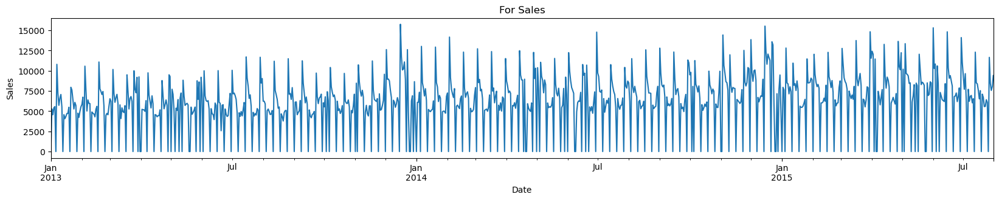

store_29_imputed_data_train columns: 
                               SARIMAX Results                                
Dep. Variable:                  Sales   No. Observations:                  900
Model:                 ARIMA(7, 0, 7)   Log Likelihood               -8238.756
Date:                Sun, 02 Jul 2023   AIC                          16509.512
Time:                        21:38:52   BIC                          16586.350
Sample:                    01-01-2013   HQIC                         16538.865
                         - 06-19-2015                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const       6061.5056    267.281     22.678      0.000    5537.645    6585.367
ar.L1         -0.0643      0.042     -1.528      0.127      -0.147       0.018
ar.L2         

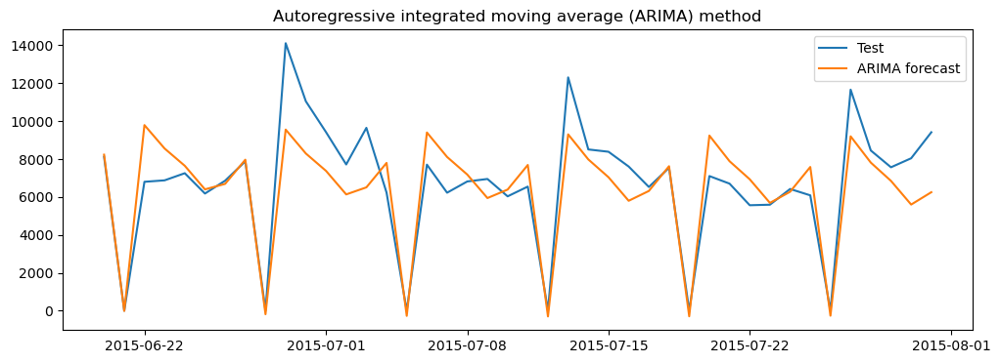

Metrics:     Store  Model  NORM_RMSE_SALES  NORM_MAE_SALES
0     29  ARIMA         0.117877        0.087569


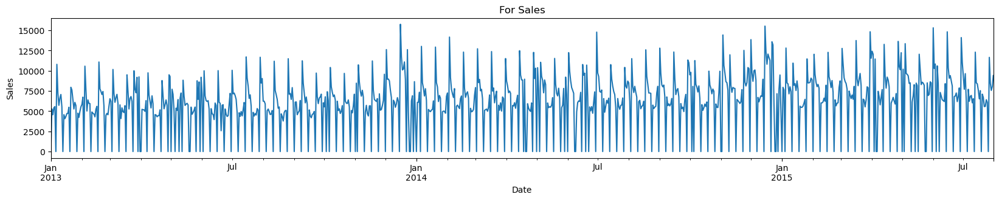

store_29_imputed_data_train columns: 
                                     SARIMAX Results                                      
Dep. Variable:                              Sales   No. Observations:                  900
Model:             SARIMAX(1, 1, 1)x(1, 1, 1, 12)   Log Likelihood               -8527.126
Date:                            Sun, 02 Jul 2023   AIC                          17064.252
Time:                                    21:38:56   BIC                          17088.112
Sample:                                01-01-2013   HQIC                         17073.380
                                     - 06-19-2015                                         
Covariance Type:                              opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.1193      0.085     -1.410      0.158      -0.285       0.0

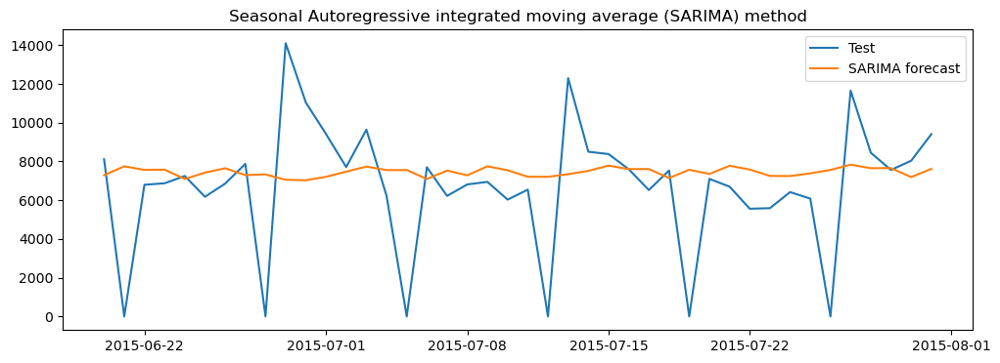

Metrics:     Store    Model  NORM_RMSE_SALES  NORM_MAE_SALES
0     29  SARIMAX         0.239789        0.159816
 VAR Order Selection (* highlights the minimums)  
       AIC         BIC         FPE         HQIC   
--------------------------------------------------
0        22.24       22.34   4.559e+09       22.28
1        22.16       22.28   4.228e+09       22.21
2        22.17       22.31   4.230e+09       22.22
3        22.16       22.32   4.216e+09       22.22
4        22.16       22.35   4.223e+09       22.23
5        22.16       22.36   4.203e+09       22.24
6        22.15       22.38   4.159e+09       22.24
7        22.14       22.39   4.110e+09       22.23
8        22.04       22.31   3.740e+09       22.15
9        22.00       22.30   3.598e+09       22.12
10       21.95      22.26*   3.414e+09       22.07
11       21.93       22.27   3.344e+09       22.06
12       21.93       22.29   3.358e+09       22.07
13       21.93       22.31   3.333e+09       22.07
14      21.89*       

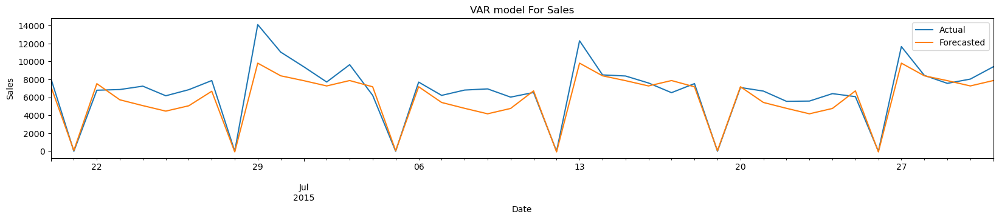

Metrics:     Store Model  NORM_RMSE_SALES  NORM_MAE_SALES  NORM_RMSE_CUSTOMERS  \
0     29   VAR         0.100037        0.075482             0.078403   

   NORM_MAE_CUSTOMERS  
0            0.058082  
                             Statespace Model Results                             
Dep. Variable:     ['Sales', 'Customers']   No. Observations:                  900
Model:                        VARMAX(7,1)   Log Likelihood              -12501.015
                              + intercept   AIC                          25108.031
Date:                    Sun, 02 Jul 2023   BIC                          25362.558
Time:                            21:39:40   HQIC                         25205.262
Sample:                        01-01-2013                                         
                             - 06-19-2015                                         
Covariance Type:                      opg                                         
Ljung-Box (L1) (Q):             1.67, 0.39   Jarqu

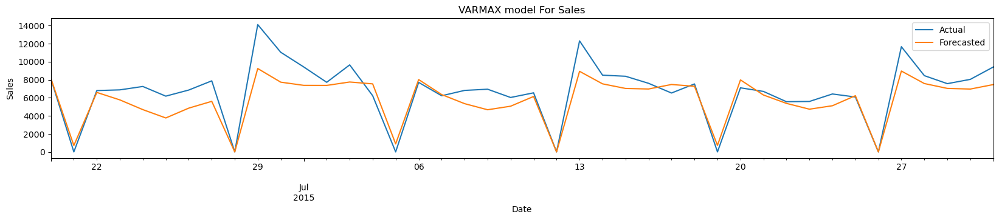

Metrics:     Store   Model  NORM_RMSE_SALES  NORM_MAE_SALES  NORM_RMSE_CUSTOMERS  \
0     29  VARMAX         0.114571        0.085521             0.087575   

   NORM_MAE_CUSTOMERS  
0            0.064333  


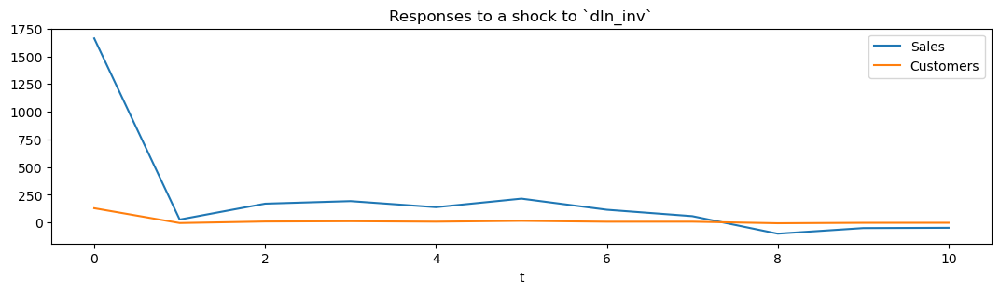

In [69]:
store_id = 29
(store_data_train, store_data_test) = perform_auto_EDA(store_id)

# ARIMA Model
model_metrics_summary = build_ARIMA_model(store_id)
summary_metrics_df = pd.concat([summary_metrics_df, model_metrics_summary])

# SARIMA Model
model_metrics_summary = build_SARIMA_model(store_id)
summary_metrics_df = pd.concat([summary_metrics_df, model_metrics_summary])

# VAR Model
model_metrics_summary = build_VAR_model(store_id, store_data_train, store_data_test)
summary_metrics_df = pd.concat([summary_metrics_df, model_metrics_summary])

# VARMAX Model
model_metrics_summary = build_varmax_model(store_id, store_data_train, store_data_test)
summary_metrics_df = pd.concat([summary_metrics_df, model_metrics_summary])

With a normalized RMSE of 0.10-0.11, which means the forcasted data is 89-90% close to the actual values. VAR, VARMAX performed well

### Store 31

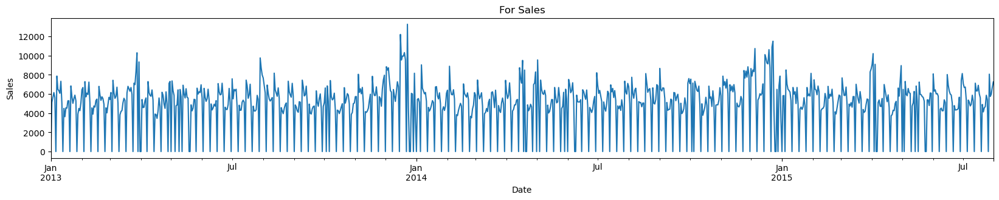

      Store StoreType Assortment  CompetitionDistance  \
0         1         c          a               1270.0   
1         2         a          a                570.0   
2         3         a          a              14130.0   
3         4         c          c                620.0   
4         5         a          a              29910.0   
...     ...       ...        ...                  ...   
1110   1111         a          a               1900.0   
1111   1112         c          c               1880.0   
1112   1113         a          c               9260.0   
1113   1114         a          c                870.0   
1114   1115         d          c               5350.0   

      CompetitionOpenSinceMonth  CompetitionOpenSinceYear  Promo2  \
0                           9.0                    2008.0       0   
1                          11.0                    2007.0       1   
2                          12.0                    2006.0       1   
3                           9.0        

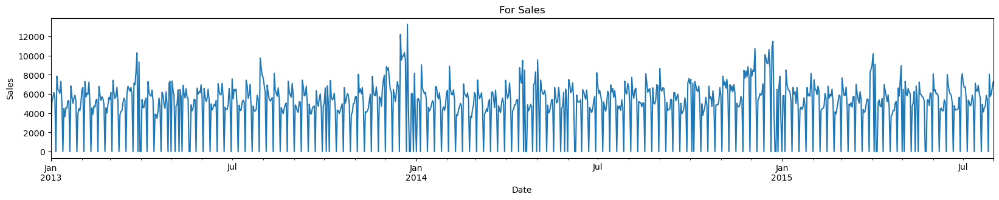

seasonal decomposition


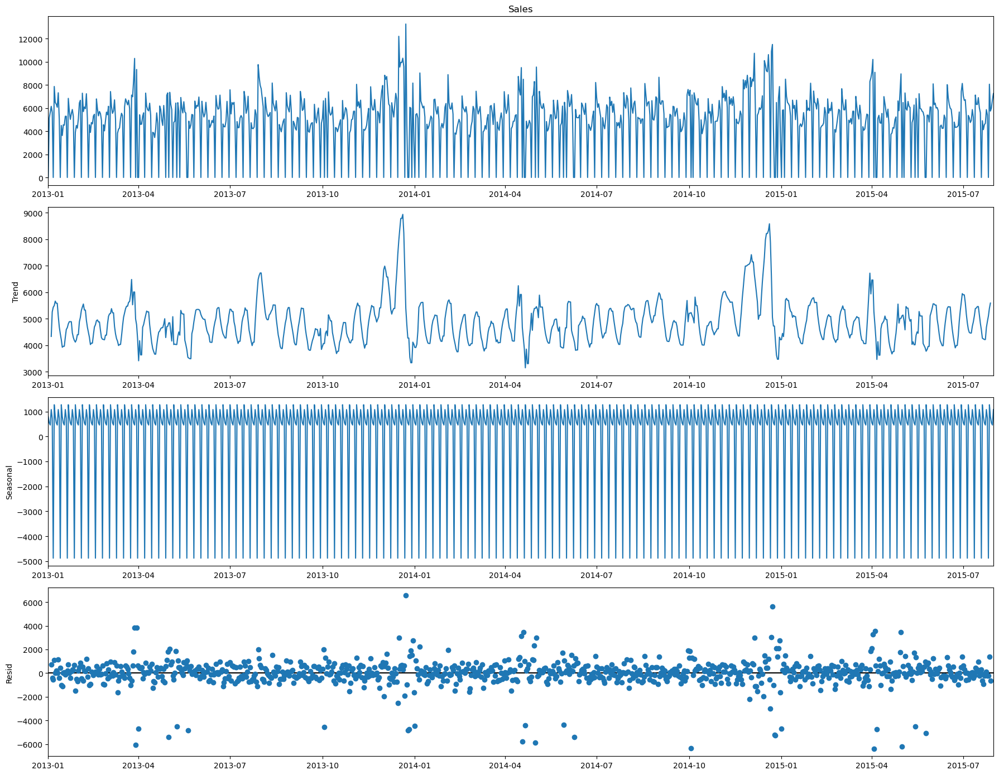

Mean Residual for Sales=0.6498652204683989
stationary test:
For  Sales
****************************************************************************************************
ADF Statistic= -4.884508217518179
P value= 3.737843538844287e-05
 => P-Value = 0.0. Rejecting Null Hypothesis.
 => Series is Stationary.
For  Customers
****************************************************************************************************
ADF Statistic= -5.15396662228537
P value= 1.0908097503608975e-05
 => P-Value = 0.0. Rejecting Null Hypothesis.
 => Series is Stationary.
ACF and PACF for sales


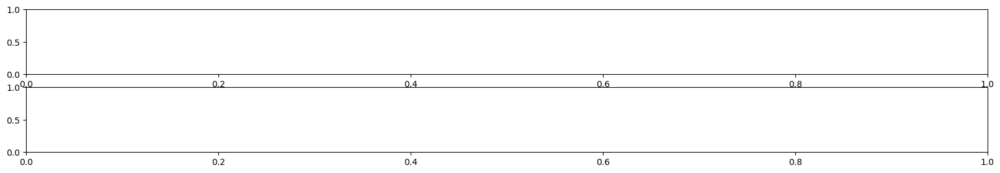

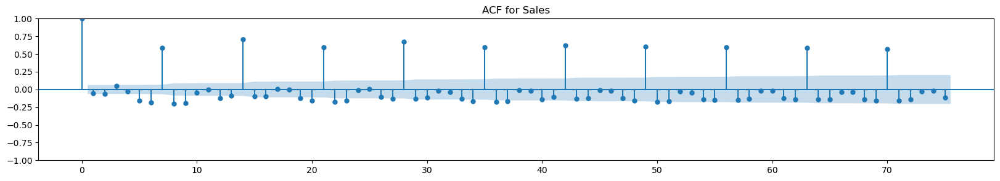

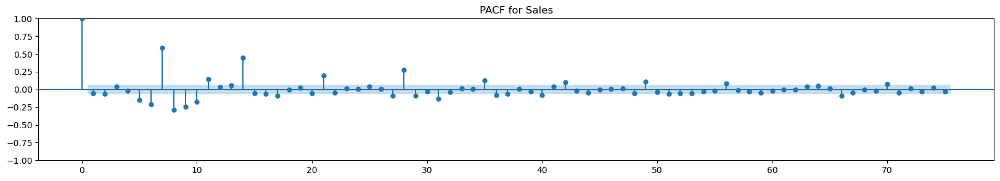

ACF and PACF for Customers


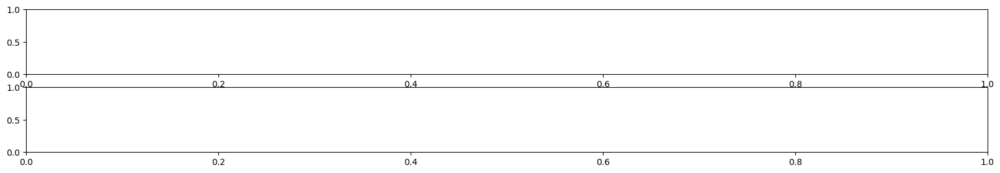

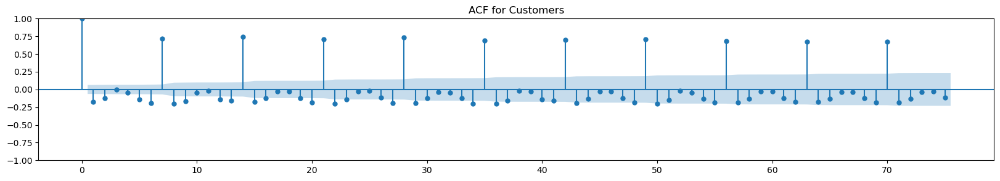

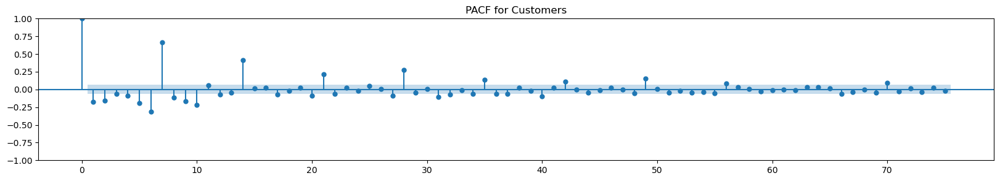

store_31_imputed_data_train columns: 
Index(['Store', 'Sales', 'Customers', 'Open', 'Promo', 'StateHoliday',
       'SchoolHoliday', 'CompetitionDistance', 'Promo2', 'DayOfWeek_2',
       'DayOfWeek_3', 'DayOfWeek_4', 'DayOfWeek_5', 'DayOfWeek_6',
       'DayOfWeek_7', 'CompetitionOpenSince'],
      dtype='object')
Name   ::  Test Stat > C(95%)    =>   Signif  
 ----------------------------------------
Sales  ::  42.79     > 12.3212   =>   True
Customers ::  0.39      > 4.1296    =>   False

Rank: 1

both the series are co integrated, VARMAX can be used directly


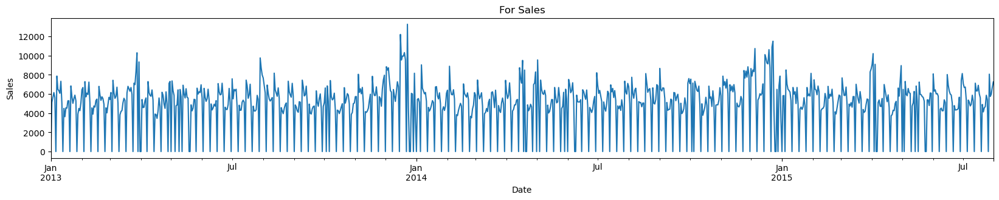

store_31_imputed_data_train columns: 
                               SARIMAX Results                                
Dep. Variable:                  Sales   No. Observations:                  900
Model:                 ARIMA(7, 0, 7)   Log Likelihood               -7902.301
Date:                Sun, 02 Jul 2023   AIC                          15836.601
Time:                        21:39:54   BIC                          15913.440
Sample:                    01-01-2013   HQIC                         15865.954
                         - 06-19-2015                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const       4876.7922    494.528      9.862      0.000    3907.536    5846.048
ar.L1         -0.0474      0.023     -2.095      0.036      -0.092      -0.003
ar.L2         

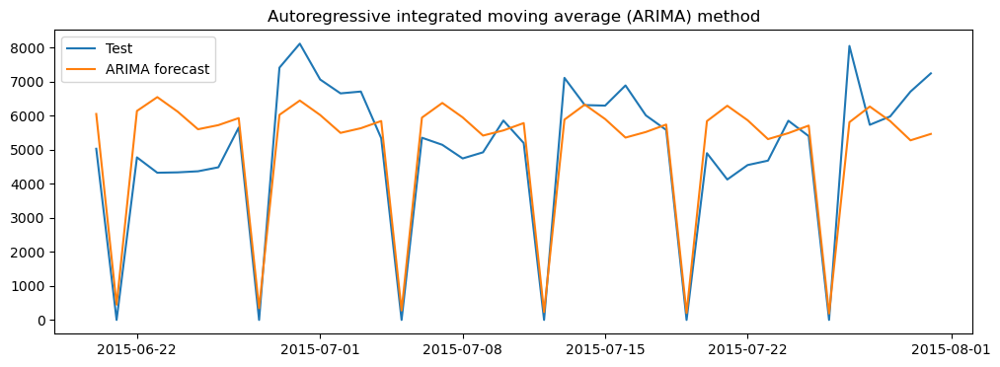

Metrics:     Store  Model  NORM_RMSE_SALES  NORM_MAE_SALES
0     31  ARIMA         0.134424        0.110736


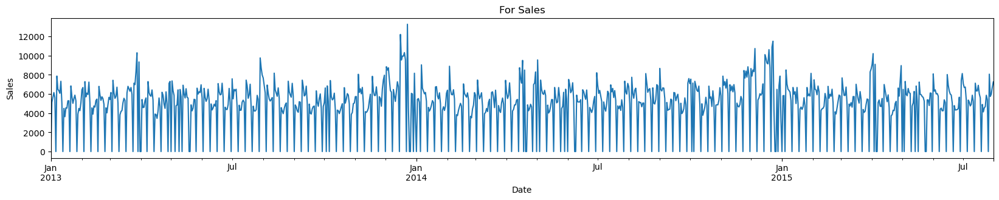

store_31_imputed_data_train columns: 
                                     SARIMAX Results                                      
Dep. Variable:                              Sales   No. Observations:                  900
Model:             SARIMAX(1, 1, 1)x(1, 1, 1, 12)   Log Likelihood               -8101.587
Date:                            Sun, 02 Jul 2023   AIC                          16213.173
Time:                                    21:40:00   BIC                          16237.033
Sample:                                01-01-2013   HQIC                         16222.301
                                     - 06-19-2015                                         
Covariance Type:                              opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.0490      0.031     -1.584      0.113      -0.110       0.0

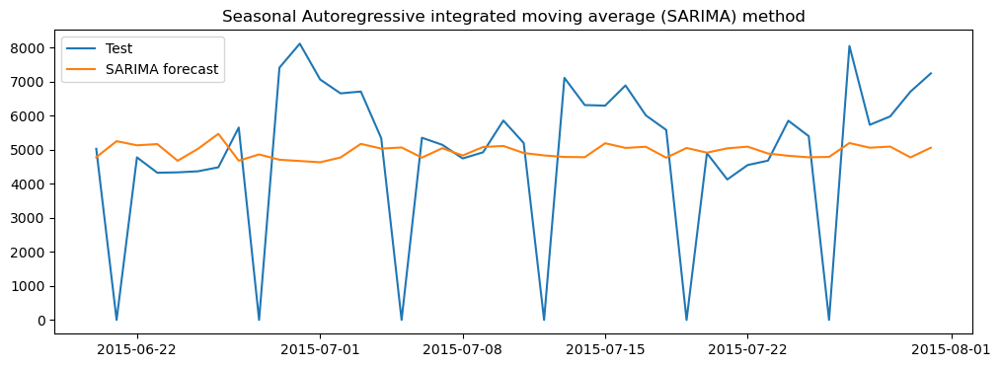

Metrics:     Store    Model  NORM_RMSE_SALES  NORM_MAE_SALES
0     31  SARIMAX         0.281065        0.202202
 VAR Order Selection (* highlights the minimums)  
       AIC         BIC         FPE         HQIC   
--------------------------------------------------
0        21.41       21.51   1.987e+09       21.45
1        21.25      21.37*   1.694e+09       21.30
2        21.24       21.38   1.678e+09       21.29
3        21.24       21.40   1.681e+09       21.30
4        21.24       21.42   1.674e+09       21.31
5        21.24       21.45   1.679e+09       21.32
6        21.23       21.46   1.664e+09       21.32
7        21.22       21.46   1.636e+09       21.31
8        21.18       21.45   1.575e+09       21.28
9        21.17       21.46   1.559e+09       21.28
10       21.14       21.45   1.517e+09       21.26
11       21.12       21.45   1.485e+09      21.25*
12       21.12       21.48   1.492e+09       21.26
13      21.11*       21.49  1.479e+09*       21.26
14       21.12       

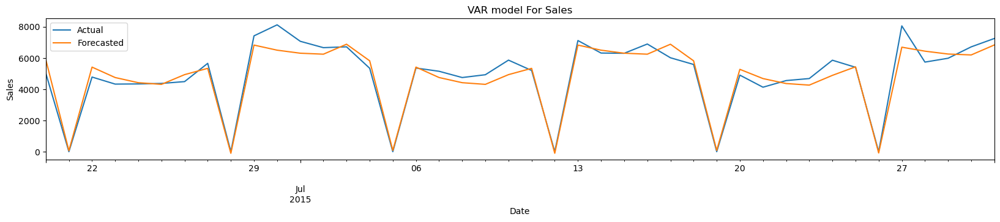

Metrics:     Store Model  NORM_RMSE_SALES  NORM_MAE_SALES  NORM_RMSE_CUSTOMERS  \
0     31   VAR         0.068574        0.052411             0.062588   

   NORM_MAE_CUSTOMERS  
0            0.047924  
                             Statespace Model Results                             
Dep. Variable:     ['Sales', 'Customers']   No. Observations:                  900
Model:                        VARMAX(7,1)   Log Likelihood              -12145.520
                              + intercept   AIC                          24397.039
Date:                    Sun, 02 Jul 2023   BIC                          24651.566
Time:                            21:40:43   HQIC                         24494.271
Sample:                        01-01-2013                                         
                             - 06-19-2015                                         
Covariance Type:                      opg                                         
Ljung-Box (L1) (Q):             0.53, 0.00   Jarqu

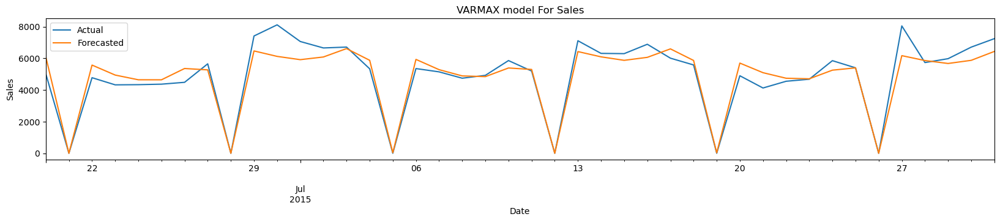

Metrics:     Store   Model  NORM_RMSE_SALES  NORM_MAE_SALES  NORM_RMSE_CUSTOMERS  \
0     31  VARMAX         0.083832        0.060908              0.06788   

   NORM_MAE_CUSTOMERS  
0            0.051827  


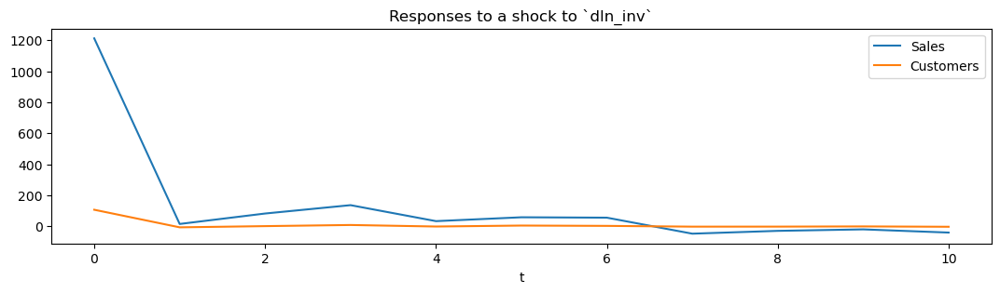

In [70]:
store_id = 31
(store_data_train, store_data_test) = perform_auto_EDA(store_id)

# ARIMA Model
model_metrics_summary = build_ARIMA_model(store_id)
summary_metrics_df = pd.concat([summary_metrics_df, model_metrics_summary])

# SARIMA Model
model_metrics_summary = build_SARIMA_model(store_id)
summary_metrics_df = pd.concat([summary_metrics_df, model_metrics_summary])

# VAR Model
model_metrics_summary = build_VAR_model(store_id, store_data_train, store_data_test)
summary_metrics_df = pd.concat([summary_metrics_df, model_metrics_summary])

# VARMAX Model
model_metrics_summary = build_varmax_model(store_id, store_data_train, store_data_test)
summary_metrics_df = pd.concat([summary_metrics_df, model_metrics_summary])

With a normalized RMSE of 0.06-0.08, which means the forcasted data is 92-94% close to the actual values. VAR performed well

### Store 46

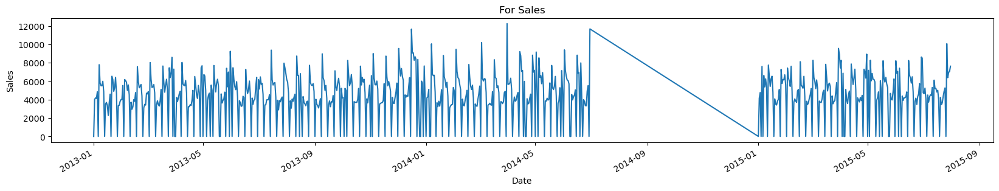

      Store StoreType Assortment  CompetitionDistance  \
0         1         c          a               1270.0   
1         2         a          a                570.0   
2         3         a          a              14130.0   
3         4         c          c                620.0   
4         5         a          a              29910.0   
...     ...       ...        ...                  ...   
1110   1111         a          a               1900.0   
1111   1112         c          c               1880.0   
1112   1113         a          c               9260.0   
1113   1114         a          c                870.0   
1114   1115         d          c               5350.0   

      CompetitionOpenSinceMonth  CompetitionOpenSinceYear  Promo2  \
0                           9.0                    2008.0       0   
1                          11.0                    2007.0       1   
2                          12.0                    2006.0       1   
3                           9.0        

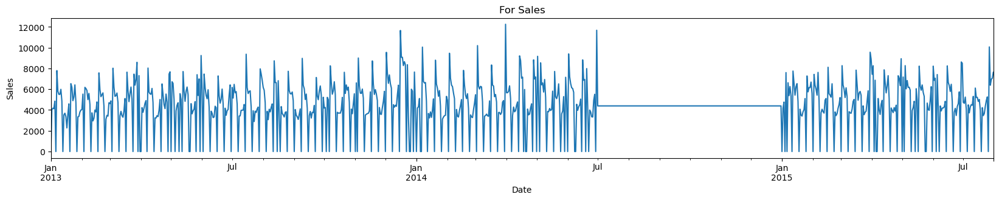

seasonal decomposition


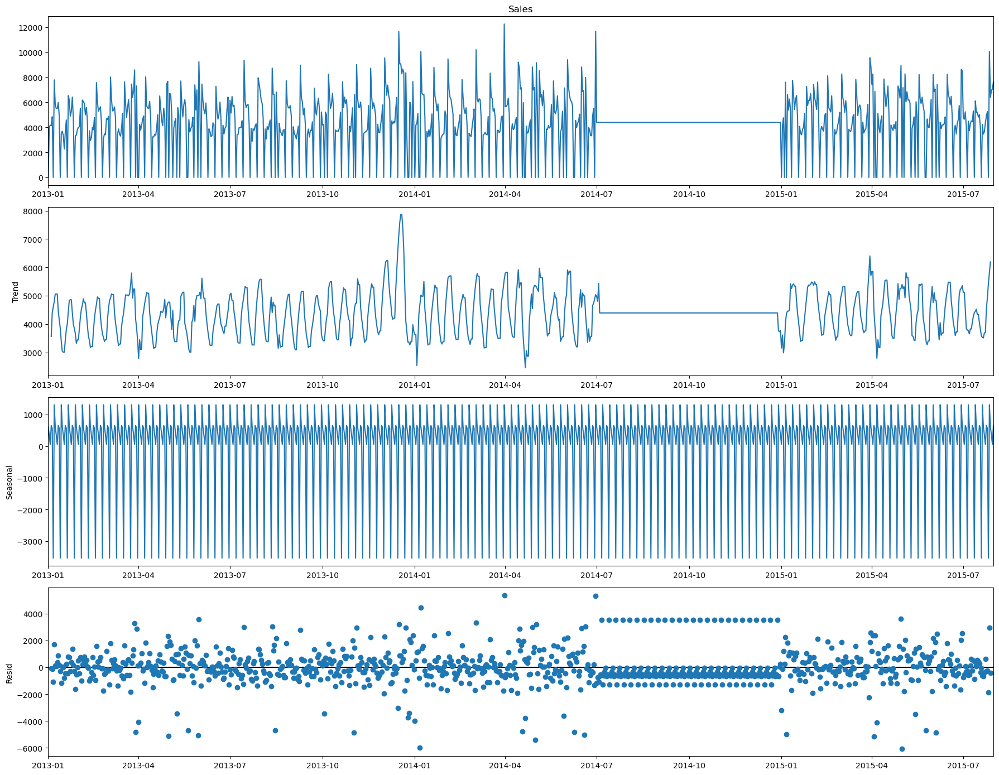

Mean Residual for Sales=0.15751794556212279
stationary test:
For  Sales
****************************************************************************************************
ADF Statistic= -6.195528506367497
P value= 5.978352230772064e-08
 => P-Value = 0.0. Rejecting Null Hypothesis.
 => Series is Stationary.
For  Customers
****************************************************************************************************
ADF Statistic= -6.355751551059884
P value= 2.5453826023986588e-08
 => P-Value = 0.0. Rejecting Null Hypothesis.
 => Series is Stationary.
ACF and PACF for sales


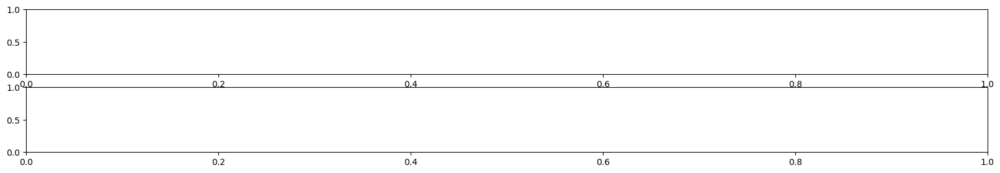

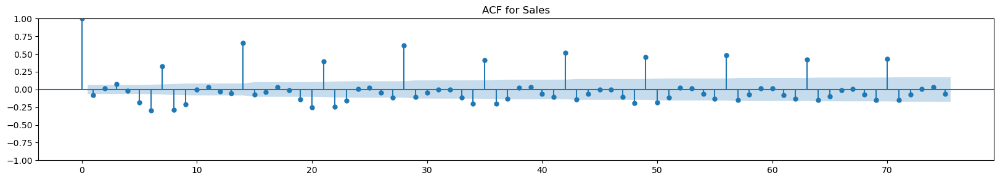

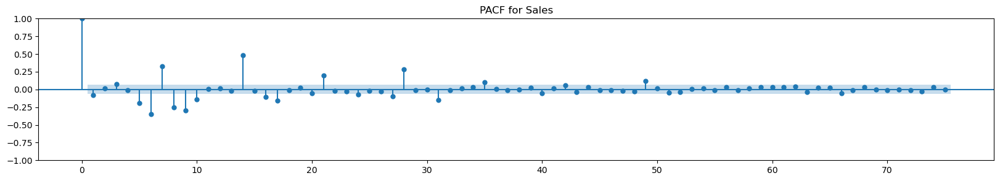

ACF and PACF for Customers


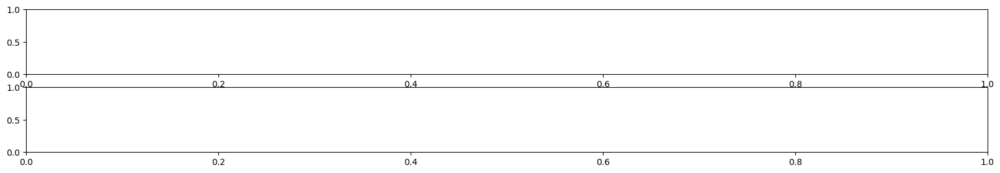

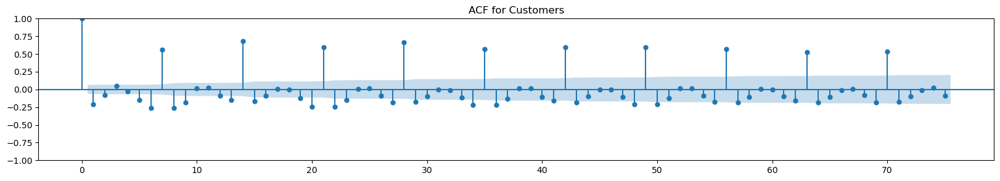

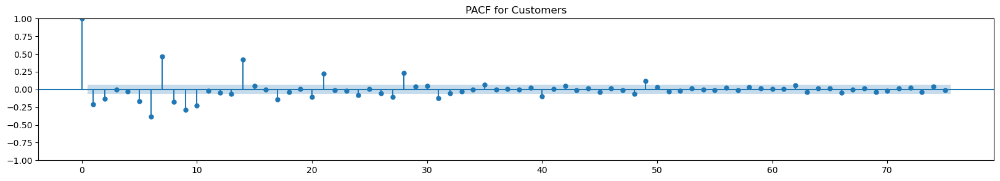

store_46_imputed_data_train columns: 
Index(['Store', 'Sales', 'Customers', 'Open', 'Promo', 'StateHoliday',
       'SchoolHoliday', 'CompetitionDistance', 'Promo2', 'DayOfWeek_2',
       'DayOfWeek_3', 'DayOfWeek_4', 'DayOfWeek_5', 'DayOfWeek_6',
       'DayOfWeek_7', 'CompetitionOpenSince'],
      dtype='object')
Name   ::  Test Stat > C(95%)    =>   Signif  
 ----------------------------------------
Sales  ::  74.24     > 12.3212   =>   True
Customers ::  0.3       > 4.1296    =>   False

Rank: 1

both the series are co integrated, VARMAX can be used directly


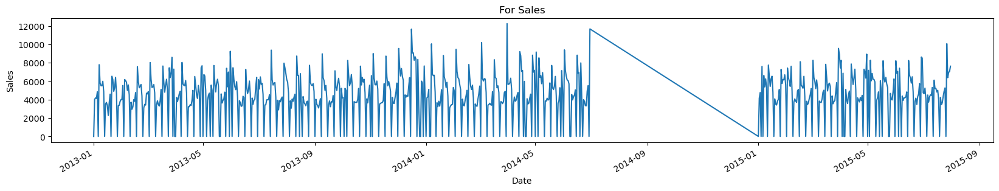

store_46_imputed_data_train columns: 
                               SARIMAX Results                                
Dep. Variable:                  Sales   No. Observations:                  900
Model:                 ARIMA(7, 0, 7)   Log Likelihood               -7942.756
Date:                Sun, 02 Jul 2023   AIC                          15917.511
Time:                        21:40:57   BIC                          15994.350
Sample:                    01-01-2013   HQIC                         15946.864
                         - 06-19-2015                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const       4388.2581     59.469     73.791      0.000    4271.701    4504.815
ar.L1          0.4274      0.397      1.075      0.282      -0.352       1.206
ar.L2         

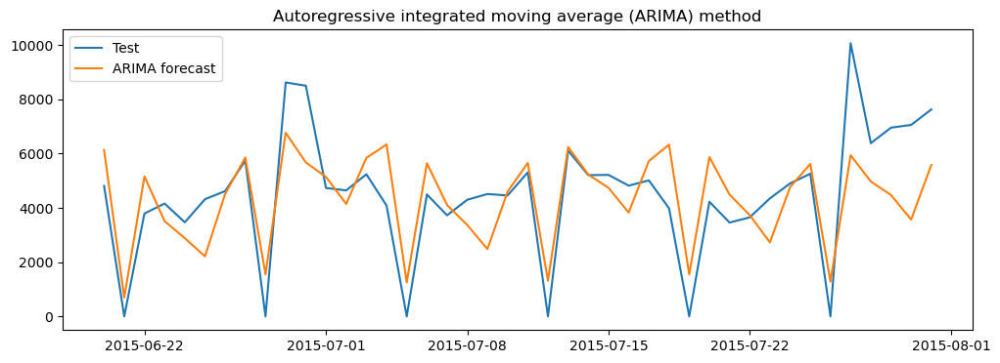

Metrics:     Store  Model  NORM_RMSE_SALES  NORM_MAE_SALES
0     46  ARIMA         0.151941        0.119264


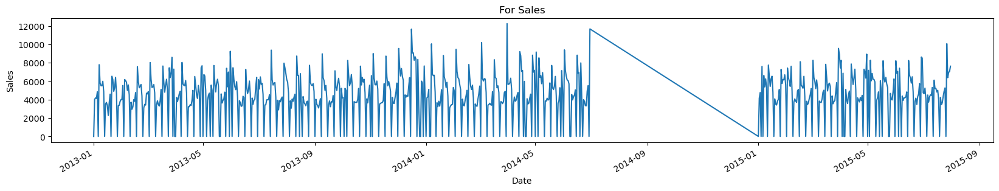

store_46_imputed_data_train columns: 
                                     SARIMAX Results                                      
Dep. Variable:                              Sales   No. Observations:                  900
Model:             SARIMAX(1, 1, 1)x(1, 1, 1, 12)   Log Likelihood               -8158.121
Date:                            Sun, 02 Jul 2023   AIC                          16326.242
Time:                                    21:41:02   BIC                          16350.102
Sample:                                01-01-2013   HQIC                         16335.370
                                     - 06-19-2015                                         
Covariance Type:                              opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.0693      0.079     -0.876      0.381      -0.224       0.0

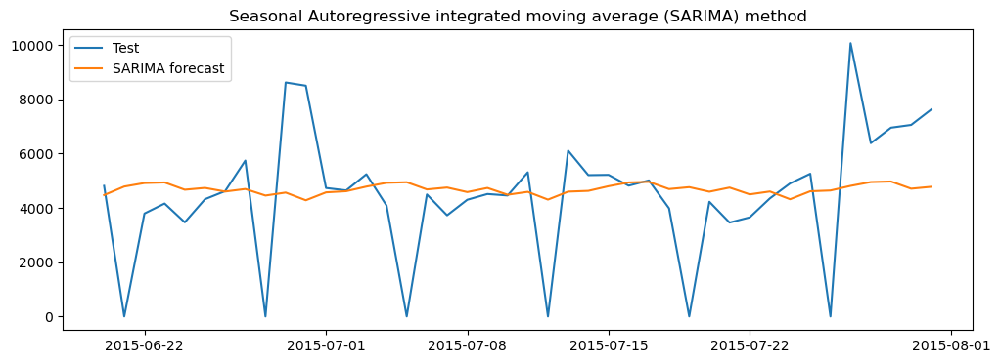

Metrics:     Store    Model  NORM_RMSE_SALES  NORM_MAE_SALES
0     46  SARIMAX         0.230162         0.15678
 VAR Order Selection (* highlights the minimums)  
       AIC         BIC         FPE         HQIC   
--------------------------------------------------
0        21.40       21.50   1.966e+09       21.44
1        21.34       21.46   1.851e+09       21.38
2        21.33       21.47   1.827e+09       21.38
3        21.28      21.45*   1.750e+09       21.35
4        21.27       21.45   1.721e+09       21.34
5        21.27       21.48   1.734e+09       21.35
6        21.27       21.50   1.734e+09       21.36
7        21.25       21.50   1.697e+09       21.35
8        21.22       21.49   1.638e+09       21.32
9        21.18       21.47   1.583e+09       21.29
10       21.16       21.47   1.541e+09       21.28
11       21.14       21.47   1.511e+09      21.26*
12       21.14       21.50   1.515e+09       21.27
13       21.14       21.52   1.513e+09       21.28
14      21.11*       

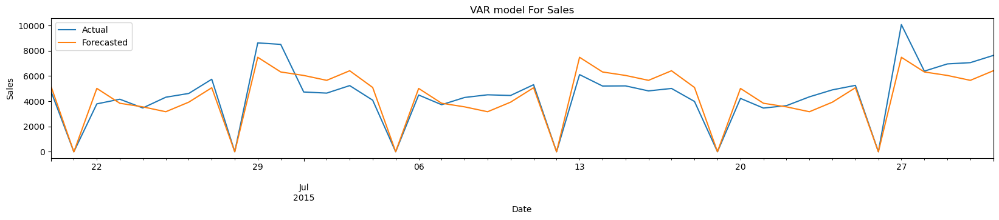

Metrics:     Store Model  NORM_RMSE_SALES  NORM_MAE_SALES  NORM_RMSE_CUSTOMERS  \
0     46   VAR         0.096955        0.076484             0.071362   

   NORM_MAE_CUSTOMERS  
0            0.053616  
                             Statespace Model Results                             
Dep. Variable:     ['Sales', 'Customers']   No. Observations:                  900
Model:                        VARMAX(7,1)   Log Likelihood              -12205.363
                              + intercept   AIC                          24516.727
Date:                    Sun, 02 Jul 2023   BIC                          24771.254
Time:                            21:41:47   HQIC                         24613.958
Sample:                        01-01-2013                                         
                             - 06-19-2015                                         
Covariance Type:                      opg                                         
Ljung-Box (L1) (Q):             0.08, 0.01   Jarqu

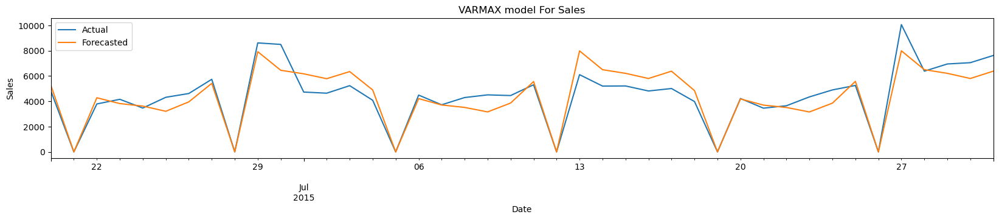

Metrics:     Store   Model  NORM_RMSE_SALES  NORM_MAE_SALES  NORM_RMSE_CUSTOMERS  \
0     46  VARMAX          0.09158        0.070574             0.077076   

   NORM_MAE_CUSTOMERS  
0            0.060134  


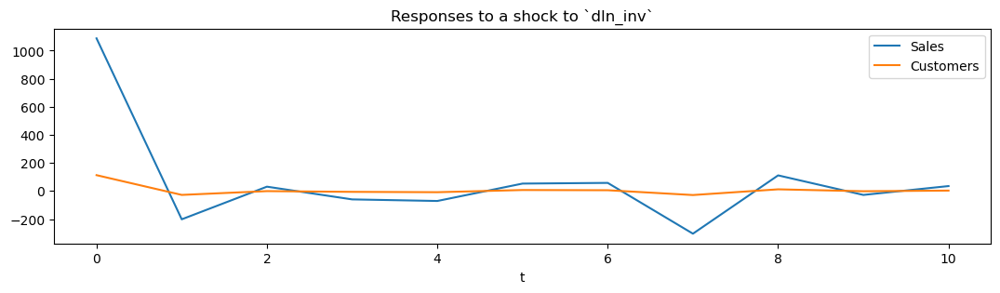

In [71]:
store_id = 46
(store_data_train, store_data_test) = perform_auto_EDA(store_id)

# ARIMA Model
model_metrics_summary = build_ARIMA_model(store_id)
summary_metrics_df = pd.concat([summary_metrics_df, model_metrics_summary])

# SARIMA Model
model_metrics_summary = build_SARIMA_model(store_id)
summary_metrics_df = pd.concat([summary_metrics_df, model_metrics_summary])

# VAR Model
model_metrics_summary = build_VAR_model(store_id, store_data_train, store_data_test)
summary_metrics_df = pd.concat([summary_metrics_df, model_metrics_summary])

# VARMAX Model
model_metrics_summary = build_varmax_model(store_id, store_data_train, store_data_test)
summary_metrics_df = pd.concat([summary_metrics_df, model_metrics_summary])

With a normalized RMSE of 0.9, which means the forcasted data is 91% close to the actual values. VAR, VARMAX performed well

In [72]:
summary_metrics_df

,Store,Model,NORM_RMSE_SALES,NORM_MAE_SALES,NORM_RMSE_CUSTOMERS,NORM_MAE_CUSTOMERS
0,1,ARIMA,0.135395,0.114304,NaN,NaN
0,1,SARIMAX,0.278353,0.198723,NaN,NaN
0,1,VAR,0.074815,0.057053,0.091389,0.068284
0,1,VARMAX,0.073317,0.057060,0.074134,0.057745
0,3,ARIMA,0.113494,0.086116,NaN,NaN
0,3,SARIMAX,0.230728,0.166040,NaN,NaN
0,3,VAR,0.074240,0.046509,0.068050,0.055168
0,3,VARMAX,0.073000,0.048665,0.066325,0.055112
0,8,ARIMA,0.144482,0.110452,NaN,NaN
0,8,SARIMAX,0.276679,0.213082,NaN,NaN


Conclusion: Both VAR, VARMAX are performing well for all the stores